<a href="https://colab.research.google.com/github/mferiansyahrt/increasing_synth_image/blob/main/Testing/DirectSR_Test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Define CycleGAN

In [ ]:
!pip install tensorflow==2.15

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 53.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 42.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 81.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 32.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.6 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.17.0
    Uninstalling wrapt-1.17.0:
      Successfully uninstalled wrapt-1.17.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
  Attempting uninstall: keras
    Found existing installation: keras 3.5.0
    Uninstalling keras-3.5.0:
      Successfully uninstalled keras-3.5.0
  Attempting uninstall: tensorboard
    Found existing installation

In [ ]:
from random import random
from numpy import load
from numpy import zeros
from numpy import ones
from numpy import asarray
from numpy.random import randint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import Activation,PReLU,UpSampling2D
from tensorflow.keras.layers import MultiHeadAttention
from tensorflow.keras.layers import Concatenate, Flatten, Reshape, Lambda, Dense
from tensorflow.keras.layers import LayerNormalization, Add
from tensorflow.keras.layers import Layer
from tensorflow.keras.activations import gelu
from tensorflow.keras import mixed_precision

from os import listdir
from numpy import vstack
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.callbacks import ModelCheckpoint
from matplotlib import pyplot as plt
from sklearn.utils import resample

from datetime import datetime
from tensorflow.keras.models import load_model
import tensorflow as tf
import cv2

from matplotlib import pyplot
import numpy as np
import shutil
from PIL import Image

# example of calculating the frechet inception distance in Keras
import numpy
from numpy import cov
from numpy import trace
from numpy import iscomplexobj
from numpy import asarray
from numpy.random import randint
from scipy.linalg import sqrtm
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from keras.datasets.mnist import load_data
from skimage.transform import resize
from skimage.metrics import structural_similarity as ssim
from skimage import io, color

In [ ]:
tf.__version__

'2.15.0'

In [ ]:
import tensorflow as tf

# Check if GPU is available
gpu_available = tf.config.list_physical_devices('GPU')
print("GPU Available:", gpu_available)

GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:

# # Create a simple tensor and perform a computation
# with tf.device('/GPU:0'):
#     a = tf.constant([[1.0, 2.0, 3.0], [4.0, 5.0, 6.0]])
#     b = tf.constant([[1.0, 2.0, 3.0], [4.0, 5.0, 6.0]])
#     c = tf.matmul(a, b)
#     print(c)

In [ ]:
# from tensorflow.python.client import device_lib

# # List all available devices
# devices = device_lib.list_local_devices()
# for device in devices:
#     print(device)


In [ ]:
!git clone https://www.github.com/keras-team/keras-contrib.git

#Download instance norm. code from the link above.
#Or install keras_contrib using guidelines here: https://github.com/keras-team/keras-contrib
#from instancenormalization import InstanceNormalization
%cd keras-contrib
from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization

Cloning into 'keras-contrib'...
remote: Enumerating objects: 3634, done.
remote: Total 3634 (delta 0), reused 0 (delta 0), pack-reused 3634 (from 1)
Receiving objects: 100% (3634/3634), 861.24 KiB | 26.91 MiB/s, done.
Resolving deltas: 100% (2330/2330), done.
/content/keras-contrib


In [ ]:
# discriminator model (70x70 patchGAN)
# C64-C128-C256-C512
#After the last layer, conv to 1-dimensional output, followed by a Sigmoid function.
# The “axis” argument is set to -1 for instance norm. to ensure that features are normalized per feature map.
def define_discriminator(image_shape,stride):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# source image input
	in_image = Input(shape=image_shape)
	# C64: 4x4 kernel Stride 2x2
	d = Conv2D(64, (4,4), strides=stride, padding='same', kernel_initializer=init)(in_image)
	d = LeakyReLU(alpha=0.2)(d)
	# C128: 4x4 kernel Stride 2x2
	d = Conv2D(128, (4,4), strides=stride, padding='same', kernel_initializer=init)(d)
	d = InstanceNormalization(axis=-1)(d)
	#d = GroupNormalization(groups = -1, axis=-1)(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C256: 4x4 kernel Stride 2x2
	d = Conv2D(256, (4,4), strides=stride, padding='same', kernel_initializer=init)(d)
	d = InstanceNormalization(axis=-1)(d)
	#d = GroupNormalization(groups = -1, axis=-1)(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C512: 4x4 kernel Stride 2x2
    # Not in the original paper. Comment this block if you want.
	d = Conv2D(512, (4,4), strides=stride, padding='same', kernel_initializer=init)(d)
	d = InstanceNormalization(axis=-1)(d)
	#d = GroupNormalization(groups = -1, axis=-1)(d)
	d = LeakyReLU(alpha=0.2)(d)
	# second last output layer : 4x4 kernel but Stride 1x1
	d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
	d = InstanceNormalization(axis=-1)(d)
	#d = GroupNormalization(groups = -1, axis=-1)(d)
	d = LeakyReLU(alpha=0.2)(d)
	# patch output
	patch_out = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
	# define model
	model = Model(in_image, patch_out)
	# compile model
    #The model is trained with a batch size of one image and Adam opt.
    #with a small learning rate and 0.5 beta.
    #The loss for the discriminator is weighted by 50% for each model update.
    #This slows down changes to the discriminator relative to the generator model during training.
	model.compile(loss='mse', optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss_weights=0.5)
	return model

In [ ]:
# # generator a resnet block to be used in the generator
# # residual block that contains two 3 × 3 convolutional layers with the same number of filters on both layers.
# def resnet_block(n_filters, input_layer):
# 	# weight initialization
# 	init = RandomNormal(stddev=0.02)
# 	# first convolutional layer
# 	g = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=init)(input_layer)
# 	g = InstanceNormalization(axis=-1)(g)
# 	g = Activation('relu')(g)
# 	# second convolutional layer
# 	g = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=init)(g)
# 	g = InstanceNormalization(axis=-1)(g)
# 	# concatenate merge channel-wise with input layer
# 	g = Concatenate()([g, input_layer])
# 	return g

# # define the  generator model - encoder-decoder type architecture

# #c7s1-k denote a 7×7 Convolution-InstanceNorm-ReLU layer with k filters and stride 1.
# #dk denotes a 3 × 3 Convolution-InstanceNorm-ReLU layer with k filters and stride 2.
# # Rk denotes a residual block that contains two 3 × 3 convolutional layers
# # uk denotes a 3 × 3 fractional-strided-Convolution InstanceNorm-ReLU layer with k filters and stride 1/2

# #The network with 6 residual blocks consists of:
# #c7s1-64,d128,d256,R256,R256,R256,R256,R256,R256,u128,u64,c7s1-3

# #The network with 9 residual blocks consists of:
# #c7s1-64,d128,d256,R256,R256,R256,R256,R256,R256,R256,R256,R256,u128, u64,c7s1-3

# def define_generator(image_shape, n_resnet=9):
# 	# weight initialization
# 	init = RandomNormal(stddev=0.02)
# 	# image input
# 	in_image = Input(shape=image_shape)
# 	# c7s1-64
# 	g = Conv2D(64, (7,7), padding='same', kernel_initializer=init)(in_image)
# 	g = InstanceNormalization(axis=-1)(g)
# 	g = Activation('relu')(g)
# 	# d128
# 	g = Conv2D(128, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
# 	g = InstanceNormalization(axis=-1)(g)
# 	g = Activation('relu')(g)
# 	# d256
# 	g = Conv2D(256, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
# 	g = InstanceNormalization(axis=-1)(g)
# 	g = Activation('relu')(g)
# 	# R256
# 	for _ in range(n_resnet):
# 		g = resnet_block(256, g)
# 	# u128
# 	g = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
# 	g = InstanceNormalization(axis=-1)(g)
# 	g = Activation('relu')(g)
# 	# u64
# 	g = Conv2DTranspose(64, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
# 	g = InstanceNormalization(axis=-1)(g)
# 	g = Activation('relu')(g)
# 	# c7s1-3
# 	g = Conv2D(3, (7,7), padding='same', kernel_initializer=init)(g)
# 	g = InstanceNormalization(axis=-1)(g)
# 	out_image = Activation('tanh')(g)
# 	# define model
# 	model = Model(in_image, out_image)
# 	return model

In [ ]:
#U-Net ViT Generator

def basic_block(layer,numfilter,alpha_lrelu,name = None):
  #l = GroupNormalization(groups = -1, axis=-1)(layer)
  l = InstanceNormalization(axis=-1)(layer)
  l = Conv2D(numfilter,(3,3), strides = 1, padding = 'same')(l)
  l = LeakyReLU(alpha = alpha_lrelu,name = name)(l)
  return l

def down_sampling(layer,numfilter):
  l = Conv2D(numfilter, (2,2), strides = 2, padding = 'same')(layer)
  return l

def up_sampling(layer, numfilter):
  l = Conv2DTranspose(numfilter, (3,3), strides = 2, padding = 'same')(layer)
  return l

def positional_embedding(seq_length,dim):
  sequence_length = seq_length
  dimension = dim

  position = tf.range(0,sequence_length,1)[:,np.newaxis]
  position = tf.cast(position,tf.float32)

  even_pos = tf.cast(tf.range(0,dimension,2),tf.float32)
  odd_pos = tf.cast(tf.range(1,dimension,2),tf.float32)
  even_denominator = tf.pow(1000.0,(even_pos/tf.cast(dimension,tf.float32)))
  odd_denominator = tf.pow(1000.0,((odd_pos-1)/tf.cast(dimension,tf.float32)))
  denominator = even_denominator # actually even_denominator == odd_denominator

  even_PE = tf.math.sin(position/denominator)
  odd_PE = tf.math.cos(position/denominator)

  stacked = tf.stack([even_PE,odd_PE],axis = -1)

  PE = tf.reshape(stacked,[sequence_length,dimension])

  return PE

# BASIC BLOCK SEBELUM DOWN ATAU SESUDAH UP SAMPLING MASIH BISA DITAMBAH SATU JIKA MENGIKUTI PAPER (SUDAH DITAMBAHKAN)

def unet_vit_generator(image_shape,num_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,name = None):
  in_image = Input(shape = image_shape)

  # ---- preprocess ----
  x = Conv2D(64, (2,2), padding ='same')(in_image)
  x = LeakyReLU(alpha = alpha_lrelu)(x)

  # ---- ENCODER PART ----
  #first block
  x = basic_block(x, num_features, alpha_lrelu)
  x_d1 = basic_block(x, num_features, alpha_lrelu)
  x = down_sampling(x_d1, num_features)

  #second block
  x = basic_block(x, num_features*2, alpha_lrelu)
  x_d2 = basic_block(x,num_features*2, alpha_lrelu)
  x = down_sampling(x_d2,num_features*2)

  #third block
  x = basic_block(x, num_features*4, alpha_lrelu)
  x_d3 = basic_block(x,num_features*4, alpha_lrelu)
  x = down_sampling(x_d3,num_features*4)

  #fourth block
  x = basic_block(x, num_features*8, alpha_lrelu)
  x_d4 = basic_block(x, num_features*8, alpha_lrelu)
  x = down_sampling(x_d4, num_features*8)
  flatten_shape = x.shape

  # ---- pixel-wise ViT ----
  x = Reshape((flatten_shape[1]*flatten_shape[2],flatten_shape[3]))(x)

  # Define Positional Encoding layer (256,512) by default
  PE = positional_embedding(flatten_shape[1]*flatten_shape[2],num_features*8) #Should be normalized later according to LeakyReLU range
  PE = LeakyReLU(alpha = alpha_lrelu)(PE)
  PE_layer = tf.expand_dims(PE, axis=0)

  class RepeatLayer(Layer):
      def __init__(self, axis=0, **kwargs):
          super(RepeatLayer, self).__init__(**kwargs)
          self.axis = axis

      def call(self, inputs, x):
          repeat_times = tf.shape(x)[0]  # Get the batch size dynamically from 'x'
          return tf.repeat(inputs, repeat_times, axis=self.axis)

      def get_config(self):
          config = super().get_config().copy()
          config.update({
              'axis': self.axis
          })
          return config

  # Custom repeat layer instead of tf.repeat
  PE_layer = RepeatLayer(axis=0)(PE_layer, x)

  # Concatenate positional encoding with input
  x = Concatenate(axis=2)([x, PE_layer])
  x = Dense(num_features * 8)(x)


  # Transformer Encoder Block
  for n in range(transformer_block):
    x_l = LayerNormalization(epsilon = 1e-6)(x)
    x = MultiHeadAttention(num_heads = n_attention_head, key_dim = num_features, dropout = 0.1)(x_l,x_l)
    # Rezero regularization Output = SkipConnection + α⋅MainPath
    x = tf.constant(alpha_reg) * x
    x = Add()([x_l,x])
    x_l2 = LayerNormalization(epsilon = 1e-6)(x)

    # FFN
    x = Dense(4*num_features*8, activation = 'gelu')(x_l2) # masih salah (seharusnya (512,2048))
    x = Dense(num_features*8)(x)                           # masih salah(seharusnya (2048,512))
    # Rezero regularization Output = SkipConnection + α⋅MainPath
    x = tf.constant(alpha_reg) * x
    x = Add()([x_l2,x])

  x = Dense(num_features*8)(x)
  x = Reshape((flatten_shape[1],flatten_shape[2],flatten_shape[3]))(x)

  # ---- DECODER PART ----
  #first block
  x = up_sampling(x,num_features*8)
  x = Concatenate()([x, x_d4])
  x = basic_block(x,num_features*8, alpha_lrelu)
  x = basic_block(x,num_features*8, alpha_lrelu)

  #second block
  x = up_sampling(x,num_features*4)
  x = Concatenate()([x, x_d3])
  x = basic_block(x,num_features*4, alpha_lrelu)
  x = basic_block(x,num_features*4, alpha_lrelu)

  #third block
  x = up_sampling(x,num_features*2)
  x = Concatenate()([x, x_d2])
  x = basic_block(x,num_features*2, alpha_lrelu)
  x = basic_block(x,num_features*2, alpha_lrelu)

  #fourth block
  x = up_sampling(x,num_features)
  x = Concatenate()([x, x_d1])
  x = basic_block(x,num_features, alpha_lrelu)
  x = basic_block(x,num_features, alpha_lrelu, name = name)

  # # ---- postprocess ----
  # x = Conv2D(3, (1,1), padding='same')(x)
  # x = GroupNormalization(groups = -1, axis=-1)(x)
  # out_image = Activation('tanh')(x)

  x = upscale_block(x,2)

  x = Conv2D(64,(3,3),padding = 'same')(x)
  x = InstanceNormalization(axis=-1)(x)
  #x = GroupNormalization(groups = -1, axis=-1)(x)
  x = LeakyReLU(alpha = alpha_lrelu)(x)

  x = Conv2D(32,(3,3),padding = 'same')(x)
  x = InstanceNormalization(axis=-1)(x)
  #x = GroupNormalization(groups = -1, axis=-1)(x)
  x = LeakyReLU(alpha = alpha_lrelu)(x)

  x = Conv2D(3,(1,1),padding = 'same')(x)
  x = InstanceNormalization(axis=-1)(x)
  #x = GroupNormalization(groups = -1, axis=-1)(x)
  out_image = Activation('tanh')(x)

  m = Model(in_image,out_image)
  return m

def upscale_block(x,factor):

  up_model = Conv2D(128, (3,3), padding="same")(x)
  up_model = UpSampling2D( size = factor )(up_model)
  up_model = PReLU(shared_axes=[1,2])(up_model)

  return up_model


In [ ]:
def define_composite_model(g_model_1, d_model, g_model_2, image_shape):
  # Make the generator of interest trainable as we will be updating these weights.
  #by keeping other models constant.
  #Remember that we use this same function to train both generators,
  #one generator at a time.

  # def paralel_output(g_model):
  # 	temp_output = Model(inputs = g_model.input,outputs = g_model.get_layer('temp_output').output)
  # 	# ---- postprocess ----
  # 	x = Conv2D(3, (1,1), padding='same')(temp_output.output)
  # 	x = GroupNormalization(groups = -1, axis=-1)(x)
  # 	out_image = Activation('tanh')(x)
  # 	t = Model(inputs = temp_output.input,outputs = out_image)
  # 	return t

  g_model_1.trainable = True
  # mark discriminator and second generator as non-trainable
  d_model.trainable = False
  g_model_2.trainable = False

  # adversarial loss
  input_gen = Input(shape=image_shape)
  gen1_out = g_model_1(input_gen) #input 256, output 512

  #temp_output1 = Model(inputs = g_model_1.input,outputs = g_model_1.layers[152].output)
  # ---- postprocess ----
  x = Conv2D(3, (1,1), strides =2, padding='same')(gen1_out)
  x = InstanceNormalization(axis=-1)(x)
  #x = GroupNormalization(groups = -1, axis=-1)(x)
  g1_256 = Activation('tanh')(x)
  # g1_256 = Model(inputs = temp_output1.input,outputs = out_image)

  output_d = d_model(g1_256)
  # identity loss
  input_id = Input(shape=image_shape)
  output_id = g_model_1(input_id) #input 256, output 512

  # cycle loss - forward
  output_f = g_model_2(g1_256) #input 512 (harus jadi 256), output 512
  # variabel output_f harus memiliki output dengan ukuran 256 x 256
  x = Conv2D(3, (1,1), strides =2, padding='same')(output_f)
  x.trainable = False
  x = InstanceNormalization(axis=-1)(x)
  #x = GroupNormalization(groups = -1, axis=-1)(x)
  x.trainable = False
  output_f_256 = Activation('tanh')(x)

  # cycle loss - backward
  gen2_out = g_model_2(input_id)

  # temp_output2 = Model(inputs = g_model_2.input,outputs = g_model_2.layers[152].output)
  # temp_output2.trainable = False
  # ---- postprocess ----
  x = Conv2D(3, (2,2), strides =2, padding='same')(gen2_out)
  x.trainable = False  # Freeze the Conv2D layer
  x = InstanceNormalization(axis=-1)(x)
  #x = GroupNormalization(groups = -1, axis=-1)(x)
  x.trainable = False  # Freeze the GroupNormalization layer
  g2_256 = Activation('tanh')(x)
  g2_256.trainable = False  # Freeze the Activation layer
  #g2_256 = Model(inputs = temp_output2.input,outputs = out_image)

  output_b = g_model_1(g2_256) #input 512 (harus jadi 256), output 512
  x = Conv2D(3, (1,1), strides =2, padding='same')(output_b)
  x = InstanceNormalization(axis=-1)(x)
  #x = GroupNormalization(groups = -1, axis=-1)(x)
  output_b_256 = Activation('tanh')(x)

  # define model graph
  model = Model([input_gen, input_id], [output_d, output_id, output_f_256, output_b_256, gen1_out, gen2_out])
  #model = Model([input_gen, input_id], [output_d, output_id, output_f, output_b])
  # define the optimizer
  opt = Adam(learning_rate=0.0002, beta_1=0.5)
  # compile model with weighting of least squares loss and L1 loss
  model.compile(loss=['mse', 'mae', 'mae', 'mae', 'mae', 'mae'],  loss_weights=[1, 5, 10, 10, 5, 5], optimizer=opt)
  #model.compile(loss=['mse', 'mae', 'mae', 'mae'], loss_weights=[1, 5, 10, 10], optimizer=opt)
  return model

In [ ]:
def define_composite_model_2(g_model_1, d_model, g_model_2, image_shape):
  # Make the generator of interest trainable as we will be updating these weights.
  #by keeping other models constant.
  #Remember that we use this same function to train both generators,
  #one generator at a time.

  # def paralel_output(g_model):
  # 	temp_output = Model(inputs = g_model.input,outputs = g_model.get_layer('temp_output').output)
  # 	# ---- postprocess ----
  # 	x = Conv2D(3, (1,1), padding='same')(temp_output.output)
  # 	x = GroupNormalization(groups = -1, axis=-1)(x)
  # 	out_image = Activation('tanh')(x)
  # 	t = Model(inputs = temp_output.input,outputs = out_image)
  # 	return t

  g_model_1.trainable = True
  # mark discriminator and second generator as non-trainable
  d_model.trainable = False
  g_model_2.trainable = False

  # adversarial loss
  input_gen = Input(shape=image_shape)
  gen1_out = g_model_1(input_gen) #input 256, output 512

  #temp_output1 = Model(inputs = g_model_1.input,outputs = g_model_1.layers[152].output)
  # ---- postprocess ----
  x = Conv2D(3, (2,2), strides =2, padding='same')(gen1_out)
  x = InstanceNormalization(axis=-1)(x)
  #x = GroupNormalization(groups = -1, axis=-1)(x)
  g1_256 = LeakyReLU(alpha = 0.01)(x)
  # g1_256 = Model(inputs = temp_output1.input,outputs = out_image)

  output_d = d_model(gen1_out)
  # identity loss
  input_id = Input(shape=image_shape)
  output_id = g_model_1(input_id) #input 256, output 512

  # cycle loss - forward
  output_f = g_model_2(g1_256) #input 512 (harus jadi 256), output 512
  '''
  # variabel output_f harus memiliki output dengan ukuran 256 x 256
  x = Conv2D(3, (1,1), strides =2, padding='same')(output_f)
  x.trainable = False
  x = InstanceNormalization(axis=-1)(x)
  #x = GroupNormalization(groups = -1, axis=-1)(x)
  x.trainable = False
  output_f_256 = Activation('tanh')(x)
  '''
  # cycle loss - backward
  gen2_out = g_model_2(input_id)

  # temp_output2 = Model(inputs = g_model_2.input,outputs = g_model_2.layers[152].output)
  # temp_output2.trainable = False
  # ---- postprocess ----
  x = Conv2D(3, (2,2), strides =2, padding='same')(gen2_out)
  x.trainable = False  # Freeze the Conv2D layer
  x = InstanceNormalization(axis=-1)(x)
  #x = GroupNormalization(groups = -1, axis=-1)(x)
  x.trainable = False  # Freeze the GroupNormalization layer
  g2_256 = LeakyReLU(alpha = 0.01)(x)
  g2_256.trainable = False  # Freeze the Activation layer
  #g2_256 = Model(inputs = temp_output2.input,outputs = out_image)

  output_b = g_model_1(g2_256) #input 512 (harus jadi 256), output 512
  '''
  x = Conv2D(3, (1,1), strides =2, padding='same')(output_b)
  x = InstanceNormalization(axis=-1)(x)
  #x = GroupNormalization(groups = -1, axis=-1)(x)
  output_b_256 = Activation('tanh')(x)
  '''

  # define model graph
  #model = Model([input_gen, input_id], [output_d, output_id, output_f_256, output_b_256, gen1_out, gen2_out])
  model = Model([input_gen, input_id], [output_d, output_id, output_f, output_b])
  #model = Model([input_gen, input_id], [output_d, output_id, output_f, output_b])
  # define the optimizer
  opt = Adam(learning_rate=0.0002, beta_1=0.5)
  # compile model with weighting of least squares loss and L1 loss
  model.compile(loss=['mse', 'mae', 'mae', 'mae'],  loss_weights=[1, 5, 10, 10], optimizer=opt)
  #model.compile(loss=['mse', 'mae', 'mae', 'mae'], loss_weights=[1, 5, 10, 10], optimizer=opt)
  return model

In [ ]:
# load and prepare training images
def load_real_samples(filename):
	# load the dataset
	data = load(filename)
	# unpack arrays
	X1, X2 = data['arr_0'], data['arr_1']
	# scale from [0,255] to [-1,1]
	X1 = (X1 - 127.5) / 127.5
	X2 = (X2 - 127.5) / 127.5
	return [X1, X2]

# select a batch of random samples, returns images and target
#Remember that for real images the label (y) is 1.
def generate_real_samples(dataset, n_samples, patch_shape):
	# choose random instances
	ix = randint(0, dataset.shape[0], n_samples)
	# retrieve selected images
	X = dataset[ix]
	# generate 'real' class labels (1)
	y = ones((n_samples, patch_shape, patch_shape, 1))
	return X, y, ix

def generate_real_samples_512(dataset, ix, n_samples, patch_shape):
	# retrieve selected images
	X = dataset[ix]
	# generate 'real' class labels (1)
	y = ones((n_samples, patch_shape, patch_shape, 1))
	return X, y

# generate a batch of images, returns images and targets
#Remember that for fake images the label (y) is 0.
def generate_fake_samples(g_model, dataset, patch_shape):
	# generate fake images
	X = g_model.predict(dataset)
	# create 'fake' class labels (0)
	y = zeros((len(X), patch_shape, patch_shape, 1))
	return X, y

# periodically save the generator models to file
def save_models(step, g_model_AtoB, g_model_BtoA, c_model_AtoB = None, c_model_BtoA = None, \
                d_model_A = None, d_model_B = None, save_weight = False,target_step = None, \
								save_composite_model = False, save_gnd = True):
	if save_weight == False:
		# save the first generator model
		filename1 = 'g_model_AtoB_%06d.h5' % (step+1)
		g_model_AtoB.save(filename1)
		# save the second generator model
		filename2 = 'g_model_BtoA_%06d.h5' % (step+1)
		g_model_BtoA.save(filename2)
		print('>Saved: %s and %s' % (filename1, filename2))
	elif save_weight == True:
		if save_gnd == True:
			# save the first generator model
			filename1 = 'g_model_AtoB_%06d.weights.h5' % (step+1)
			g_model_AtoB.save_weights(filename1)
			# save the second generator model
			filename2 = 'g_model_BtoA_%06d.weights.h5' % (step+1)
			g_model_BtoA.save_weights(filename2)
			# save the discriminator model A
			filename5 = 'd_model_A_%06d.weights.h5' % (step+1)
			d_model_A.save_weights(filename5)
			# save the discriminator model B
			filename6 = 'd_model_B_%06d.weights.h5' % (step+1)
			d_model_B.save_weights(filename6)
		elif save_gnd == False:
			filename1 = 'skip saving AtoB generator model on iteration %06d' %(step+1)
			filename2 = 'skip saving BtoA generator model on iteration %06d' %(step+1)
			filename5 = 'skip saving AtoB discriminator model on iteration %06d' %(step+1)
			filename6 = 'skip saving BtoA discriminator model on iteration %06d' %(step+1)

		if save_composite_model == True:
			# save the composite model AtoB for resuming training
			filename3 = 'c_model_AtoB_%06d.weights.h5' % (step+1)
			c_model_AtoB.save_weights(filename3)
			# save the composite model BtoA for resuming training
			filename4 = 'c_model_BtoA_%06d.weights.h5' % (step+1)
			c_model_BtoA.save_weights(filename4)
		elif save_composite_model == False:
			filename3 = 'skip saving AtoB composite model on iteration %06d' %(step+1)
			filename4 = 'skip saving BtoA composite model on iteration %06d' %(step+1)

		print('>Saved: %s, %s, %s, %s, %s, and %s' % (filename1, filename2, filename3, filename4, filename5, filename6))

		if step + 1 == target_step:
			# save the first generator model
			filename1 = 'generator_day2night_%06d.h5' % (step+1)
			g_model_AtoB.save(filename1)
			# save the second generator model
			filename2 = 'generator_night2day_%06d.h5' % (step+1)
			g_model_BtoA.save(filename2)
			print('>Saved: %s and %s' % (filename1, filename2))

# periodically generate images using the save model and plot input and output images
def summarize_performance(step, g_model, trainX, name, n_samples=5):
	# select a sample of input images
	X_in, _, _ = generate_real_samples(trainX, n_samples, 0)
	# generate translated images
	X_out, _ = generate_fake_samples(g_model, X_in, 0)
	# scale all pixels from [-1,1] to [0,1]
	X_in = (X_in + 1) / 2.0
	X_out = (X_out + 1) / 2.0
	# plot real images
	for i in range(n_samples):
		pyplot.subplot(2, n_samples, 1 + i)
		pyplot.axis('off')
		pyplot.imshow(X_in[i])
	# plot translated image
	for i in range(n_samples):
		pyplot.subplot(2, n_samples, 1 + n_samples + i)
		pyplot.axis('off')
		pyplot.imshow(X_out[i])
	# save plot to file
	filename1 = '%s_generated_plot_%06d.png' % (name, (step+1))
	pyplot.savefig(filename1)
	pyplot.close()

# update image pool for fake images to reduce model oscillation
# update discriminators using a history of generated images
#rather than the ones produced by the latest generators.
#Original paper recommended keeping an image buffer that stores
#the 50 previously created images.

def update_image_pool(pool, images, max_size=50):
	selected = list()
	for image in images:
		if len(pool) < max_size:
			# stock the pool
			pool.append(image)
			selected.append(image)
		elif random() < 0.5:
			# use image, but don't add it to the pool
			selected.append(image)
		else:
			# replace an existing image and use replaced image
			ix = randint(0, len(pool))
			selected.append(pool[ix])
			pool[ix] = image
	return asarray(selected)

# CREATE DATASET

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
'''!mkdir /content/monet2photo/
%cd /content/monet2photo/
!unzip /content/gdrive/MyDrive/monet2photo.zip'''

'!mkdir /content/monet2photo/\n%cd /content/monet2photo/\n!unzip /content/gdrive/MyDrive/monet2photo.zip'

In [ ]:
!mkdir /content/day2night/
%cd /content/day2night/
#!unzip /content/gdrive/MyDrive/day2night_bdd_ip2.zip # Dataset campuran yang baru
!unzip /content/gdrive/MyDrive/day2night_bdd_ip.zip # Dataset campuran yang lama
#!unzip /content/gdrive/MyDrive/day2night.zip # Dataset asli

/content/day2night
Archive:  /content/gdrive/MyDrive/day2night_bdd_ip.zip
   creating: trainDay/
  inflating: trainDay/6a729de1-7adc57f8.jpg  
  inflating: __MACOSX/trainDay/._6a729de1-7adc57f8.jpg  
  inflating: trainDay/Image_15.jpg   
  inflating: trainDay/Image_29.jpg   
  inflating: trainDay/1c1de1e7-346d6219.jpg  
  inflating: __MACOSX/trainDay/._1c1de1e7-346d6219.jpg  
  inflating: trainDay/6ad23488-70abed67.jpg  
  inflating: __MACOSX/trainDay/._6ad23488-70abed67.jpg  
  inflating: trainDay/6a626ee3-61100bbc.jpg  
  inflating: __MACOSX/trainDay/._6a626ee3-61100bbc.jpg  
  inflating: trainDay/0f145ef9-2fb016d0.jpg  
  inflating: __MACOSX/trainDay/._0f145ef9-2fb016d0.jpg  
  inflating: trainDay/00f7eac8-5193d600.jpg  
  inflating: __MACOSX/trainDay/._00f7eac8-5193d600.jpg  
  inflating: trainDay/Image_28.jpg   
  inflating: trainDay/Image_14.jpg   
  inflating: trainDay/1a2f2112-f566a272.jpg  
  inflating: __MACOSX/trainDay/._1a2f2112-f566a272.jpg  
  inflating: trainDay/0a0c3694

In [ ]:
'''# monet2photo

# load all images in a directory into memory
def load_images(path, size=(256,256)):
	data_list = list()
	# enumerate filenames in directory, assume all are images
	for filename in listdir(path):
		# load and resize the image
		pixels = load_img(path + filename, target_size=size)
		# convert to numpy array
		pixels = img_to_array(pixels)
		# store
		data_list.append(pixels)
	return asarray(data_list)

# dataset path
path = '/content/monet2photo/archive/'

# load dataset A - Monet paintings
dataA_all = load_images(path + 'trainA/')
print('Loaded dataA: ', dataA_all.shape)

#To get a subset of all images, for faster training during demonstration
dataA = resample(dataA_all,
                 replace=False,
                 n_samples=500,
                 random_state=42)
print(f'Use Monet paintings (dataA) with total of {dataA.shape[0]} images for training')

# load dataset B - Photos
dataB_all = load_images(path + 'trainB/')
print('Loaded dataB: ', dataB_all.shape)
#Get a subset of all images, for faster training during demonstration
#We could have just read the list of files and only load a subset, better memory management.
dataB = resample(dataB_all,
                 replace=False,
                 n_samples=500,
                 random_state=42)
print(f'Use Photos (dataB) with total of {dataB.shape[0]} images for training')
'''

"# monet2photo\n\n# load all images in a directory into memory\ndef load_images(path, size=(256,256)):\n\tdata_list = list()\n\t# enumerate filenames in directory, assume all are images\n\tfor filename in listdir(path):\n\t\t# load and resize the image\n\t\tpixels = load_img(path + filename, target_size=size)\n\t\t# convert to numpy array\n\t\tpixels = img_to_array(pixels)\n\t\t# store\n\t\tdata_list.append(pixels)\n\treturn asarray(data_list)\n\n# dataset path\npath = '/content/monet2photo/archive/'\n\n# load dataset A - Monet paintings\ndataA_all = load_images(path + 'trainA/')\nprint('Loaded dataA: ', dataA_all.shape)\n\n#To get a subset of all images, for faster training during demonstration\ndataA = resample(dataA_all,\n                 replace=False,\n                 n_samples=500,\n                 random_state=42)\nprint(f'Use Monet paintings (dataA) with total of {dataA.shape[0]} images for training')\n\n# load dataset B - Photos\ndataB_all = load_images(path + 'trainB/')\npr

In [ ]:
import os

os.remove('/content/day2night/trainDay/.DS_Store')
os.remove('/content/day2night/trainNight/.DS_Store')

day = sorted(os.listdir('/content/day2night/trainDay/'))
night = sorted(os.listdir('/content/day2night/trainNight/'))

In [ ]:
len(day),len(night)

(169, 169)

In [ ]:
# bdd_day2night

# load all images in a directory into memory
def load_images(path, size=(256,256)):
	data_list = list()
	# enumerate filenames in directory, assume all are images
	for filename in listdir(path):
		# load and resize the image
		pixels = load_img(path + filename, target_size=size)
		# convert to numpy array
		pixels = img_to_array(pixels)
		# store
		data_list.append(pixels)
	return asarray(data_list)

# dataset path
path = '/content/day2night/'

# load dataset A - day
dataA_all = load_images(path + 'trainDay/')
print('Loaded dataA: ', dataA_all.shape)

#To get a subset of all images, for faster training during demonstration
dataA = resample(dataA_all,
                 replace=False,
                 n_samples=len(day),
                 random_state=42)
print(f'Use Day Images (dataA) with total of {dataA.shape[0]} images for training')

# load dataset B - night
dataB_all = load_images(path + 'trainNight/')
print('Loaded dataB: ', dataB_all.shape)
#Get a subset of all images, for faster training during demonstration
#We could have just read the list of files and only load a subset, better memory management.
dataB = resample(dataB_all,
                 replace=False,
                 n_samples=len(night),
                 random_state=42)
print(f'Use Night Images (dataB) with total of {dataB.shape[0]} images for training')


Loaded dataA:  (169, 256, 256, 3)
Use Day Images (dataA) with total of 169 images for training
Loaded dataB:  (169, 256, 256, 3)
Use Night Images (dataB) with total of 169 images for training


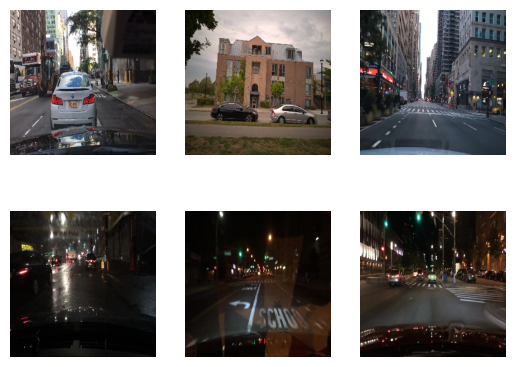

Loaded (169, 256, 256, 3) (169, 256, 256, 3)


In [ ]:
# plot source images
n_samples = 3
for i in range(n_samples):
	plt.subplot(2, n_samples, 1 + i)
	plt.axis('off')
	plt.imshow(dataA[i].astype('uint8'))
# plot target image
for i in range(n_samples):
	plt.subplot(2, n_samples, 1 + n_samples + i)
	plt.axis('off')
	plt.imshow(dataB[i].astype('uint8'))
plt.show()

# load image data
data = [dataA, dataB]

print('Loaded', data[0].shape, data[1].shape)

#Preprocess data to change input range to values between -1 and 1
# This is because the generator uses tanh activation in the output layer
#And tanh ranges between -1 and 1
def preprocess_data(data):
	# load compressed arrays
	# unpack arrays
	X1, X2 = data[0], data[1]
	# scale from [0,255] to [-1,1]
	X1 = (X1 - 127.5) / 127.5
	X2 = (X2 - 127.5) / 127.5
	return [X1, X2]

def preprocess_data_input_edge(data):
	# load compressed arrays
	# unpack arrays
	X1, X2 = data[0], data[1]
	# scale from [0,255] to [0,1]
	X1 = (X1) / 255.0
	X2 = (X2) / 255.0
	return [X1, X2]

dataset = preprocess_data(data)

In [ ]:
# bdd_day2night (HIGH RES DATASET 512 X 512)

# load all images in a directory into memory
def load_images(path, size=(512,512)):
	data_list = list()
	# enumerate filenames in directory, assume all are images
	for filename in listdir(path):
		# load and resize the image
		pixels = load_img(path + filename, target_size=size)
		# convert to numpy array
		pixels = img_to_array(pixels)
		# store
		data_list.append(pixels)
	return asarray(data_list)

# dataset path
path = '/content/day2night/'

# load dataset A - day
dataA_all_512 = load_images(path + 'trainDay/')
print('Loaded dataA_512: ', dataA_all_512.shape)

#To get a subset of all images, for faster training during demonstration
dataA_512 = resample(dataA_all_512,
                 replace=False,
                 n_samples=len(day),
                 random_state=42)
print(f'Use Day Images (dataA_512) with total of {dataA_512.shape[0]} images for training')

# load dataset B - night
dataB_all_512 = load_images(path + 'trainNight/')
print('Loaded dataB_512: ', dataB_all_512.shape)
#Get a subset of all images, for faster training during demonstration
#We could have just read the list of files and only load a subset, better memory management.
dataB_512 = resample(dataB_all_512,
                 replace=False,
                 n_samples=len(night),
                 random_state=42)
print(f'Use Night Images (dataB_512) with total of {dataB_512.shape[0]} images for training')


Loaded dataA_512:  (169, 512, 512, 3)
Use Day Images (dataA_512) with total of 169 images for training
Loaded dataB_512:  (169, 512, 512, 3)
Use Night Images (dataB_512) with total of 169 images for training


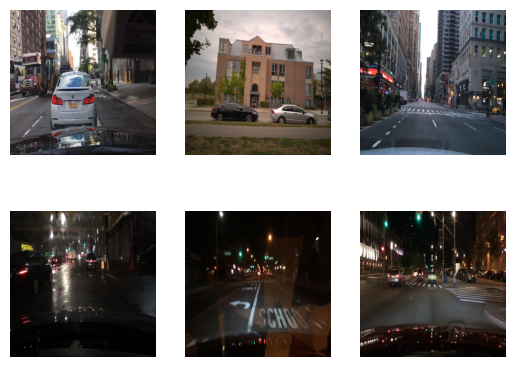

Loaded (169, 512, 512, 3) (169, 512, 512, 3)


In [ ]:
# plot source images
n_samples = 3
for i in range(n_samples):
	plt.subplot(2, n_samples, 1 + i)
	plt.axis('off')
	plt.imshow(dataA_512[i].astype('uint8'))
# plot target image
for i in range(n_samples):
	plt.subplot(2, n_samples, 1 + n_samples + i)
	plt.axis('off')
	plt.imshow(dataB_512[i].astype('uint8'))
plt.show()

# load image data
data_512 = [dataA_512, dataB_512]

print('Loaded', data_512[0].shape, data_512[1].shape)

#Preprocess data to change input range to values between -1 and 1
# This is because the generator uses tanh activation in the output layer
#And tanh ranges between -1 and 1
def preprocess_data(data):
	# load compressed arrays
	# unpack arrays
	X1, X2 = data[0], data[1]
	# scale from [0,255] to [-1,1]
	X1 = (X1 - 127.5) / 127.5
	X2 = (X2 - 127.5) / 127.5
	return [X1, X2]

def preprocess_data_input_edge(data):
	# load compressed arrays
	# unpack arrays
	X1, X2 = data[0], data[1]
	# scale from [0,255] to [0,1]
	X1 = (X1) / 255.0
	X2 = (X2) / 255.0
	return [X1, X2]

dataset_512 = preprocess_data(data_512)

# CREATE DATA TEST for visualization



In [ ]:
main_path = '/content/day2night/trainDay/'
test_path = ['0ab72d5d-af77406b.jpg','0c1eebb0-dbb11761.jpg','0f9fbe4b-081bb395.jpg','0fc07ccd-14991933.jpg','Image_35.jpg','Image_9.jpg']

In [ ]:
# load all images in a directory into memory
def load_images_test(path, test_im, size=(256,256)):
	data_list = list()
	# enumerate filenames in directory, assume all are images
	for filename in test_im:
		# load and resize the image
		pixels = load_img(path + filename, target_size=size)
		# convert to numpy array
		pixels = img_to_array(pixels)
		# store
		data_list.append(pixels)
	return asarray(data_list)

def preprocess_data_test(data):
	# load compressed arrays
	# unpack arrays
	# scale from [0,255] to [-1,1]
	X1 = (data - 127.5) / 127.5
	return X1

In [ ]:
# load dataset A - day
data_test = load_images_test(main_path, test_path)
print('Loaded data test: ', data_test.shape)

Loaded data test:  (6, 256, 256, 3)


In [ ]:
preprocesed_data_test = preprocess_data_test(data_test)

# CREATE DATA TEST

In [ ]:
# from google.colab import drive
# drive.mount('/content/gdrive')

!mkdir /content/sample_data/bdd_data
%cd /content/sample_data/bdd_data
!unzip /content/gdrive/MyDrive/bdd2k.zip

Streaming output truncated to the last 5000 lines.
  inflating: __MACOSX/train/images/._7c0a7d5a-da928c23.jpg  
  inflating: train/images/a1b11f0e-3e9402a2.jpg  
  inflating: __MACOSX/train/images/._a1b11f0e-3e9402a2.jpg  
  inflating: train/images/31081723-b51998d4.jpg  
  inflating: __MACOSX/train/images/._31081723-b51998d4.jpg  
  inflating: train/images/12dbce83-368f9b4c.jpg  
  inflating: __MACOSX/train/images/._12dbce83-368f9b4c.jpg  
  inflating: train/images/3516379e-43f6a6ba.jpg  
  inflating: __MACOSX/train/images/._3516379e-43f6a6ba.jpg  
  inflating: train/images/66808c3c-04f3a0d5.jpg  
  inflating: __MACOSX/train/images/._66808c3c-04f3a0d5.jpg  
  inflating: train/images/00d79c0a-23bea078.jpg  
  inflating: __MACOSX/train/images/._00d79c0a-23bea078.jpg  
  inflating: train/images/57e171f1-00d42305.jpg  
  inflating: __MACOSX/train/images/._57e171f1-00d42305.jpg  
  inflating: train/images/955e0d15-eaf92849.jpg  
  inflating: __MACOSX/train/images/._955e0d15-eaf92849.jpg  


In [ ]:
import os

p_t = '/content/sample_data/bdd_data/train/labels/'
p_v = '/content/sample_data/bdd_data/val/labels/'

os.remove(p_t + '.DS_Store')
os.remove(p_v + '.DS_Store')

In [ ]:
list_night_image = ['0096bcca-c2027ec4.jpg','012a9c41-edad898c.jpg','013ae324-36be6bc2.jpg','03343856-ebf78b5f.jpg',
                    '075d2e1d-971a3fea.jpg','087f969b-b1584c3f.jpg','098ea6fe-b67e6fbb.jpg','0b2867ef-a6ca437b.jpg',
                    '0bb001f6-80239764.jpg','0cf398b3-ce65ab64.jpg','0d933eed-b74c36f8.jpg','0e764680-656be9ac.jpg',
                    '0fe831f2-d3180400.jpg','1041f776-fcce9b98.jpg','11bfabe9-64e974b5.jpg','13620abf-62b6685f.jpg',
                    '14fc6ba0-f47c2960.jpg','196d16dd-e26c2301.jpg','1a3e80fd-9bfaf43b.jpg','1aa6dd36-8feb5194.jpg',
                    '1b883059-144b2678.jpg','1beed53f-d02fafd3.jpg','1bf6d50e-48ea2889.jpg','1c3bf90b-f605473c.jpg',
                    '205c57a8-74c6f50b.jpg','26afd0b9-d88e35cb.jpg','280855ec-e506e694.jpg','2a051b12-a7404163.jpg',
                    '2b923350-d824c179.jpg','2bcdafa3-0013d653.jpg','2e3e8698-72305bda.jpg','2f1b8110-37e9fbad.jpg',
                    '300e816b-f221ac28.jpg','3335e32b-d9fab7f9.jpg','34811fce-1c9200fe.jpg','34bd8b4d-00530890.jpg',
                    '35550c7a-168d1f0e.jpg','366fca59-3696cc7d.jpg','378465c1-894b1418.jpg','38a71b3e-def4acdd.jpg',
                    '3b59c8a5-f0b031cc.jpg','3d3117f0-9365aac0.jpg','3eb86f80-6bb67f5c.jpg','3eec0a14-ab3e67db.jpg',
                    '4283e5c3-5cf933f4.jpg','44babb70-10b348cc.jpg','44d5e383-c58840d5.jpg','453569ca-49948b65.jpg',
                    '465eada1-87de6436.jpg','4899be53-dcc6c017.jpg','4b9fbba7-eb44510f.jpg','4cd5c4d3-935c6463.jpg',
                    '511c0871-7d84ede2.jpg','567b4b61-fd213940.jpg','597f3962-670ad442.jpg','5a1ed081-8b80a48f.jpg',
                    '5b7f03ae-45fe20ac.jpg','5c1e4531-d8ce5e7b.jpg','5c662be9-442b30ef.jpg','5ca490b4-ef154db0.jpg',
                    '5e09670a-515153fd.jpg','5ff99bb6-d7e354c2.jpg','616a276c-c76f9016.jpg','631973a4-ed1655d9.jpg',
                    '64be001d-d9d6743e.jpg','652bcde6-e5b65ebb.jpg','661a6487-0fe5a381.jpg','66269058-5f039fdb.jpg',
                    '67c0f623-67cefe4e.jpg','684715d5-23039d9c.jpg','6bc3cef7-14c3b0b7.jpg','6dcbd3f4-3a4d0439.jpg',
                    '700c3115-5b5b7652.jpg','718c55f5-65f193ec.jpg','738df342-eec9a6d4.jpg','7abfb361-ad1b41e8.jpg',
                    '7f8dc184-1d22a39b.jpg','7fd98fe2-f8290610.jpg','857bf9bc-a83d4e67.jpg','86340950-d91b4146.jpg',
                    '8ee48b61-a9ab1674.jpg','92399a77-e2155d46.jpg','93260910-96c238d9.jpg','932ab3d2-0ef6d829.jpg',
                    '96929662-36778607.jpg','96ced888-e319b06f.jpg','9724d02c-d0e2ba12.jpg','9aae6ee4-72a0a5a8.jpg',
                    'a11b0da5-014d5c45.jpg','a12d8ff4-c8c0b1fc.jpg','a1a8db6b-f5d2991f.jpg','a1c31e7f-148b2fca.jpg',
                    'a279854d-162bd02c.jpg','a310e8f3-65a5066d.jpg','a37192a8-b04db02d.jpg','a7b8aa00-80f77761.jpg',
                    'a93af51d-96dae531.jpg','ab54b6e9-91a74408.jpg','ac986974-93ee1b97.jpg','ad73ec70-c8312a27.jpg',
                    'af0f7447-c370bcc7.jpg','b18ff6ee-eed61648.jpg']

In [ ]:
len(os.listdir('/content/sample_data/bdd_data/train/images/'))

2081

In [ ]:
train_image_path = '/content/day2night/trainDay/'
parent_path = '/content/sample_data/bdd_data/train/images/'

for im in os.listdir(train_image_path):
  if im in os.listdir(parent_path):
    os.remove(parent_path + im)

In [ ]:
for im_night in list_night_image:
  if im_night in os.listdir(parent_path):
    os.remove(parent_path + im_night)

In [ ]:
# load all images in a directory into memory
def load_images(path, size=(256,256)):
	data_list = list()
	# enumerate filenames in directory, assume all are images
	for filename in listdir(path):
		# load and resize the image
		pixels = load_img(path + filename, target_size=size)
		# convert to numpy array
		pixels = img_to_array(pixels)
		# store
		data_list.append(pixels)
	return asarray(data_list)

data_test = load_images('/content/sample_data/bdd_data/train/images/')

In [ ]:
def preprocess_data(data):
	# load compressed arrays
	# unpack arrays
	X1 = data
	# scale from [0,255] to [-1,1]
	X1 = (X1 - 127.5) / 127.5
	return X1

data_test_preprocessed = preprocess_data(data_test)

In [ ]:
data_test_random = data_test_preprocessed[np.random.choice(len(data_test_preprocessed), 50, replace=False)]
data_test_random.shape

(50, 256, 256, 3)

In [ ]:
# NIGHT GROUND TRUTH DATA
a = 'Image_1.jpg'
path_night = '/content/day2night/trainNight/'

for i in os.listdir(path_night):
  if i[0:5] == 'Image':
    os.remove(path_night + i)

In [ ]:
data_night = load_images('/content/day2night/trainNight/',size = (512,512))
data_night_random = data_night[np.random.choice(len(data_night), 50, replace=False)]
data_night_random = preprocess_data(data_night_random)
data_night_random.shape

(50, 512, 512, 3)

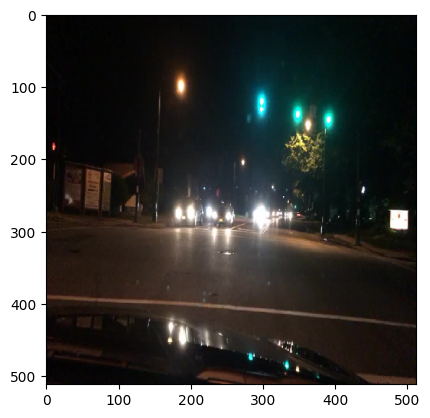

In [ ]:
plt.imshow((data_night_random[0]+1)/2)

# Load Weights LR Disc

In [ ]:
image_shape = dataset[0].shape[1:]
hr_shape = dataset_512[0].shape[1:]
n_features = 128 #64
n_attention_head = 12 #10
transformer_block = 12 #12
alpha_reg = 0.00001
alpha_lrelu = 0.01

g_model_AtoB = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,name = 'temp1')
#g_model_BtoA = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,name = 'temp2')
# generator: B -> A
g_model_BtoA = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu)

#INI WORKS!!!

In [ ]:
folder_name = 'train_superRes_directUVCGAN_100epoch_LRDisc'
main_path ='/content/gdrive/MyDrive/'+ folder_name +'/' + folder_name
epoch = 89
num_dataset = dataset[0].shape[0]

In [ ]:
epoch*num_dataset

15041

In [ ]:
path_AtoB = main_path + '/g_model_AtoB_%06d.weights.h5' %(epoch*num_dataset)
g_model_AtoB.load_weights(path_AtoB)

In [ ]:
day = preprocesed_data_test

In [ ]:
night_generated_LRDisc = g_model_AtoB.predict(day)

1/1 [==============================] - 0s 108ms/step


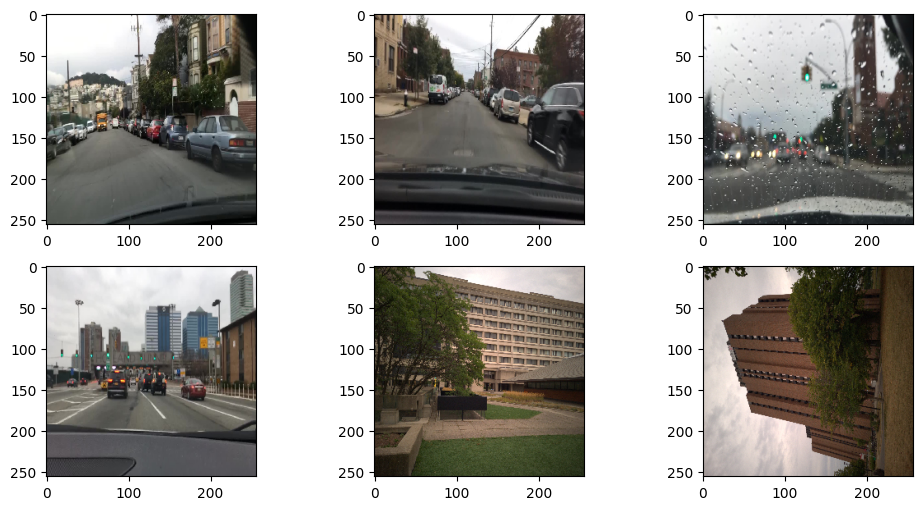

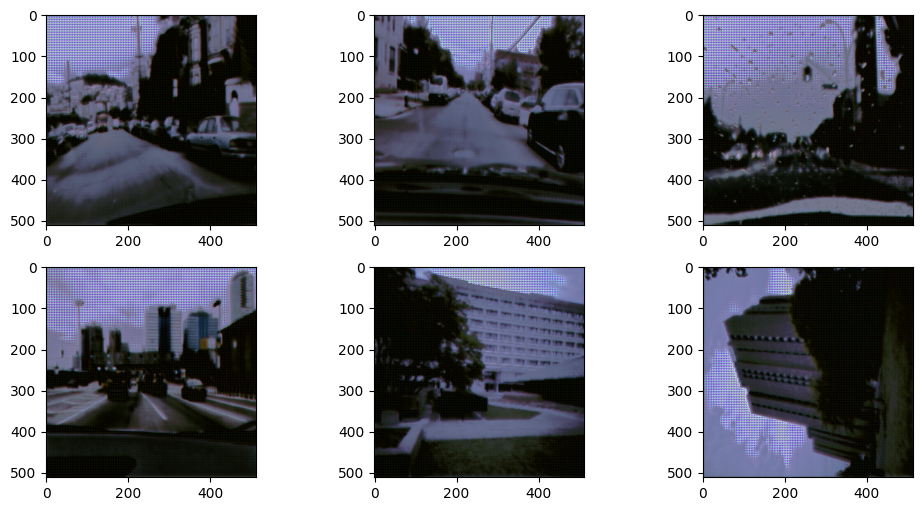

In [ ]:
plt.figure(figsize=(12, 6))
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.imshow((day[i] + 1)/2)

plt.savefig('day_input.png')

plt.figure(figsize=(12, 6))
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.imshow((night_generated_LRDisc[i] + 1)/2)

plt.savefig('night_generated_directsuperres_LRDisc.png')

# Load Weights HR Disc

In [ ]:
image_shape = dataset[0].shape[1:]
hr_shape = dataset_512[0].shape[1:]
n_features = 128 #64
n_attention_head = 12 #10
transformer_block = 12 #12
alpha_reg = 0.00001
alpha_lrelu = 0.01

g_model_AtoB = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,name = 'temp1')
#g_model_BtoA = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,name = 'temp2')
# generator: B -> A
g_model_BtoA = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu)

#INI WORKS!!!

In [ ]:
folder_name = 'train_superRes_directUVCGAN_100epoch_HRDisc'
#folder_name = 'train_superRes_directUVCGAN_100epoch_BMAELoss'
main_path ='/content/gdrive/MyDrive/'+ folder_name +'/' + folder_name
epoch = 89 #--> yang bagus
#epoch = 89

num_dataset = dataset[0].shape[0]

path_AtoB = main_path + '/g_model_AtoB_%06d.weights.h5' %(epoch*num_dataset)
g_model_AtoB.load_weights(path_AtoB)

In [ ]:
day = preprocesed_data_test

night_generated_HRDisc = g_model_AtoB.predict(day)

1/1 [==============================] - 11s 11s/step


In [ ]:
# # TRAIN

# day_dataset = dataset[0]

# night_generated_HRDisc = g_model_AtoB.predict(day_dataset)

In [ ]:
# # TEST

# night_generated_HRDisc_test = g_model_AtoB.predict(data_test_random)

2/2 [==============================] - 3s 483ms/step


In [ ]:
# im_path_test = '/content/gdrive/MyDrive/image_visualization_SR/'
# sample = 0

# im = (night_generated_HRDisc[sample]+1) /2
# im = cv2.cvtColor(im*255, cv2.COLOR_BGR2RGB)
# cv2.imwrite(im_path_test + f'night_generated_HRDisc_{sample}.png',im)

# # im = (day[sample]+1) /2
# im = cv2.cvtColor(im*255, cv2.COLOR_BGR2RGB)
# cv2.imwrite(im_path_test + f'day_input_{sample}.png',im)

IndexError: index 6 is out of bounds for axis 0 with size 6

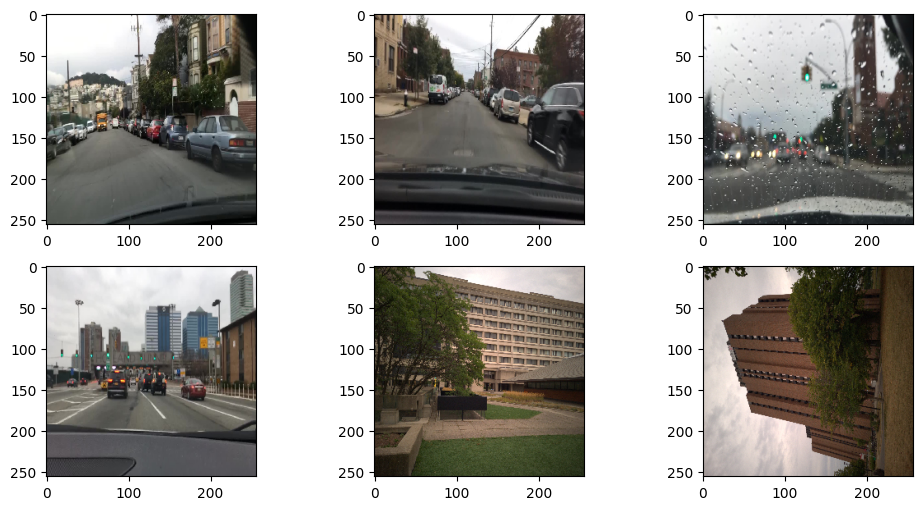

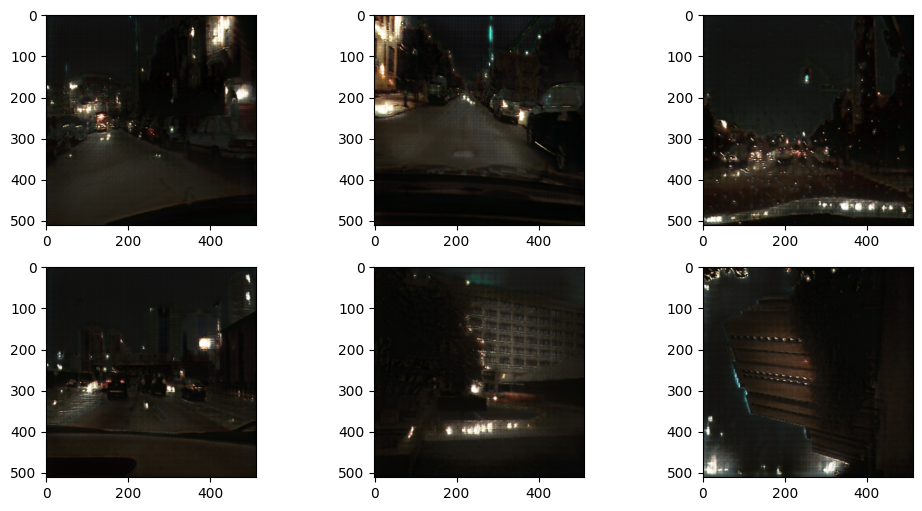

In [ ]:
plt.figure(figsize=(12, 6))
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.imshow((day[i] + 1)/2)

# #plt.savefig('day_input.png')

plt.figure(figsize=(12, 6))
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.imshow((night_generated_HRDisc[i] + 1)/2)

# plt.savefig('night_generated_directsuperres_HRDisc.png')

# FID VISUALIZATION

In [ ]:
from scipy.ndimage import zoom

# scale an array of images to a new size
def scale_images(images, new_shape):
  images_list = list()
  for image in images:
    # resize with nearest neighbor interpolation
    new_image = resize(image, new_shape, 0)
    # store
    images_list.append(new_image)
  return asarray(images_list)

# calculate frechet inception distance
def calculate_fid(model, images1, images2):
 # calculate activations
 act1 = model.predict(images1)
 act2 = model.predict(images2)
 # calculate mean and covariance statistics
 mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
 mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
 # calculate sum squared difference between means
 ssdiff = numpy.sum((mu1 - mu2)**2.0)
 # calculate sqrt of product between cov
 covmean = sqrtm(sigma1.dot(sigma2))
 # check and correct imaginary numbers from sqrt
 if iscomplexobj(covmean):
  covmean = covmean.real
 # calculate score
 fid = ssdiff + trace(sigma1) + trace(sigma2) - 2.0 * trace(covmean)
 return fid,act1,act2,sigma1,sigma2,covmean,ssdiff

# # prepare the inception v3 model
# model = InceptionV3(include_top=False, pooling='avg', input_shape=(299,299,3), weights = 'imagenet', classifier_activation = None)
# model.summary()


Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_10 (InputLayer)       [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d_614 (Conv2D)         (None, 149, 149, 32)         864       ['input_10[0][0]']            
                                                                                                  
 batch_normalization_564 (B  (None, 149, 149, 32)         96        ['conv2d_614[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_566 (Activation  (None, 149, 149, 32)         0         ['batch_normalizati

In [ ]:
# Input Image
day_dataset_512_s = dataset_512[1]
day_dataset_512 = (day_dataset_512_s +1)/2.0
day_unnorm = day_dataset_512 * 255.0
day_unnorm_scaled = scale_images(day_unnorm, (299,299,3))
day_inception = preprocess_input(day_unnorm_scaled)

# Preprocess

# UVCGAN + Upsampling
night_generated_norm_HRDisc = (night_generated_HRDisc + 1)/2.0
night_generated_unnorm_HRDisc = night_generated_norm_HRDisc * 255.0
night_generated_unnorm_scaled_HRDisc = scale_images(night_generated_unnorm_HRDisc, (299,299,3))
night_generated_inception_HRDisc = preprocess_input(night_generated_unnorm_scaled_HRDisc)


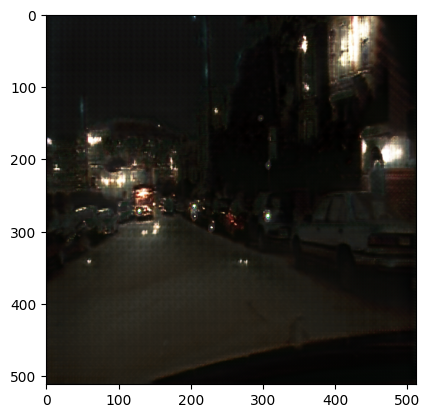

In [ ]:
plt.imshow((night_generated_HRDisc[0]+1)/2)

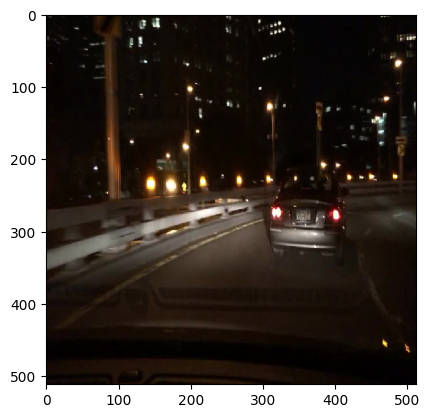

In [ ]:
plt.imshow(day_dataset_512[2])

In [ ]:
base_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_26 (InputLayer)       [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d_2118 (Conv2D)        (None, 149, 149, 32)         864       ['input_26[0][0]']            
                                                                                                  
 batch_normalization_2068 (  (None, 149, 149, 32)         96        ['conv2d_2118[0][0]']         
 BatchNormalization)                                                                              
                                                                                                  
 activation_2070 (Activatio  (None, 149, 149, 32)         0         ['batch_normalizati

In [ ]:
night = scale_images((night_generated_HRDisc+1)/2, (299,299,3))
night.shape

(6, 299, 299, 3)

In [ ]:
mean.shape,feature_1d[0][0]

((2048,), 0.8860059)

1/1 [==============================] - 1s 1s/step


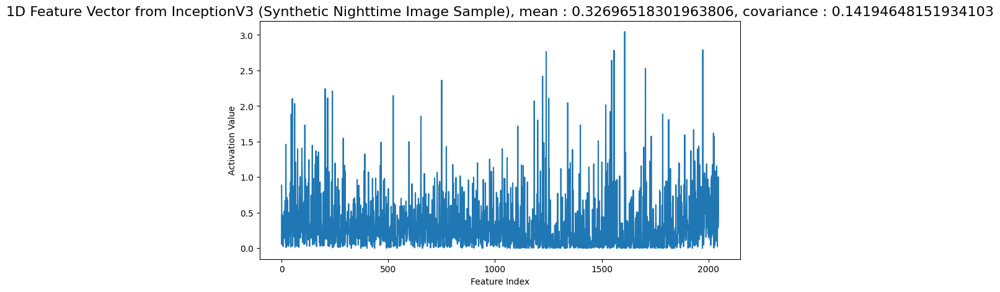

1/1 [==============================] - 1s 1s/step


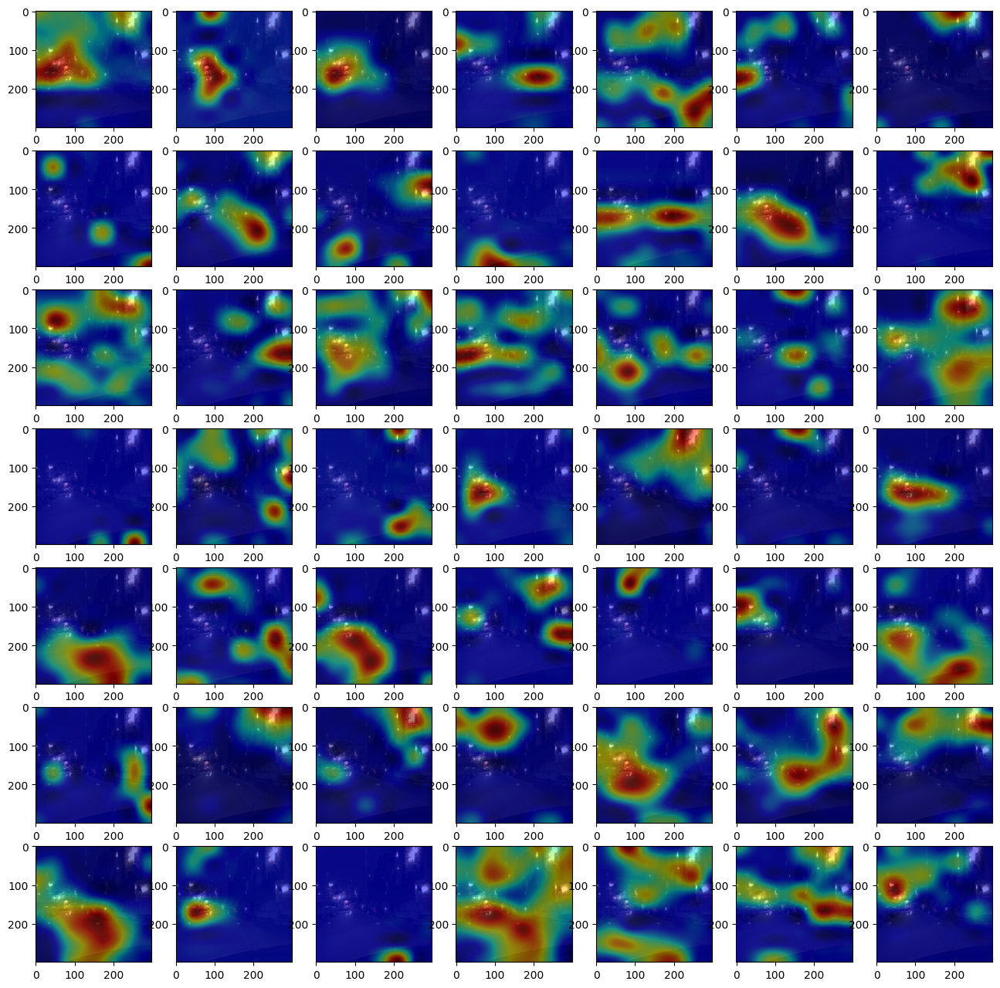

In [ ]:
# Load the pre-trained InceptionV3 model
base_model = InceptionV3(include_top=False, pooling='avg', input_shape=(299,299,3), weights = 'imagenet', classifier_activation = None)

# Define a model that outputs intermediate feature maps
layer_name = 'mixed10'  # Example layer before the GAP
intermediate_model = Model(inputs=base_model.input, outputs=base_model.get_layer(layer_name).output)

sampel = 0
image = night_generated_inception_HRDisc[sampel][np.newaxis,:,:,:]

feature_1d = base_model.predict(image)
mean_,covar = feature_1d.mean(axis=-1), np.cov(feature_1d, rowvar=False)

# Plot the feature vector as a line graph
plt.figure(figsize=(10, 5))
plt.plot(feature_1d[0])
plt.title(f"1D Feature Vector from InceptionV3 (Synthetic Nighttime Image Sample), mean : {mean_[0]}, covariance : {covar}", fontsize=16)
plt.xlabel("Feature Index")
plt.ylabel("Activation Value")
plt.show()

night = scale_images((night_generated_HRDisc+1)/2, (299,299,3))
conv = intermediate_model.predict(image)
scale = 299 / 8
plt.figure(figsize=(16, 16))
for i in range(49):
    plt.subplot(7, 7, i + 1)
    plt.imshow(night[sampel])
    plt.imshow(zoom(conv[0, :,:,i], zoom=(scale, scale)), cmap='jet', alpha=0.5)

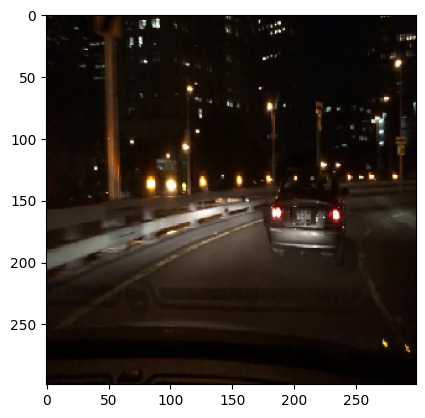

In [ ]:
day = scale_images(day_dataset_512,(299,299,3))
plt.imshow(day[2])

In [ ]:
np.min(conv[0,:,:,10]),np.max(conv[0,:,:,10]),feature_1d[0,10]

(0.0, 0.0, 0.0)

1/1 [==============================] - 2s 2s/step


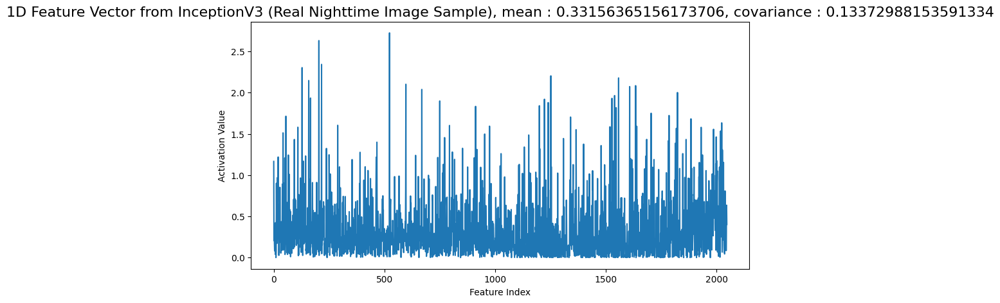

1/1 [==============================] - 1s 1s/step


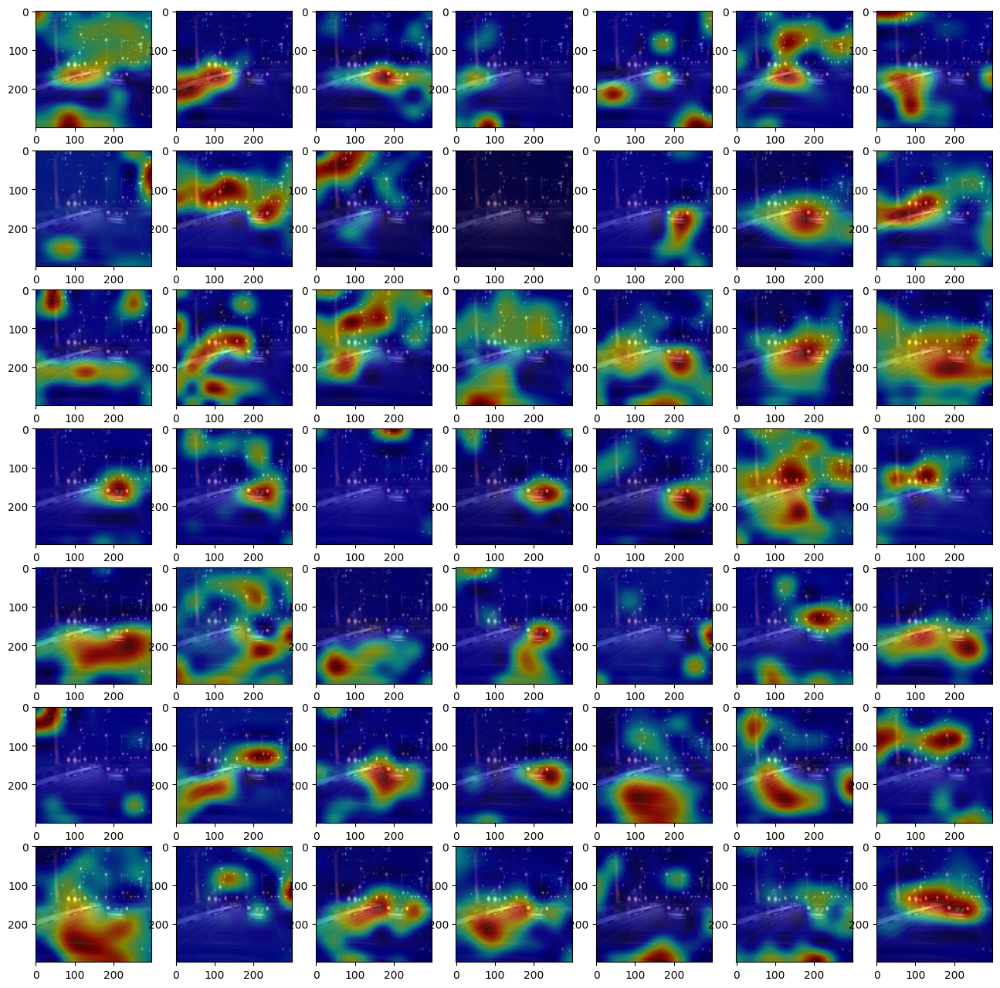

In [ ]:
# Load the pre-trained InceptionV3 model
base_model = InceptionV3(include_top=False, pooling='avg', input_shape=(299,299,3), weights = 'imagenet', classifier_activation = None)

# Define a model that outputs intermediate feature maps
layer_name = 'mixed10'  # Example layer before the GAP
intermediate_model = Model(inputs=base_model.input, outputs=base_model.get_layer(layer_name).output)

sampel = 2
image = day_inception[sampel][np.newaxis,:,:,:]

feature_1d = base_model.predict(image)
mean_,covar = feature_1d.mean(axis=-1), np.cov(feature_1d, rowvar=False)
# Plot the feature vector as a line graph
plt.figure(figsize=(10, 5))
plt.plot(feature_1d[0])
plt.title(f"1D Feature Vector from InceptionV3 (Real Nighttime Image Sample), mean : {mean_[0]}, covariance : {covar}", fontsize=16)
plt.xlabel("Feature Index")
plt.ylabel("Activation Value")
plt.show()

conv = intermediate_model.predict(image)
scale = 299 / 8
plt.figure(figsize=(16, 16))
for i in range(49):
    plt.subplot(7, 7, i + 1)
    plt.imshow(day[2])
    plt.imshow(zoom(conv[0, :,:,i], zoom=(scale, scale)), cmap='jet', alpha=0.5)

# ResNet Visualization

In [ ]:
from tensorflow.keras.applications import ResNet50
res_model = ResNet50()
res_model.summary()

102967424/102967424 [==============================] - 0s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_9 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_9[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                    

In [ ]:
import cv2
import matplotlib.pyplot as plt
from scipy.ndimage import zoom
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
night_generated_norm_HRDisc = (night_generated_HRDisc + 1)/2.0
night_generated_norm_HRDisc = scale_images(night_generated_norm_HRDisc, (224,224,3))
X = np.expand_dims(night_generated_norm_HRDisc, axis=0).astype(np.float32)
X = preprocess_input(night_generated_norm_HRDisc)

In [ ]:
from tensorflow.keras.models import Model
conv_output = res_model.get_layer("conv5_block3_out").output
pred_output = res_model.get_layer("predictions").output
model = Model(res_model.input, outputs=[conv_output, pred_output])

In [ ]:
conv, pred = model.predict(X)
decode_predictions(pred)

35363/35363 [==============================] - 0s 0us/step


[[('n06359193', 'web_site', 0.06374523),
  ('n01930112', 'nematode', 0.056331545),
  ('n03196217', 'digital_clock', 0.047072407),
  ('n03729826', 'matchstick', 0.04369739),
  ('n04286575', 'spotlight', 0.027074404)],
 [('n06359193', 'web_site', 0.06877075),
  ('n01930112', 'nematode', 0.04928584),
  ('n03196217', 'digital_clock', 0.045143086),
  ('n03729826', 'matchstick', 0.037518617),
  ('n04404412', 'television', 0.033479273)],
 [('n06359193', 'web_site', 0.060475096),
  ('n01930112', 'nematode', 0.050505586),
  ('n03196217', 'digital_clock', 0.047738243),
  ('n03729826', 'matchstick', 0.041864015),
  ('n04404412', 'television', 0.030919679)],
 [('n06359193', 'web_site', 0.065970786),
  ('n01930112', 'nematode', 0.054729298),
  ('n03196217', 'digital_clock', 0.048560612),
  ('n03729826', 'matchstick', 0.04156623),
  ('n04404412', 'television', 0.028108867)],
 [('n06359193', 'web_site', 0.06479375),
  ('n01930112', 'nematode', 0.053804062),
  ('n03729826', 'matchstick', 0.046958823),

In [ ]:
conv.shape

(6, 7, 7, 2048)

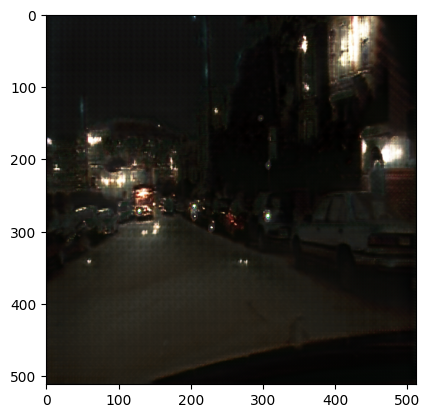

In [ ]:
plt.imshow((night_generated_HRDisc[0]+1)/2)

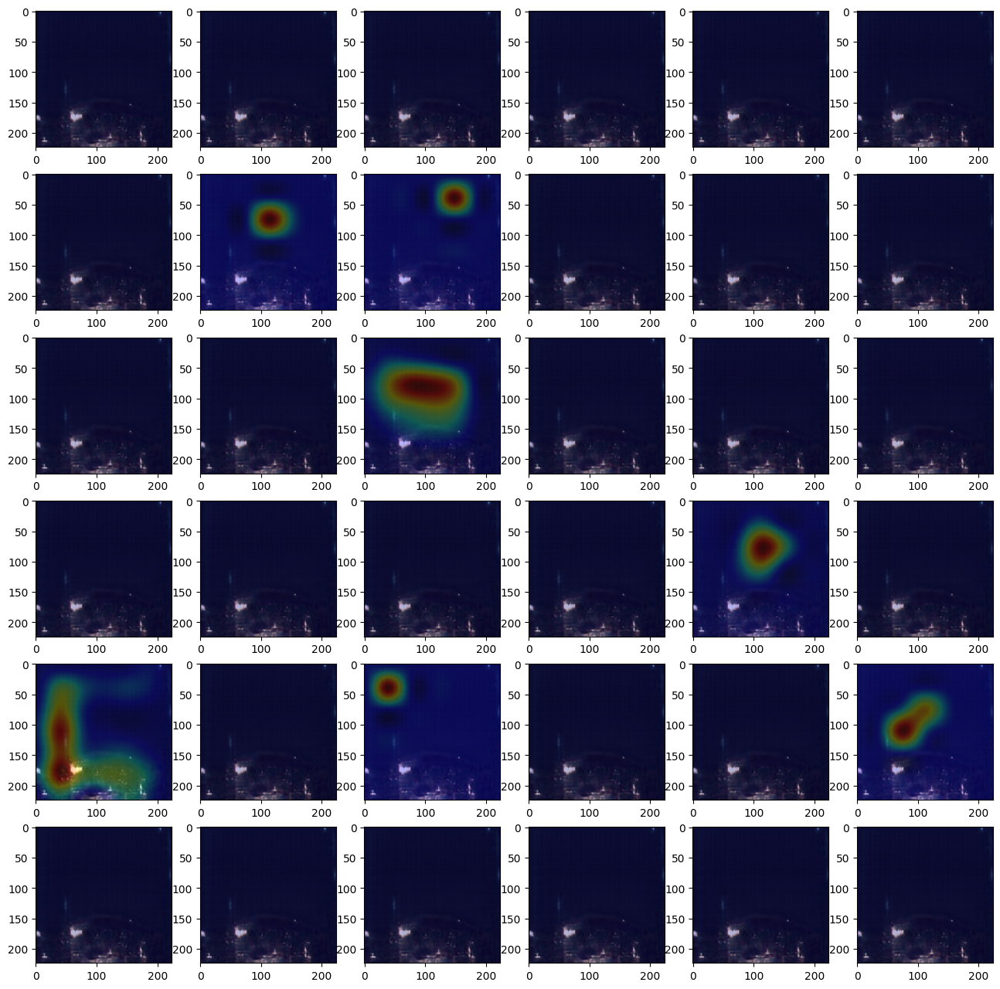

In [ ]:
scale = 224 / 7
plt.figure(figsize=(16, 16))
for i in range(36):
    plt.subplot(6, 6, i + 1)
    plt.imshow((night_generated_HRDisc[0]+1)/2)
    plt.imshow(zoom(conv[0, :,:,i], zoom=(scale, scale)), cmap='jet', alpha=0.3)

# UVC + ESRGAN+ --> HR DISCRIMINATOR

In [ ]:
def residual_dense_block(x):
  x1 = Conv2D(64,(3,3),padding = 'same')(x)
  x1 = LeakyReLU(0.2)(x1)
  x1c = Concatenate()([x,x1])

  x2 = Conv2D(64,(3,3),padding = 'same')(x1c)
  x2 = LeakyReLU(0.2)(x2)
  x2c_conc = Concatenate()([x,x1c,x2]) # disini fiturnya menjadi 256
  x2c_upfeat = Conv2D(x2c_conc.shape[-1],(3,3),padding = 'same')(x)
  x2c = Add()([x2c_upfeat,x2c_conc])

  x3 = Conv2D(64,(3,3),padding = 'same')(x2c)
  x3 = LeakyReLU(0.2)(x3)
  x3c = Concatenate()([x,x1c,x2c,x3])

  x4 = Conv2D(64,(3,3),padding = 'same')(x3c)
  x4 = LeakyReLU(0.2)(x4)
  x4c_conc = Concatenate()([x,x1c,x2c,x4]) # disini fiturnya menjadi 512
  x4c_upfeat = Conv2D(x4c_conc.shape[-1],(3,3),padding = 'same')(x2c)
  x4c = Add()([x4c_upfeat,x4c_conc])

  xo = Conv2D(64,(3,3),padding = 'same')(x4c)

  return xo

def rrdrb(x,beta,gamma,stddev):
  x_gauss = Lambda(lambda x: tf.random.normal(shape = tf.shape(x), mean = 0.0, stddev = stddev))(x)
  x_gauss = Lambda(lambda x: x * gamma)(x_gauss)

  x_rrdb1 = residual_dense_block(x)
  x_rrdb1 = Lambda(lambda x: x * beta)(x_rrdb1)
  x_rrdb1 = Add()([x,x_rrdb1])
  x_rrdb1 = Add()([x_rrdb1,x_gauss])

  x_rrdb2 = residual_dense_block(x_rrdb1)
  x_rrdb2 = Lambda(lambda x: x * beta)(x_rrdb2)
  x_rrdb2 = Add()([x_rrdb1,x_rrdb2])
  x_rrdb2 = Add()([x_rrdb2,x_gauss])

  x_rrdb3 = residual_dense_block(x_rrdb2)
  x_rrdb3 = Lambda(lambda x: x * beta)(x_rrdb3)
  x_rrdb3 = Add()([x_rrdb2,x_rrdb3])
  x_rrdb3 = Add()([x_rrdb3,x_gauss])

  x_rrdb3 = Lambda(lambda x: x * beta)(x_rrdb3)
  x_rrdb = Add()([x,x_rrdb3])

  return x_rrdb

def upscale_block(x,factor):

  up_model = Conv2D(128, (3,3), padding="same")(x)
  up_model = UpSampling2D( size = factor )(up_model)
  up_model = PReLU(shared_axes=[1,2])(up_model)

  return up_model

def up_sampling_sr(layer, numfilter):
  l = Conv2DTranspose(numfilter, (3,3), strides = 2, padding = 'same')(layer)
  l = PReLU(shared_axes=[1,2])(l)
  return l

# gunakan fungsi ini ketika tidak mengcompile, fungsi ini berkaitan dengan train saja
def super_resolution(x,target_shape,num_rrdrb,beta,gamma,stddev):
  #Define enlightenGAN, ESRGAN, dan ESRGAN+ disini

  x = Conv2D(64,(3,3),padding = 'same')(x)
  x = Activation('leaky_relu')(x)
  temp = x

  for j in range(num_rrdrb):
    x = rrdrb(x,beta,gamma,stddev)

  x = Conv2D(64,(3,3),padding = 'same')(x)
  x = Activation('leaky_relu')(x)
  x = Add()([x,temp])

  x = upscale_block(x,target_shape)
  #x = upscale_block(x,target_shape)

  x = Conv2D(64,(3,3),padding = 'same')(x)
  x = Activation('leaky_relu')(x)
  x = Conv2D(32,(3,3),padding = 'same')(x)
  x = Activation('leaky_relu')(x)
  x = Conv2D(3, (7,7), padding='same')(x)
  out_image = Activation('tanh')(x)

  #sr_model.compile(loss='mae', optimizer=Adam(learning_rate=0.0002, beta_1=0.9), loss_weights=0.01)
  return out_image

# BASIC BLOCK SEBELUM DOWN ATAU SESUDAH UP SAMPLING MASIH BISA DITAMBAH SATU JIKA MENGIKUTI PAPER (SUDAH DITAMBAHKAN)

def unet_vit_esrganp_generator(image_shape,target_shape,num_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,num_rrdrb,beta,gamma,stddev,name = None):
  in_image = Input(shape = image_shape)

  # ---- preprocess ----
  x = Conv2D(64, (2,2), padding ='same')(in_image)
  x = LeakyReLU(alpha = alpha_lrelu)(x)

  # ---- ENCODER PART ----
  #first block
  x = basic_block(x, num_features, alpha_lrelu)
  x_d1 = basic_block(x, num_features, alpha_lrelu)
  x = down_sampling(x_d1, num_features)

  #second block
  x = basic_block(x, num_features*2, alpha_lrelu)
  x_d2 = basic_block(x,num_features*2, alpha_lrelu)
  x = down_sampling(x_d2,num_features*2)

  #third block
  x = basic_block(x, num_features*4, alpha_lrelu)
  x_d3 = basic_block(x,num_features*4, alpha_lrelu)
  x = down_sampling(x_d3,num_features*4)

  #fourth block
  x = basic_block(x, num_features*8, alpha_lrelu)
  x_d4 = basic_block(x, num_features*8, alpha_lrelu)
  x = down_sampling(x_d4, num_features*8)
  flatten_shape = x.shape

  # ---- pixel-wise ViT ----
  x = Reshape((flatten_shape[1]*flatten_shape[2],flatten_shape[3]))(x)

  # Define Positional Encoding layer (256,512) by default
  PE = positional_embedding(flatten_shape[1]*flatten_shape[2],num_features*8) #Should be normalized later according to LeakyReLU range
  PE = LeakyReLU(alpha = alpha_lrelu)(PE)
  PE_layer = tf.expand_dims(PE, axis=0)

  class RepeatLayer(Layer):
      def __init__(self, axis=0, **kwargs):
          super(RepeatLayer, self).__init__(**kwargs)
          self.axis = axis

      def call(self, inputs, x):
          repeat_times = tf.shape(x)[0]  # Get the batch size dynamically from 'x'
          return tf.repeat(inputs, repeat_times, axis=self.axis)

      def get_config(self):
          config = super().get_config().copy()
          config.update({
              'axis': self.axis
          })
          return config

  # Custom repeat layer instead of tf.repeat
  PE_layer = RepeatLayer(axis=0)(PE_layer, x)

  # Concatenate positional encoding with input
  x = Concatenate(axis=2)([x, PE_layer])
  x = Dense(num_features * 8)(x)


  # Transformer Encoder Block
  for n in range(transformer_block):
    x_l = LayerNormalization(epsilon = 1e-6)(x)
    x = MultiHeadAttention(num_heads = n_attention_head, key_dim = num_features, dropout = 0.1)(x_l,x_l)
    # Rezero regularization Output = SkipConnection + α⋅MainPath
    x = tf.constant(alpha_reg) * x
    x = Add()([x_l,x])
    x_l2 = LayerNormalization(epsilon = 1e-6)(x)

    # FFN
    x = Dense(4*num_features*8, activation = 'gelu')(x_l2) # masih salah (seharusnya (512,2048))
    x = Dense(num_features*8)(x)                           # masih salah(seharusnya (2048,512))
    # Rezero regularization Output = SkipConnection + α⋅MainPath
    x = tf.constant(alpha_reg) * x
    x = Add()([x_l2,x])

  x = Dense(num_features*8)(x)
  x = Reshape((flatten_shape[1],flatten_shape[2],flatten_shape[3]))(x)

  # ---- DECODER PART ----
  #first block
  x = up_sampling(x,num_features*8)
  x = Concatenate()([x, x_d4])
  x = basic_block(x,num_features*8, alpha_lrelu)
  x = basic_block(x,num_features*8, alpha_lrelu)

  #second block
  x = up_sampling(x,num_features*4)
  x = Concatenate()([x, x_d3])
  x = basic_block(x,num_features*4, alpha_lrelu)
  x = basic_block(x,num_features*4, alpha_lrelu)

  #third block
  x = up_sampling(x,num_features*2)
  x = Concatenate()([x, x_d2])
  x = basic_block(x,num_features*2, alpha_lrelu)
  x = basic_block(x,num_features*2, alpha_lrelu)

  #fourth block
  x = up_sampling(x,num_features)
  x = Concatenate()([x, x_d1])
  x = basic_block(x,num_features, alpha_lrelu)
  x = basic_block(x,num_features, alpha_lrelu, name = name)

  # # ---- postprocess ----
  # x = Conv2D(3, (1,1), padding='same')(x)
  # x = GroupNormalization(groups = -1, axis=-1)(x)
  # out_image = Activation('tanh')(x)

  out_image = super_resolution(x,target_shape,num_rrdrb,beta,gamma,stddev)

  # x = Conv2D(64,(3,3),padding = 'same')(x)
  # x = InstanceNormalization(axis=-1)(x)
  # #x = GroupNormalization(groups = -1, axis=-1)(x)
  # x = LeakyReLU(alpha = alpha_lrelu)(x)

  # x = Conv2D(32,(3,3),padding = 'same')(x)
  # x = InstanceNormalization(axis=-1)(x)
  # #x = GroupNormalization(groups = -1, axis=-1)(x)
  # x = LeakyReLU(alpha = alpha_lrelu)(x)

  # x = Conv2D(3,(7,7),padding = 'same')(x)
  # x = InstanceNormalization(axis=-1)(x)
  # #x = GroupNormalization(groups = -1, axis=-1)(x)
  # out_image = Activation('tanh')(x)

  m = Model(in_image,out_image)
  return m

# def upscale_block(x,factor):

#   up_model = Conv2D(128, (3,3), padding="same")(x)
#   up_model = UpSampling2D( size = factor )(up_model)
#   up_model = PReLU(shared_axes=[1,2])(up_model)

#   return up_model


In [ ]:
image_shape = dataset[0].shape[1:]
hr_shape = dataset_512[0].shape[1:]
target_shape = 2
n_features = 128 #64
n_attention_head = 12 #10
transformer_block = 12 #12
alpha_reg = 0.00001
alpha_lrelu = 0.01
num_rrdrb = 5
beta = 0.01
gamma = 0.01
stddev = 0.01

g_model_AtoB = unet_vit_esrganp_generator(image_shape,target_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,num_rrdrb,beta,gamma,stddev)
#g_model_BtoA = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,name = 'temp2')
# generator: B -> A
g_model_BtoA = unet_vit_esrganp_generator(image_shape,target_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,num_rrdrb,beta,gamma,stddev)


In [ ]:
folder_name = 'train_superResESRGAN+_directUVCGAN_100epoch_HRDisc'
main_path ='/content/gdrive/MyDrive/'+ folder_name +'/' + folder_name
epoch = 89 #--> yang bagus
#epoch = 89
num_dataset = dataset[0].shape[0]

path_AtoB = main_path + '/g_model_AtoB_%06d.weights.h5' %(epoch*num_dataset)
g_model_AtoB.load_weights(path_AtoB)

In [ ]:
day = preprocesed_data_test

night_generated_uvcesr_HRDisc = g_model_AtoB.predict(day)

1/1 [==============================] - 10s 10s/step


In [ ]:
#

In [ ]:
# # TEST

# night_generated_uvcesr_HRDisc_test = g_model_AtoB.predict(data_test_random)

2/2 [==============================] - 7s 3s/step


In [ ]:
im_path_test = '/content/gdrive/MyDrive/image_visualization_SR/'
sample = 5
im = (night_generated_uvcesr_HRDisc[sample]+1) /2
im = cv2.cvtColor(im*255, cv2.COLOR_BGR2RGB)
cv2.imwrite(im_path_test + f'night_generated_uvcesr_HRDisc_{sample}.png',im)

True

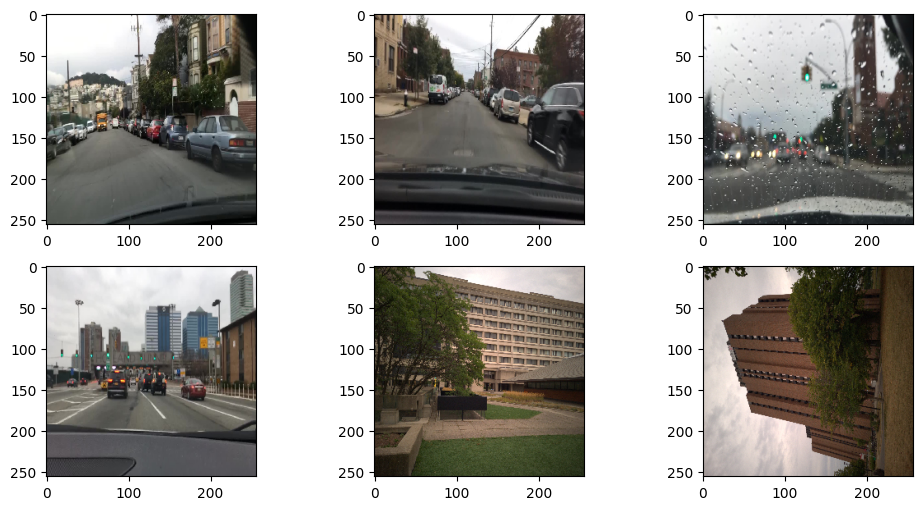

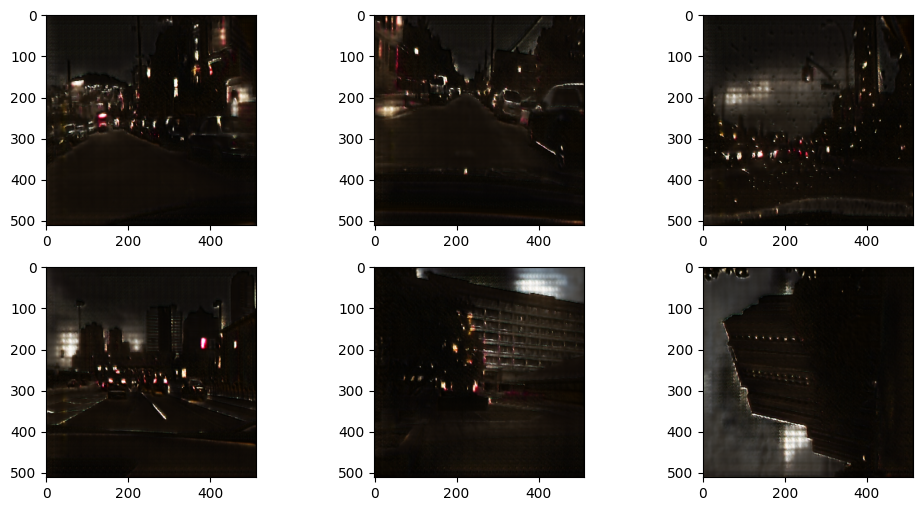

In [ ]:
plt.figure(figsize=(12, 6))
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.imshow((day[i] + 1)/2)

#plt.savefig('day_input.png')

plt.figure(figsize=(12, 6))
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.imshow((night_generated_uvcesr_HRDisc[i] + 1)/2)

# plt.savefig('night_generated_uvcesr_HRDisc.png')

# Load Weights HR&LR Disc

In [ ]:
image_shape = dataset[0].shape[1:]
hr_shape = dataset_512[0].shape[1:]
n_features = 128 #64
n_attention_head = 12 #10
transformer_block = 12 #12
alpha_reg = 0.00001
alpha_lrelu = 0.01

g_model_AtoB = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,name = 'temp1')
#g_model_BtoA = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,name = 'temp2')
# generator: B -> A
g_model_BtoA = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu)

#INI WORKS!!!

In [ ]:
folder_name = 'train_superRes_directUVCGAN_100epoch_HRLRDisc_2'
#folder_name = 'train_superRes_directUVCGAN_100epoch_BMAELoss'
main_path ='/content/gdrive/MyDrive/'+ folder_name +'/' + folder_name
epoch = 90
num_dataset = dataset[0].shape[0]

path_AtoB = main_path + '/g_model_AtoB_%06d.weights.h5' %(epoch*num_dataset)
g_model_AtoB.load_weights(path_AtoB)

In [ ]:
day = preprocesed_data_test

night_generated_HRLRDisc = g_model_AtoB.predict(day)

1/1 [==============================] - 12s 12s/step


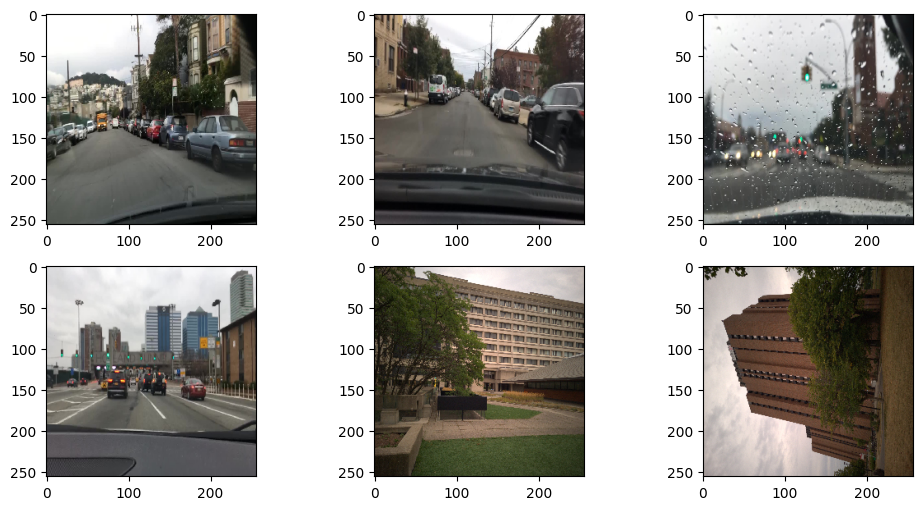

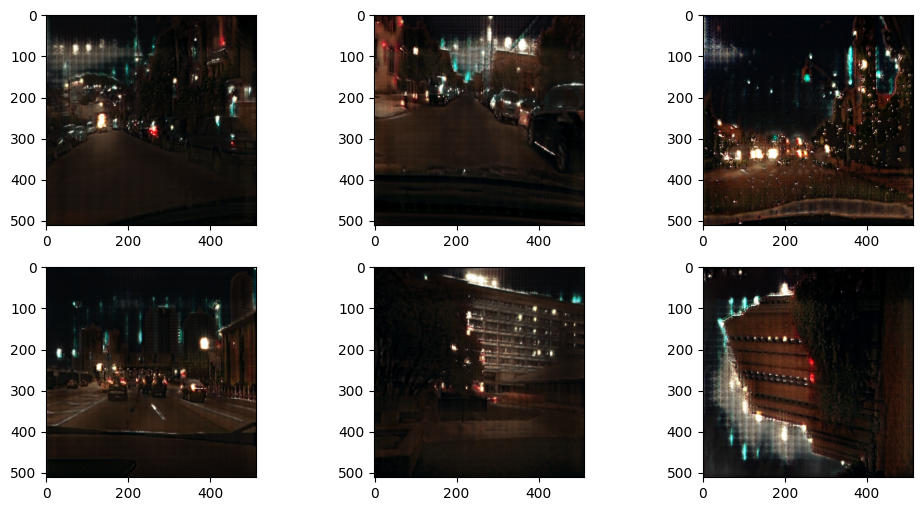

In [ ]:
plt.figure(figsize=(12, 6))
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.imshow((day[i] + 1)/2)

#plt.savefig('day_input.png')

plt.figure(figsize=(12, 6))
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.imshow((night_generated_HRLRDisc[i] + 1)/2)

plt.savefig('night_generated_directsuperres_HRLRDisc.png')

# UVC + EnlightenGAN --> HR Discriminator

In [ ]:
def dense_block(x):
  x1 = Conv2D(64,(3,3),padding = 'same')(x)
  x1 = LeakyReLU(0.2)(x1)
  x1c = Concatenate()([x,x1])

  x2 = Conv2D(64,(3,3),padding = 'same')(x1c)
  x2 = LeakyReLU(0.2)(x2)
  x2c = Concatenate()([x,x1c,x2])

  x3 = Conv2D(64,(3,3),padding = 'same')(x2c)
  x3 = LeakyReLU(0.2)(x3)
  x3c = Concatenate()([x,x1c,x2c,x3])

  x4 = Conv2D(64,(3,3),padding = 'same')(x3c)
  x4 = LeakyReLU(0.2)(x4)
  x4c = Concatenate()([x,x1c,x2c,x4])

  xo = Conv2D(64,(3,3),padding = 'same')(x4c)

  return xo
  #rrdb

def rrdb(x, beta):
  # First dense block with scaling
  x_rrdb1 = dense_block(x)
  x_rrdb1 = Lambda(lambda t: t * beta)(x_rrdb1)
  x_rrdb1 = Add()([x, x_rrdb1])

  # Second dense block with scaling
  x_rrdb2 = dense_block(x_rrdb1)
  x_rrdb2 = Lambda(lambda t: t * beta)(x_rrdb2)
  x_rrdb2 = Add()([x_rrdb1, x_rrdb2])

  # Third dense block with scaling
  x_rrdb3 = dense_block(x_rrdb2)
  x_rrdb3 = Lambda(lambda t: t * beta)(x_rrdb3)
  x_rrdb3 = Add()([x_rrdb2, x_rrdb3])

  # Final scaling and residual addition
  x_rrdb3 = Lambda(lambda t: t * beta)(x_rrdb3)
  x_rrdb = Add()([x, x_rrdb3])

  return x_rrdb

def upscale_block(x,factor):

  up_model = Conv2D(128, (3,3), padding="same")(x)
  up_model = UpSampling2D( size = factor )(up_model)
  up_model = PReLU(shared_axes=[1,2])(up_model)
  return up_model

def upscale_block_en(x,factor):

  up_model = Conv2D(128, (3,3), padding="same")(x)
  up_model = UpSampling2D( size = factor )(up_model)
  up_model = PReLU(shared_axes=[1,2])(up_model)
  up_model = Lambda(lambda x: tf.image.resize(x, (384, 384)))(up_model)

  return up_model

def enlighten_block(x):
  # Define an enhancement block here similar to the Enlighten Block
  x = Conv2D(64, (3,3), padding='same')(x)
  x = Activation('leaky_relu')(x)
  x = Conv2D(32, (3,3), padding='same')(x)
  x = Activation('leaky_relu')(x)
  x = Conv2D(3, (7,7), padding='same')(x)
  out_image = Activation('tanh')(x)
  return out_image

# gunakan fungsi ini ketika tidak mengcompile, fungsi ini berkaitan dengan train saja
def super_resolution(x,num_rrdb,beta):
  #Define enlightenGAN, ESRGAN, dan ESRGAN+ disini

  x = Conv2D(64,(3,3),padding = 'same')(x)
  x = Activation('leaky_relu')(x)
  temp = x

  for j in range(num_rrdb):
    x = rrdb(x,beta)

  x = Conv2D(64,(3,3),padding = 'same')(x)
  x = Activation('leaky_relu')(x)
  x_f = Add()([x,temp])

  x = upscale_block_en(x_f,2) #enlightten gan part
  out_en = enlighten_block(x)
  x = upscale_block(x_f,2)

  x = Conv2D(64,(3,3),padding = 'same')(x)
  x = Activation('leaky_relu')(x)
  x = Conv2D(32,(3,3),padding = 'same')(x)
  x = Activation('leaky_relu')(x)
  x = Conv2D(3, (7,7), padding='same')(x)
  out_image = Activation('tanh')(x)

  #sr_model.compile(loss='mae', optimizer=Adam(learning_rate=0.0002, beta_1=0.9), loss_weights=0.01)
  return out_en, out_image

#U-Net ViT Generator

def basic_block(layer,numfilter,alpha_lrelu,name = None):
  #l = GroupNormalization(groups = -1, axis=-1)(layer)
  l = InstanceNormalization(axis=-1)(layer)
  l = Conv2D(numfilter,(3,3), strides = 1, padding = 'same')(l)
  l = LeakyReLU(alpha = alpha_lrelu,name = name)(l)
  return l

def down_sampling(layer,numfilter):
  l = Conv2D(numfilter, (2,2), strides = 2, padding = 'same')(layer)
  return l

def up_sampling(layer, numfilter):
  l = Conv2DTranspose(numfilter, (3,3), strides = 2, padding = 'same')(layer)
  return l

def positional_embedding(seq_length,dim):
  sequence_length = seq_length
  dimension = dim

  position = tf.range(0,sequence_length,1)[:,np.newaxis]
  position = tf.cast(position,tf.float32)

  even_pos = tf.cast(tf.range(0,dimension,2),tf.float32)
  odd_pos = tf.cast(tf.range(1,dimension,2),tf.float32)
  even_denominator = tf.pow(1000.0,(even_pos/tf.cast(dimension,tf.float32)))
  odd_denominator = tf.pow(1000.0,((odd_pos-1)/tf.cast(dimension,tf.float32)))
  denominator = even_denominator # actually even_denominator == odd_denominator

  even_PE = tf.math.sin(position/denominator)
  odd_PE = tf.math.cos(position/denominator)

  stacked = tf.stack([even_PE,odd_PE],axis = -1)

  PE = tf.reshape(stacked,[sequence_length,dimension])

  return PE

# BASIC BLOCK SEBELUM DOWN ATAU SESUDAH UP SAMPLING MASIH BISA DITAMBAH SATU JIKA MENGIKUTI PAPER (SUDAH DITAMBAHKAN)

def unet_vit_engan_generator(image_shape,num_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,num_rrdb,beta,name = None):
  in_image = Input(shape = image_shape)

  # ---- preprocess ----
  x = Conv2D(64, (2,2), padding ='same')(in_image)
  x = LeakyReLU(alpha = alpha_lrelu)(x)

  # ---- ENCODER PART ----
  #first block
  x = basic_block(x, num_features, alpha_lrelu)
  x_d1 = basic_block(x, num_features, alpha_lrelu)
  x = down_sampling(x_d1, num_features)

  #second block
  x = basic_block(x, num_features*2, alpha_lrelu)
  x_d2 = basic_block(x,num_features*2, alpha_lrelu)
  x = down_sampling(x_d2,num_features*2)

  #third block
  x = basic_block(x, num_features*4, alpha_lrelu)
  x_d3 = basic_block(x,num_features*4, alpha_lrelu)
  x = down_sampling(x_d3,num_features*4)

  #fourth block
  x = basic_block(x, num_features*8, alpha_lrelu)
  x_d4 = basic_block(x, num_features*8, alpha_lrelu)
  x = down_sampling(x_d4, num_features*8)
  flatten_shape = x.shape

  # ---- pixel-wise ViT ----
  x = Reshape((flatten_shape[1]*flatten_shape[2],flatten_shape[3]))(x)

  # Define Positional Encoding layer (256,512) by default
  PE = positional_embedding(flatten_shape[1]*flatten_shape[2],num_features*8) #Should be normalized later according to LeakyReLU range
  PE = LeakyReLU(alpha = alpha_lrelu)(PE)
  PE_layer = tf.expand_dims(PE, axis=0)

  class RepeatLayer(Layer):
      def __init__(self, axis=0, **kwargs):
          super(RepeatLayer, self).__init__(**kwargs)
          self.axis = axis

      def call(self, inputs, x):
          repeat_times = tf.shape(x)[0]  # Get the batch size dynamically from 'x'
          return tf.repeat(inputs, repeat_times, axis=self.axis)

      def get_config(self):
          config = super().get_config().copy()
          config.update({
              'axis': self.axis
          })
          return config

  # Custom repeat layer instead of tf.repeat
  PE_layer = RepeatLayer(axis=0)(PE_layer, x)

  # Concatenate positional encoding with input
  x = Concatenate(axis=2)([x, PE_layer])
  x = Dense(num_features * 8)(x)


  # Transformer Encoder Block
  for n in range(transformer_block):
    x_l = LayerNormalization(epsilon = 1e-6)(x)
    x = MultiHeadAttention(num_heads = n_attention_head, key_dim = num_features, dropout = 0.1)(x_l,x_l)
    # Rezero regularization Output = SkipConnection + α⋅MainPath
    x = tf.constant(alpha_reg) * x
    x = Add()([x_l,x])
    x_l2 = LayerNormalization(epsilon = 1e-6)(x)

    # FFN
    x = Dense(4*num_features*8, activation = 'gelu')(x_l2) # masih salah (seharusnya (512,2048))
    x = Dense(num_features*8)(x)                           # masih salah(seharusnya (2048,512))
    # Rezero regularization Output = SkipConnection + α⋅MainPath
    x = tf.constant(alpha_reg) * x
    x = Add()([x_l2,x])

  x = Dense(num_features*8)(x)
  x = Reshape((flatten_shape[1],flatten_shape[2],flatten_shape[3]))(x)

  # ---- DECODER PART ----
  #first block
  x = up_sampling(x,num_features*8)
  x = Concatenate()([x, x_d4])
  x = basic_block(x,num_features*8, alpha_lrelu)
  x = basic_block(x,num_features*8, alpha_lrelu)

  #second block
  x = up_sampling(x,num_features*4)
  x = Concatenate()([x, x_d3])
  x = basic_block(x,num_features*4, alpha_lrelu)
  x = basic_block(x,num_features*4, alpha_lrelu)

  #third block
  x = up_sampling(x,num_features*2)
  x = Concatenate()([x, x_d2])
  x = basic_block(x,num_features*2, alpha_lrelu)
  x = basic_block(x,num_features*2, alpha_lrelu)

  #fourth block
  x = up_sampling(x,num_features)
  x = Concatenate()([x, x_d1])
  x = basic_block(x,num_features, alpha_lrelu)
  x = basic_block(x,num_features, alpha_lrelu, name = name)

  # # ---- postprocess ----
  # x = Conv2D(3, (1,1), padding='same')(x)
  # x = GroupNormalization(groups = -1, axis=-1)(x)
  # out_image = Activation('tanh')(x)

  o_x2,o_x4 = super_resolution(x,num_rrdb,beta)

  # x = Conv2D(64,(3,3),padding = 'same')(x)
  # x = InstanceNormalization(axis=-1)(x)
  # #x = GroupNormalization(groups = -1, axis=-1)(x)
  # x = LeakyReLU(alpha = alpha_lrelu)(x)

  # x = Conv2D(32,(3,3),padding = 'same')(x)
  # x = InstanceNormalization(axis=-1)(x)
  # #x = GroupNormalization(groups = -1, axis=-1)(x)
  # x = LeakyReLU(alpha = alpha_lrelu)(x)

  # x = Conv2D(3,(7,7),padding = 'same')(x)
  # x = InstanceNormalization(axis=-1)(x)
  # #x = GroupNormalization(groups = -1, axis=-1)(x)
  # out_image = Activation('tanh')(x)

  m = Model(in_image,[o_x2,o_x4])
  return m

# def upscale_block(x,factor):

#   up_model = Conv2D(128, (3,3), padding="same")(x)
#   up_model = UpSampling2D( size = factor )(up_model)
#   up_model = PReLU(shared_axes=[1,2])(up_model)

#   return up_model


In [ ]:
image_shape = dataset[0].shape[1:]
hr_shape = dataset_512[0].shape[1:]
#en_shape = dataset_en[0].shape[1:]
target_shape = 2
n_features = 128 #64
n_attention_head = 12 #10
transformer_block = 12 #12
alpha_reg = 0.00001
alpha_lrelu = 0.01
num_rrdb = 5
beta = 0.01

g_model_AtoB = unet_vit_engan_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,num_rrdb,beta)
#g_model_BtoA = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,name = 'temp2')
# generator: B -> A
g_model_BtoA = unet_vit_engan_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,num_rrdb,beta)

In [ ]:
folder_name = 'train_superResEnlightenGAN_directUVCGAN_100epoch_HRDisc'
#folder_name = 'train_superRes_directUVCGAN_100epoch_BMAELoss'
main_path ='/content/gdrive/MyDrive/'+ folder_name +'/' + folder_name
#epoch = 93
epoch = 99
num_dataset = dataset[0].shape[0]

path_AtoB = main_path + '/g_model_AtoB_%06d.weights.h5' %(epoch*num_dataset)
g_model_AtoB.load_weights(path_AtoB)

In [ ]:
day = preprocesed_data_test

_, night_generated_uvcen_HRDisc = g_model_AtoB.predict(day)

1/1 [==============================] - 15s 15s/step


In [ ]:
# # TRAIN

# day_dataset = dataset[0]

# _, night_generated_uvcen_HRDisc = g_model_AtoB.predict(day_dataset)

In [ ]:
# # TEST

# _, night_generated_uvcen_HRDisc_test = g_model_AtoB.predict(data_test_random)

2/2 [==============================] - 5s 2s/step


In [ ]:
im_path_test = '/content/gdrive/MyDrive/image_visualization_SR/'
sample = 5
im = (night_generated_uvcen_HRDisc[sample]+1) /2
im = cv2.cvtColor(im*255, cv2.COLOR_BGR2RGB)
cv2.imwrite(im_path_test + f'night_generated_uvcen_HRDisc_{sample}.png',im)

True

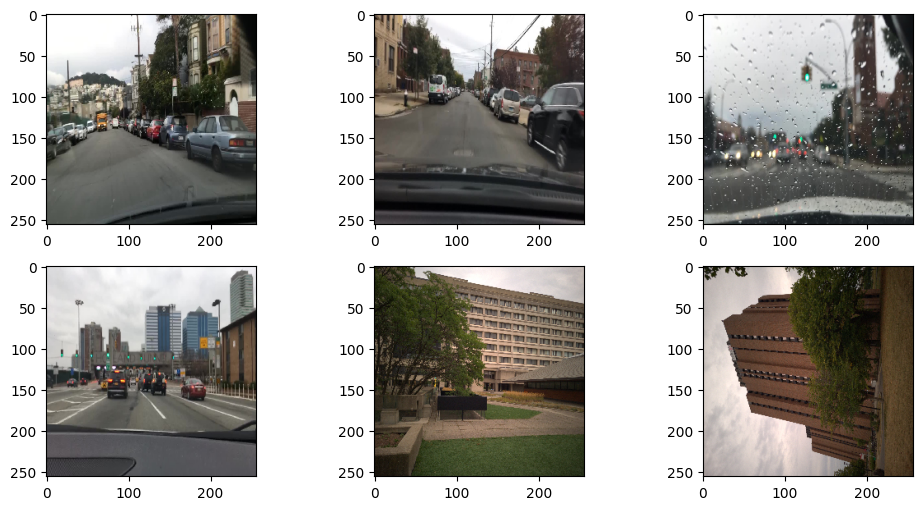

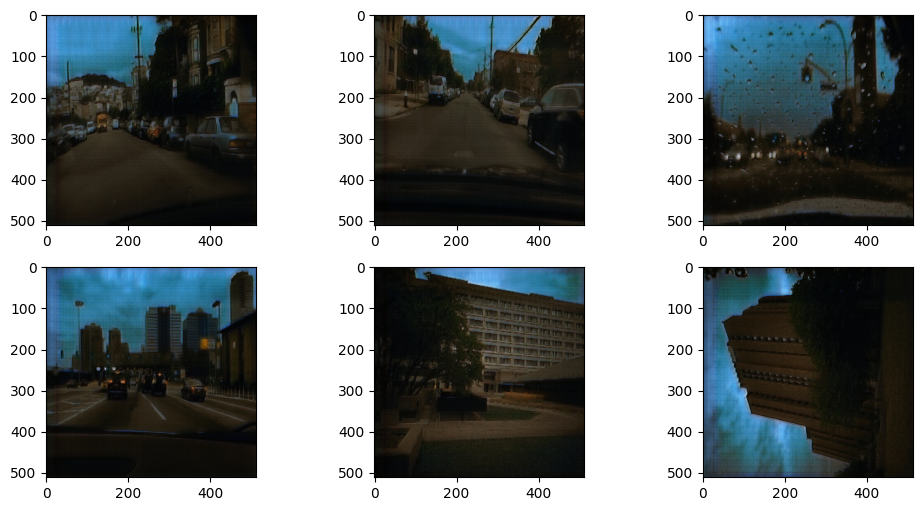

In [ ]:
plt.figure(figsize=(12, 6))
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.imshow((day[i] + 1)/2)

#plt.savefig('day_input.png')

plt.figure(figsize=(12, 6))
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.imshow((night_generated_uvcen_HRDisc[i] + 1)/2)

# plt.savefig('night_generated_uvcen_HRDisc.png')

# Load HR Disc 1024 (UVCGAN + Upsampling)

In [ ]:
#U-Net ViT Generator

def basic_block(layer,numfilter,alpha_lrelu,name = None):
  #l = GroupNormalization(groups = -1, axis=-1)(layer)
  l = InstanceNormalization(axis=-1)(layer)
  l = Conv2D(numfilter,(3,3), strides = 1, padding = 'same')(l)
  l = LeakyReLU(alpha = alpha_lrelu,name = name)(l)
  return l

def down_sampling(layer,numfilter):
  l = Conv2D(numfilter, (2,2), strides = 2, padding = 'same')(layer)
  return l

def up_sampling(layer, numfilter):
  l = Conv2DTranspose(numfilter, (3,3), strides = 2, padding = 'same')(layer)
  return l

def positional_embedding(seq_length,dim):
  sequence_length = seq_length
  dimension = dim

  position = tf.range(0,sequence_length,1)[:,np.newaxis]
  position = tf.cast(position,tf.float32)

  even_pos = tf.cast(tf.range(0,dimension,2),tf.float32)
  odd_pos = tf.cast(tf.range(1,dimension,2),tf.float32)
  even_denominator = tf.pow(1000.0,(even_pos/tf.cast(dimension,tf.float32)))
  odd_denominator = tf.pow(1000.0,((odd_pos-1)/tf.cast(dimension,tf.float32)))
  denominator = even_denominator # actually even_denominator == odd_denominator

  even_PE = tf.math.sin(position/denominator)
  odd_PE = tf.math.cos(position/denominator)

  stacked = tf.stack([even_PE,odd_PE],axis = -1)

  PE = tf.reshape(stacked,[sequence_length,dimension])

  return PE

# BASIC BLOCK SEBELUM DOWN ATAU SESUDAH UP SAMPLING MASIH BISA DITAMBAH SATU JIKA MENGIKUTI PAPER (SUDAH DITAMBAHKAN)

def unet_vit_generator(image_shape,num_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,name = None):
  in_image = Input(shape = image_shape)

  # ---- preprocess ----
  x = Conv2D(64, (2,2), padding ='same')(in_image)
  x = LeakyReLU(alpha = alpha_lrelu)(x)

  # ---- ENCODER PART ----
  #first block
  x = basic_block(x, num_features, alpha_lrelu)
  x_d1 = basic_block(x, num_features, alpha_lrelu)
  x = down_sampling(x_d1, num_features)

  #second block
  x = basic_block(x, num_features*2, alpha_lrelu)
  x_d2 = basic_block(x,num_features*2, alpha_lrelu)
  x = down_sampling(x_d2,num_features*2)

  #third block
  x = basic_block(x, num_features*4, alpha_lrelu)
  x_d3 = basic_block(x,num_features*4, alpha_lrelu)
  x = down_sampling(x_d3,num_features*4)

  #fourth block
  x = basic_block(x, num_features*8, alpha_lrelu)
  x_d4 = basic_block(x, num_features*8, alpha_lrelu)
  x = down_sampling(x_d4, num_features*8)
  flatten_shape = x.shape

  # ---- pixel-wise ViT ----
  x = Reshape((flatten_shape[1]*flatten_shape[2],flatten_shape[3]))(x)

  # Define Positional Encoding layer (256,512) by default
  PE = positional_embedding(flatten_shape[1]*flatten_shape[2],num_features*8) #Should be normalized later according to LeakyReLU range
  PE = LeakyReLU(alpha = alpha_lrelu)(PE)
  PE_layer = tf.expand_dims(PE, axis=0)

  class RepeatLayer(Layer):
      def __init__(self, axis=0, **kwargs):
          super(RepeatLayer, self).__init__(**kwargs)
          self.axis = axis

      def call(self, inputs, x):
          repeat_times = tf.shape(x)[0]  # Get the batch size dynamically from 'x'
          return tf.repeat(inputs, repeat_times, axis=self.axis)

      def get_config(self):
          config = super().get_config().copy()
          config.update({
              'axis': self.axis
          })
          return config

  # Custom repeat layer instead of tf.repeat
  PE_layer = RepeatLayer(axis=0)(PE_layer, x)

  # Concatenate positional encoding with input
  x = Concatenate(axis=2)([x, PE_layer])
  x = Dense(num_features * 8)(x)


  # Transformer Encoder Block
  for n in range(transformer_block):
    x_l = LayerNormalization(epsilon = 1e-6)(x)
    x = MultiHeadAttention(num_heads = n_attention_head, key_dim = num_features, dropout = 0.1)(x_l,x_l)
    # Rezero regularization Output = SkipConnection + α⋅MainPath
    x = tf.constant(alpha_reg) * x
    x = Add()([x_l,x])
    x_l2 = LayerNormalization(epsilon = 1e-6)(x)

    # FFN
    x = Dense(4*num_features*8, activation = 'gelu')(x_l2) # masih salah (seharusnya (512,2048))
    x = Dense(num_features*8)(x)                           # masih salah(seharusnya (2048,512))
    # Rezero regularization Output = SkipConnection + α⋅MainPath
    x = tf.constant(alpha_reg) * x
    x = Add()([x_l2,x])

  x = Dense(num_features*8)(x)
  x = Reshape((flatten_shape[1],flatten_shape[2],flatten_shape[3]))(x)

  # ---- DECODER PART ----
  #first block
  x = up_sampling(x,num_features*8)
  x = Concatenate()([x, x_d4])
  x = basic_block(x,num_features*8, alpha_lrelu)
  x = basic_block(x,num_features*8, alpha_lrelu)

  #second block
  x = up_sampling(x,num_features*4)
  x = Concatenate()([x, x_d3])
  x = basic_block(x,num_features*4, alpha_lrelu)
  x = basic_block(x,num_features*4, alpha_lrelu)

  #third block
  x = up_sampling(x,num_features*2)
  x = Concatenate()([x, x_d2])
  x = basic_block(x,num_features*2, alpha_lrelu)
  x = basic_block(x,num_features*2, alpha_lrelu)

  #fourth block
  x = up_sampling(x,num_features)
  x = Concatenate()([x, x_d1])
  x = basic_block(x,num_features, alpha_lrelu)
  x = basic_block(x,num_features, alpha_lrelu, name = name)

  # # ---- postprocess ----
  # x = Conv2D(3, (1,1), padding='same')(x)
  # x = GroupNormalization(groups = -1, axis=-1)(x)
  # out_image = Activation('tanh')(x)

  x = upscale_block(x,2)
  x = upscale_block(x,2)

  x = Conv2D(64,(3,3),padding = 'same')(x)
  x = InstanceNormalization(axis=-1)(x)
  #x = GroupNormalization(groups = -1, axis=-1)(x)
  x = LeakyReLU(alpha = alpha_lrelu)(x)

  x = Conv2D(32,(3,3),padding = 'same')(x)
  x = InstanceNormalization(axis=-1)(x)
  #x = GroupNormalization(groups = -1, axis=-1)(x)
  x = LeakyReLU(alpha = alpha_lrelu)(x)

  x = Conv2D(3,(1,1),padding = 'same')(x)
  x = InstanceNormalization(axis=-1)(x)
  #x = GroupNormalization(groups = -1, axis=-1)(x)
  out_image = Activation('tanh')(x)

  m = Model(in_image,out_image)
  return m

def upscale_block(x,factor):

  up_model = Conv2D(128, (3,3), padding="same")(x)
  up_model = UpSampling2D( size = factor )(up_model)
  up_model = PReLU(shared_axes=[1,2])(up_model)

  return up_model


In [ ]:
image_shape = dataset[0].shape[1:]
#hr_shape = dataset_512[0].shape[1:]
n_features = 128 #64
n_attention_head = 12 #10
transformer_block = 12 #12
alpha_reg = 0.00001
alpha_lrelu = 0.01

g_model_AtoB = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,name = 'temp1')
#g_model_BtoA = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,name = 'temp2')
# generator: B -> A
g_model_BtoA = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu)

#INI WORKS!!!

In [ ]:
folder_name = 'train1024_superRes_directUVCGAN_100epoch_HRDisc'
#folder_name = 'train_superRes_directUVCGAN_100epoch_BMAELoss'
main_path ='/content/gdrive/MyDrive/'+ folder_name +'/' + folder_name
epoch = 90
num_dataset = dataset[0].shape[0]

path_AtoB = main_path + '/g_model_AtoB_%06d.weights.h5' %(epoch*num_dataset)
g_model_AtoB.load_weights(path_AtoB)

In [ ]:
day = preprocesed_data_test

night_generated_1024_HRDisc = g_model_AtoB.predict(day)

1/1 [==============================] - 0s 110ms/step


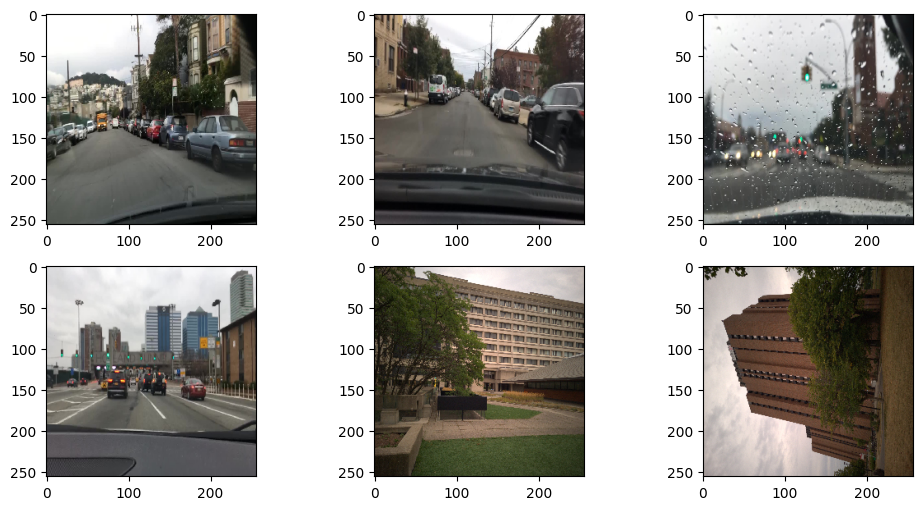

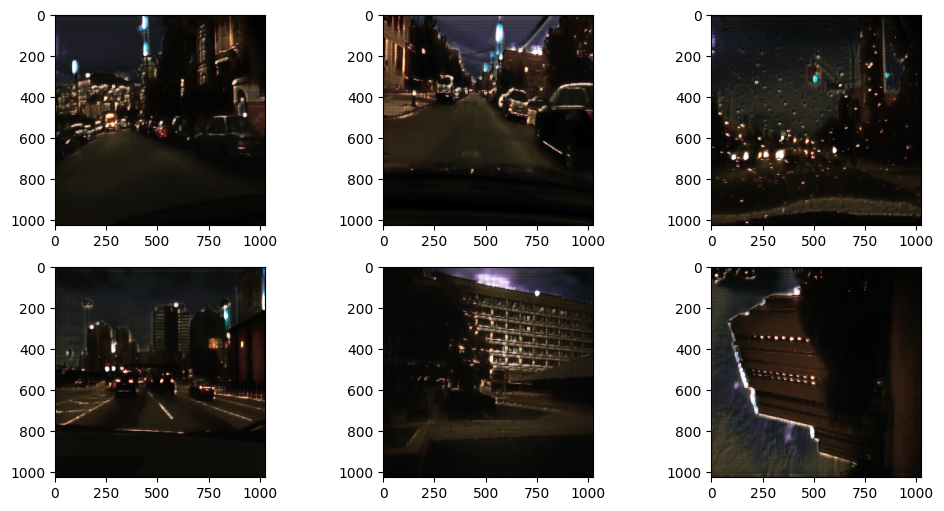

In [ ]:
plt.figure(figsize=(12, 6))
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.imshow((day[i] + 1)/2)

#plt.savefig('day_input.png')

plt.figure(figsize=(12, 6))
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.imshow((night_generated_1024_HRDisc[i] + 1)/2)

plt.savefig('night_generated_1024_HRDisc.png')

# FID TRAIN

In [ ]:
# scale an array of images to a new size
def scale_images(images, new_shape):
  images_list = list()
  for image in images:
    # resize with nearest neighbor interpolation
    new_image = resize(image, new_shape, 0)
    # store
    images_list.append(new_image)
  return asarray(images_list)

# calculate frechet inception distance
def calculate_fid(model, images1, images2):
 # calculate activations
 act1 = model.predict(images1)
 act2 = model.predict(images2)
 # calculate mean and covariance statistics
 mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
 mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
 # calculate sum squared difference between means
 ssdiff = numpy.sum((mu1 - mu2)**2.0)
 # calculate sqrt of product between cov
 covmean = sqrtm(sigma1.dot(sigma2))
 # check and correct imaginary numbers from sqrt
 if iscomplexobj(covmean):
  covmean = covmean.real
 # calculate score
 fid = ssdiff + trace(sigma1) + trace(sigma2) - 2.0 * trace(covmean)
 return fid,act1,act2,sigma1,sigma2,covmean,ssdiff


In [ ]:
# prepare the inception v3 model
model = InceptionV3(include_top=False, pooling='avg', input_shape=(299,299,3), weights = 'imagenet', classifier_activation = None)
model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_196 (InputLayer)      [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d_17117 (Conv2D)       (None, 149, 149, 32)         864       ['input_196[0][0]']           
                                                                                                  
 batch_normalization_1316 (  (None, 149, 149, 32)         96        ['conv2d_17117[0][0]']        
 BatchNormalization)                                                                              
                                                                                                  
 activation_2156 (Activatio  (None, 149, 149, 32)         0         ['batch_normalizati

In [ ]:
day_dataset_512 = dataset_512[1]

In [ ]:
# Input Image
day_dataset_512 = (day_dataset_512 +1)/2.0
day_unnorm = day_dataset_512 * 255.0
day_unnorm_scaled = scale_images(day_unnorm, (299,299,3))
day_inception = preprocess_input(day_unnorm_scaled)

# Preprocess

# UVCGAN + Upsampling
night_generated_norm_HRDisc = (night_generated_HRDisc + 1)/2.0
night_generated_unnorm_HRDisc = night_generated_norm_HRDisc * 255.0
night_generated_unnorm_scaled_HRDisc = scale_images(night_generated_unnorm_HRDisc, (299,299,3))
night_generated_inception_HRDisc = preprocess_input(night_generated_unnorm_scaled_HRDisc)

# UVCGAN + ESRGAN+
night_generated_norm_uvcesr_HRDisc = (night_generated_uvcesr_HRDisc + 1)/2.0
night_generated_unnorm_uvcesr_HRDisc = night_generated_norm_uvcesr_HRDisc * 255.0
night_generated_unnorm_scaled_uvcesr_HRDisc = scale_images(night_generated_unnorm_uvcesr_HRDisc, (299,299,3))
night_generated_inception_uvcesr_HRDisc = preprocess_input(night_generated_unnorm_scaled_uvcesr_HRDisc)

# UVCGAN + EnlightenGAN
night_generated_norm_uvcen_HRDisc = (night_generated_uvcen_HRDisc + 1)/2.0
night_generated_unnorm_uvcen_HRDisc = night_generated_norm_uvcen_HRDisc * 255.0
night_generated_unnorm_scaled_uvcen_HRDisc = scale_images(night_generated_unnorm_uvcen_HRDisc, (299,299,3))
night_generated_inception_uvcen_HRDisc = preprocess_input(night_generated_unnorm_scaled_uvcen_HRDisc)

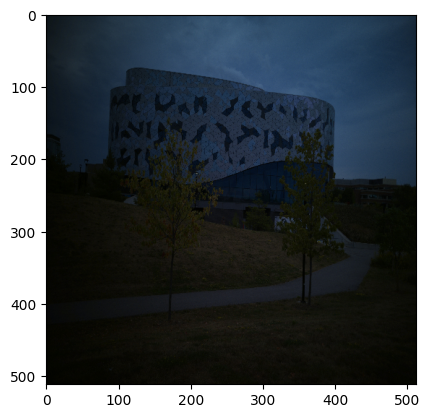

In [ ]:
plt.imshow(day_dataset_512[0])

In [ ]:
day_dataset_512.shape,night_generated_HRDisc.shape

((169, 512, 512, 3), (169, 512, 512, 3))

In [ ]:
# fid between images1 and images1
fid_s,act1_s,act2_s,sigma1_s,sigma2_s,covmean_s,ssdiff_s = calculate_fid(model, day_inception, day_inception)
print('FID (same): %.3f' % ssdiff_s)

# UVCGAN
fid_d_uvcgan,act1_d,act2_d,sigma1_d,sigma2_d,covmean_d,ssdiff_d_HRDisc = calculate_fid(model, day_inception, night_generated_inception_HRDisc)
print('FID (same) - UVCGAN + Upsampling: %.3f' % ssdiff_d_HRDisc)

# FPNCGAN
fid_d_fpncgan,act1_d,act2_d,sigma1_d,sigma2_d,covmean_d,ssdiff_d_uvcesr_HRDisc = calculate_fid(model, day_inception, night_generated_inception_uvcesr_HRDisc)
print('FID (same) - UVCGAN + ESRGAN+: %.3f' % ssdiff_d_uvcesr_HRDisc)

# VCGAN
fid_d_vcgan,act1_d,act2_d,sigma1_d,sigma2_d,covmean_d,ssdiff_d_uvcen_HRDisc = calculate_fid(model, day_inception, night_generated_inception_uvcen_HRDisc)
print('FID (same) - UVCGAN + ElightenGAN: %.3f' % ssdiff_d_uvcen_HRDisc)


6/6 [==============================] - 0s 24ms/step
FID (same): 0.000
6/6 [==============================] - 0s 24ms/step
FID (same) - UVCGAN + Upsampling: 30.431
6/6 [==============================] - 0s 24ms/step
FID (same) - UVCGAN + ESRGAN+: 39.504
6/6 [==============================] - 0s 24ms/step
FID (same) - UVCGAN + ElightenGAN: 46.838



1.   epoch 90 rendah untuk uvcgan upsampling, tinggi untuk uvcgan esrgan, sangat rendah untuk uvcgan + enlighten
2.   epoch 91 tinggi huntuk uvcgan upsampling, sangat tinggi untuk uvcgan esrgan, rendah untuk uvcgan + enlighten
3.   epoch 92 tinggi huntuk uvcgan upsampling, sangat tinggi untuk uvcgan esrgan, sangat rendah untuk uvcgan + enlighten (namun lebih tinggi dari epoch 89 uvcgan + esrgan+) --> epoch 92 bisa untuk angka evaluasi
4.   epoch 93 bisa dibilang merata dengan urutan uvcgan+enlighten< uvcgan+upsampling < uvcgan+esrgan+ (angka uvcgan+esrgan+ bisa digunakan untuk evaluasi)
5.   epoch 94 sangat tinggi untuk uvcgan+upsampling dan enlighten, namun sangat rendah untuk esrgan+
6. epoch 95 sangat tinggi untuk uvcgan+upsampling dan esrgan+, namun sangat rendah untuk esrgan+
7. epoch 96 rendah untuk uvcgan+upsampling,sangat tinggi untuk uvcgan+esrgan+, sangat rendah untuk uvcgan+enlighten
8. epoch 97 sangat tinggi untuk ketiganya.
9. epoch 98 rendah untuk uvcgan + upsampling, sangat tinggi untuk esrgan+ , dan sangat rendah untuk uvcgan + enlighten
10. epoch 99 sangat tinggi untuk uvcgan+upsampling
11. epoch 100


**Kesimpulan** : Ambil epoch 90 untuk upsampling, dan epoch 93 untuk esrgan+, dan 94 untuk enlightengan

* FID (same): 0.000

* FID (same) - UVCGAN + Upsampling: **30.431**

* FID (same) - UVCGAN + ESRGAN+: 39.504

* FID (same) - UVCGAN + ElightenGAN: 46.838





# SSIM TRAIN

In [ ]:
# Input Image
day_dataset_512 = dataset_512[1]
day_dataset_512 = (day_dataset_512 +1)/2.0

# UVCGAN + Upsampling
night_generated_norm_HRDisc = (night_generated_HRDisc + 1)/2.0

# UVCGAN + ESRGAN+
night_generated_norm_uvcesr_HRDisc = (night_generated_uvcesr_HRDisc + 1)/2.0

# UVCGAN + EnlightenGAN
night_generated_norm_uvcen_HRDisc = (night_generated_uvcen_HRDisc + 1)/2.0

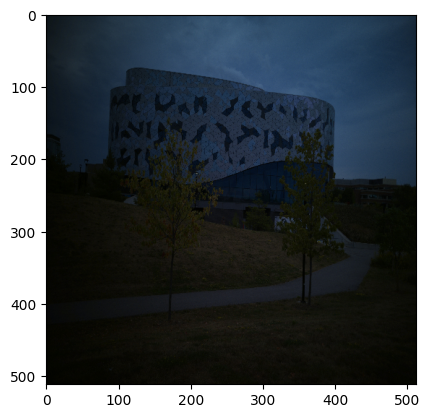

In [ ]:
plt.imshow(day_dataset_512[0])

In [ ]:
ssim_uvcgan_up = []
for day_real,night_gen in zip(day_dataset_512,night_generated_norm_HRDisc):
  im1 = color.rgb2gray(day_real)
  im2 = color.rgb2gray(night_gen)
  ssim_value = ssim(im1, im2, data_range = 1.0)
  ssim_uvcgan_up.append(ssim_value)

ssim_uvcgan_esrgan = []
for day_real,night_gen in zip(day_dataset_512,night_generated_norm_uvcesr_HRDisc):
  im1 = color.rgb2gray(day_real)
  im2 = color.rgb2gray(night_gen)
  ssim_value = ssim(im1, im2, data_range = 1.0)
  ssim_uvcgan_esrgan.append(ssim_value)

ssim_uvcgan_enlighten = []
for day_real,night_gen in zip(day_dataset_512,night_generated_norm_uvcen_HRDisc):
  im1 = color.rgb2gray(day_real)
  im2 = color.rgb2gray(night_gen)
  ssim_value = ssim(im1, im2, data_range = 1.0)
  ssim_uvcgan_enlighten.append(ssim_value)


print(f'Average SSIM UVCGAN + Upsamling for {len(day)} images', sum(ssim_uvcgan_up)/len(ssim_uvcgan_up))
print(f'Average SSIM UVCGAN + ESRGAN+ {len(day)} images', sum(ssim_uvcgan_esrgan)/len(ssim_uvcgan_esrgan))
print(f'Average SSIM UVCGAN + EnlightenGAN {len(day)} images', sum(ssim_uvcgan_enlighten)/len(ssim_uvcgan_enlighten))

Average SSIM UVCGAN + Upsamling for 169 images 0.4848812437210121
Average SSIM UVCGAN + ESRGAN+ 169 images 0.402428108122292
Average SSIM UVCGAN + EnlightenGAN 169 images 0.3733579846746877




1.   Epoch 100

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.2873032774330084
Average SSIM UVCGAN + ESRGAN+ 169 images 0.2905903798849646
Average SSIM UVCGAN + EnlightenGAN 169 images 0.3730976520034721

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.1881407442126382
Average SSIM UVCGAN + ESRGAN+ 169 images 0.2420793931151383
Average SSIM UVCGAN + EnlightenGAN 169 images 0.2723765204151342

2.   Epoch 99

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.27620456264644716
Average SSIM UVCGAN + ESRGAN+ 169 images 0.3198537211324593
Average SSIM UVCGAN + EnlightenGAN 169 images 0.3988135524242421

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.41682968431755646
Average SSIM UVCGAN + ESRGAN+ 169 images 0.4019343250625289
Average SSIM UVCGAN + EnlightenGAN 169 images 0.3756274949424228

3.   Epoch 98

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.5012637554476634
Average SSIM UVCGAN + ESRGAN+ 169 images 0.24470937255067465
Average SSIM UVCGAN + EnlightenGAN 169 images 0.322349665682589

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.23164484196213908
Average SSIM UVCGAN + ESRGAN+ 169 images 0.37608133214759765
Average SSIM UVCGAN + EnlightenGAN 169 images 0.4582857695792883

4. Epoch 97

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.30542227366160424
Average SSIM UVCGAN + ESRGAN+ 169 images 0.417614030342019
Average SSIM UVCGAN + EnlightenGAN 169 images 0.396623211112

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.3164745558189685
Average SSIM UVCGAN + ESRGAN+ 169 images 0.35093535973411516
Average SSIM UVCGAN + EnlightenGAN 169 images 0.24843765217059394

5. Epoch 96

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.3164745558189685
Average SSIM UVCGAN + ESRGAN+ 169 images 0.35093535973411516
Average SSIM UVCGAN + EnlightenGAN 169 images 0.24843765217059394

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.3912787913444583
Average SSIM UVCGAN + ESRGAN+ 169 images 0.4370540164372794
Average SSIM UVCGAN + EnlightenGAN 169 images 0.43645957978914524

6. Epoch 95

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.27879455659344704
Average SSIM UVCGAN + ESRGAN+ 169 images 0.17827567319686435
Average SSIM UVCGAN + EnlightenGAN 169 images 0.16916856592217444

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.4157502755324596
Average SSIM UVCGAN + ESRGAN+ 169 images 0.43101181719133047
Average SSIM UVCGAN + EnlightenGAN 169 images 0.45570680791699086

7. Epoch 94

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.26042569177080743
Average SSIM UVCGAN + ESRGAN+ 169 images 0.36531458153272145
Average SSIM UVCGAN + EnlightenGAN 169 images 0.39665000894502983

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.421718787951098
Average SSIM UVCGAN + ESRGAN+ 169 images 0.36969834423023185
Average SSIM UVCGAN + EnlightenGAN 169 images 0.3061732961457533

8. Epoch 93

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.29013741087545336
Average SSIM UVCGAN + ESRGAN+ 169 images 0.1758622838697269
Average SSIM UVCGAN + EnlightenGAN 169 images 0.41981775488211237

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.47134486968228895
Average SSIM UVCGAN + ESRGAN+ 169 images 0.41884937530233474
Average SSIM UVCGAN + EnlightenGAN 169 images 0.38183836807939014

9. Epoch 92

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.2614311400429511
Average SSIM UVCGAN + ESRGAN+ 169 images 0.3779290874545187
Average SSIM UVCGAN + EnlightenGAN 169 images 0.4131875282465549

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.4848812437210121
Average SSIM UVCGAN + ESRGAN+ 169 images 0.4024280657030066
Average SSIM UVCGAN + EnlightenGAN 169 images 0.3733579846746877

10. Epoch 91

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.27268911753839126
Average SSIM UVCGAN + ESRGAN+ 169 images 0.25605603117759607
Average SSIM UVCGAN + EnlightenGAN 169 images 0.29189244144524884

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.26531405092151383
Average SSIM UVCGAN + ESRGAN+ 169 images 0.41557019290925906
Average SSIM UVCGAN + EnlightenGAN 169 images 0.4361623285073656

11. Epoch 90

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.39467061791364844
Average SSIM UVCGAN + ESRGAN+ 169 images 0.20112645569150484
Average SSIM UVCGAN + EnlightenGAN 169 images 0.3562335105370927

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.2920910195917589
Average SSIM UVCGAN + ESRGAN+ 169 images 0.4688627512083211
Average SSIM UVCGAN + EnlightenGAN 169 images 0.4125159148280078

12. Epoch 89

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.27954441177116973
Average SSIM UVCGAN + ESRGAN+ 169 images 0.21596081553204094
Average SSIM UVCGAN + EnlightenGAN 169 images 0.18148522963548339

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.42873466512656083
Average SSIM UVCGAN + ESRGAN+ 169 images 0.44645858152097995
Average SSIM UVCGAN + EnlightenGAN 169 images 0.4494947253904206

**Kesimpulan:**

**Ambil epoch 92 untuk uji citra malam HR dan SR**

*   Average SSIM UVCGAN + Upsamling for 169 images **0.4848812437210121**
*   Average SSIM UVCGAN + ESRGAN+ 169 images 0.4024280657030066
*   Average SSIM UVCGAN + EnlightenGAN 169 images 0.37335798467468777



# FID TEST

In [ ]:
# scale an array of images to a new size
def scale_images(images, new_shape):
  images_list = list()
  for image in images:
    # resize with nearest neighbor interpolation
    new_image = resize(image, new_shape, 0)
    # store
    images_list.append(new_image)
  return asarray(images_list)

# calculate frechet inception distance
def calculate_fid(model, images1, images2):
 # calculate activations
 act1 = model.predict(images1)
 act2 = model.predict(images2)
 # calculate mean and covariance statistics
 mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
 mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
 # calculate sum squared difference between means
 ssdiff = numpy.sum((mu1 - mu2)**2.0)
 # calculate sqrt of product between cov
 covmean = sqrtm(sigma1.dot(sigma2))
 # check and correct imaginary numbers from sqrt
 if iscomplexobj(covmean):
  covmean = covmean.real
 # calculate score
 fid = ssdiff + trace(sigma1) + trace(sigma2) - 2.0 * trace(covmean)
 return fid,act1,act2,sigma1,sigma2,covmean,ssdiff


In [ ]:
# prepare the inception v3 model
model = InceptionV3(include_top=False, pooling='avg', input_shape=(299,299,3), weights = 'imagenet', classifier_activation = None)
model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_28 (InputLayer)       [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d_2386 (Conv2D)        (None, 149, 149, 32)         864       ['input_28[0][0]']            
                                                                                                  
 batch_normalization_282 (B  (None, 149, 149, 32)         96        ['conv2d_2386[0][0]']         
 atchNormalization)                                                                               
                                                                                                  
 activation_394 (Activation  (None, 149, 149, 32)         0         ['batch_normalizati

In [ ]:
# Input Image
day_dataset_512 = (data_night_random +1)/2.0
day_unnorm = day_dataset_512 * 255.0
day_unnorm_scaled = scale_images(day_unnorm, (299,299,3))
day_inception = preprocess_input(day_unnorm_scaled)

# Preprocess

# UVCGAN + Upsampling
night_generated_norm_HRDisc = (night_generated_HRDisc_test + 1)/2.0
night_generated_unnorm_HRDisc = night_generated_norm_HRDisc * 255.0
night_generated_unnorm_scaled_HRDisc = scale_images(night_generated_unnorm_HRDisc, (299,299,3))
night_generated_inception_HRDisc = preprocess_input(night_generated_unnorm_scaled_HRDisc)

# UVCGAN + ESRGAN+
night_generated_norm_uvcesr_HRDisc = (night_generated_uvcesr_HRDisc_test + 1)/2.0
night_generated_unnorm_uvcesr_HRDisc = night_generated_norm_uvcesr_HRDisc * 255.0
night_generated_unnorm_scaled_uvcesr_HRDisc = scale_images(night_generated_unnorm_uvcesr_HRDisc, (299,299,3))
night_generated_inception_uvcesr_HRDisc = preprocess_input(night_generated_unnorm_scaled_uvcesr_HRDisc)

# UVCGAN + EnlightenGAN
night_generated_norm_uvcen_HRDisc = (night_generated_uvcen_HRDisc_test + 1)/2.0
night_generated_unnorm_uvcen_HRDisc = night_generated_norm_uvcen_HRDisc * 255.0
night_generated_unnorm_scaled_uvcen_HRDisc = scale_images(night_generated_unnorm_uvcen_HRDisc, (299,299,3))
night_generated_inception_uvcen_HRDisc = preprocess_input(night_generated_unnorm_scaled_uvcen_HRDisc)

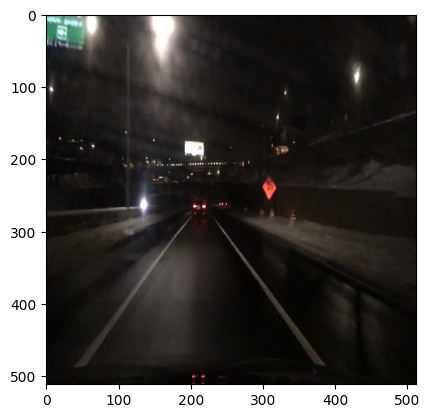

In [ ]:
plt.imshow(day_dataset_512[8])

In [ ]:
day_dataset_512.shape,night_generated_HRDisc_test.shape

((50, 512, 512, 3), (50, 512, 512, 3))

In [ ]:
# fid between images1 and images1
fid_s,act1_s,act2_s,sigma1_s,sigma2_s,covmean_s,ssdiff_s = calculate_fid(model, day_inception, day_inception)
print('FID (same): %.3f' % ssdiff_s)

# UVCGAN
fid_d_uvcgan,act1_d,act2_d,sigma1_d,sigma2_d,covmean_d,ssdiff_d_HRDisc = calculate_fid(model, day_inception, night_generated_inception_HRDisc)
print('FID (same) - UVCGAN + Upsampling: %.3f' % ssdiff_d_HRDisc)

# FPNCGAN
fid_d_fpncgan,act1_d,act2_d,sigma1_d,sigma2_d,covmean_d,ssdiff_d_uvcesr_HRDisc = calculate_fid(model, day_inception, night_generated_inception_uvcesr_HRDisc)
print('FID (same) - UVCGAN + ESRGAN+: %.3f' % ssdiff_d_uvcesr_HRDisc)

# VCGAN
fid_d_vcgan,act1_d,act2_d,sigma1_d,sigma2_d,covmean_d,ssdiff_d_uvcen_HRDisc = calculate_fid(model, day_inception, night_generated_inception_uvcen_HRDisc)
print('FID (same) - UVCGAN + ElightenGAN: %.3f' % ssdiff_d_uvcen_HRDisc)


2/2 [==============================] - 0s 25ms/step
FID (same): 0.000
2/2 [==============================] - 0s 25ms/step
FID (same) - UVCGAN + Upsampling: 58.154
2/2 [==============================] - 0s 25ms/step
FID (same) - UVCGAN + ESRGAN+: 52.749
2/2 [==============================] - 0s 25ms/step
FID (same) - UVCGAN + ElightenGAN: 63.790



1.   epoch 90 rendah untuk uvcgan upsampling, tinggi untuk uvcgan esrgan, sangat rendah untuk uvcgan + enlighten
2.   epoch 91 tinggi huntuk uvcgan upsampling, sangat tinggi untuk uvcgan esrgan, rendah untuk uvcgan + enlighten
3.   epoch 92 tinggi huntuk uvcgan upsampling, sangat tinggi untuk uvcgan esrgan, sangat rendah untuk uvcgan + enlighten (namun lebih tinggi dari epoch 89 uvcgan + esrgan+) --> epoch 92 bisa untuk angka evaluasi
4.   epoch 93 bisa dibilang merata dengan urutan uvcgan+enlighten< uvcgan+upsampling < uvcgan+esrgan+ (angka uvcgan+esrgan+ bisa digunakan untuk evaluasi)
5.   epoch 94 sangat tinggi untuk uvcgan+upsampling dan enlighten, namun sangat rendah untuk esrgan+
6. epoch 95 sangat tinggi untuk uvcgan+upsampling dan esrgan+, namun sangat rendah untuk esrgan+
7. epoch 96 rendah untuk uvcgan+upsampling,sangat tinggi untuk uvcgan+esrgan+, sangat rendah untuk uvcgan+enlighten
8. epoch 97 sangat tinggi untuk ketiganya.
9. epoch 98 rendah untuk uvcgan + upsampling, sangat tinggi untuk esrgan+ , dan sangat rendah untuk uvcgan + enlighten
10. epoch 99
11. epoch 100 bagus untuk test uvcgan upsampling


**Kesimpulan** : Ambil epoch 90 untuk upsampling, dan epoch 93 untuk esrgan+, dan 94 untuk enlightengan

* FID (same): 0.000

* FID (same) - UVCGAN + Upsampling: **30.431**

* FID (same) - UVCGAN + ESRGAN+: 39.504

* FID (same) - UVCGAN + ElightenGAN: 46.838





# SSIM TEST

In [ ]:
# Input Image
day_dataset_512 = (data_night_random + 1)/2.0

# UVCGAN + Upsampling
night_generated_norm_HRDisc = (night_generated_HRDisc_test + 1)/2.0

# UVCGAN + ESRGAN+
night_generated_norm_uvcesr_HRDisc = (night_generated_uvcesr_HRDisc_test + 1)/2.0

# UVCGAN + EnlightenGAN
night_generated_norm_uvcen_HRDisc = (night_generated_uvcen_HRDisc_test + 1)/2.0

In [ ]:
plt.imshow(day_dataset_512[0])

In [ ]:
day_dataset_512.shape, night_generated_norm_HRDisc.shape

In [ ]:
ssim_uvcgan_up = []
for day_real,night_gen in zip(day_dataset_512,night_generated_norm_HRDisc):
  im1 = color.rgb2gray(day_real)
  im2 = color.rgb2gray(night_gen)
  ssim_value = ssim(im1, im2, data_range = 1.0)
  ssim_uvcgan_up.append(ssim_value)

ssim_uvcgan_esrgan = []
for day_real,night_gen in zip(day_dataset_512,night_generated_norm_uvcesr_HRDisc):
  im1 = color.rgb2gray(day_real)
  im2 = color.rgb2gray(night_gen)
  ssim_value = ssim(im1, im2, data_range = 1.0)
  ssim_uvcgan_esrgan.append(ssim_value)

ssim_uvcgan_enlighten = []
for day_real,night_gen in zip(day_dataset_512,night_generated_norm_uvcen_HRDisc):
  im1 = color.rgb2gray(day_real)
  im2 = color.rgb2gray(night_gen)
  ssim_value = ssim(im1, im2, data_range = 1.0)
  ssim_uvcgan_enlighten.append(ssim_value)


print(f'Average SSIM UVCGAN + Upsamling for {len(day)} images', sum(ssim_uvcgan_up)/len(ssim_uvcgan_up))
print(f'Average SSIM UVCGAN + ESRGAN+ {len(day)} images', sum(ssim_uvcgan_esrgan)/len(ssim_uvcgan_esrgan))
print(f'Average SSIM UVCGAN + EnlightenGAN {len(day)} images', sum(ssim_uvcgan_enlighten)/len(ssim_uvcgan_enlighten))

1. Epoch 100 bagus untuk test esrgan+ dan enlightengan



1.   Epoch 100

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.2873032774330084
Average SSIM UVCGAN + ESRGAN+ 169 images 0.2905903798849646
Average SSIM UVCGAN + EnlightenGAN 169 images 0.3730976520034721

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.1881407442126382
Average SSIM UVCGAN + ESRGAN+ 169 images 0.2420793931151383
Average SSIM UVCGAN + EnlightenGAN 169 images 0.2723765204151342

2.   Epoch 99

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.27620456264644716
Average SSIM UVCGAN + ESRGAN+ 169 images 0.3198537211324593
Average SSIM UVCGAN + EnlightenGAN 169 images 0.3988135524242421

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.41682968431755646
Average SSIM UVCGAN + ESRGAN+ 169 images 0.4019343250625289
Average SSIM UVCGAN + EnlightenGAN 169 images 0.3756274949424228

3.   Epoch 98

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.5012637554476634
Average SSIM UVCGAN + ESRGAN+ 169 images 0.24470937255067465
Average SSIM UVCGAN + EnlightenGAN 169 images 0.322349665682589

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.23164484196213908
Average SSIM UVCGAN + ESRGAN+ 169 images 0.37608133214759765
Average SSIM UVCGAN + EnlightenGAN 169 images 0.4582857695792883

4. Epoch 97

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.30542227366160424
Average SSIM UVCGAN + ESRGAN+ 169 images 0.417614030342019
Average SSIM UVCGAN + EnlightenGAN 169 images 0.396623211112

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.3164745558189685
Average SSIM UVCGAN + ESRGAN+ 169 images 0.35093535973411516
Average SSIM UVCGAN + EnlightenGAN 169 images 0.24843765217059394

5. Epoch 96

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.3164745558189685
Average SSIM UVCGAN + ESRGAN+ 169 images 0.35093535973411516
Average SSIM UVCGAN + EnlightenGAN 169 images 0.24843765217059394

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.3912787913444583
Average SSIM UVCGAN + ESRGAN+ 169 images 0.4370540164372794
Average SSIM UVCGAN + EnlightenGAN 169 images 0.43645957978914524

6. Epoch 95

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.27879455659344704
Average SSIM UVCGAN + ESRGAN+ 169 images 0.17827567319686435
Average SSIM UVCGAN + EnlightenGAN 169 images 0.16916856592217444

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.4157502755324596
Average SSIM UVCGAN + ESRGAN+ 169 images 0.43101181719133047
Average SSIM UVCGAN + EnlightenGAN 169 images 0.45570680791699086

7. Epoch 94

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.26042569177080743
Average SSIM UVCGAN + ESRGAN+ 169 images 0.36531458153272145
Average SSIM UVCGAN + EnlightenGAN 169 images 0.39665000894502983

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.421718787951098
Average SSIM UVCGAN + ESRGAN+ 169 images 0.36969834423023185
Average SSIM UVCGAN + EnlightenGAN 169 images 0.3061732961457533

8. Epoch 93

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.29013741087545336
Average SSIM UVCGAN + ESRGAN+ 169 images 0.1758622838697269
Average SSIM UVCGAN + EnlightenGAN 169 images 0.41981775488211237

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.47134486968228895
Average SSIM UVCGAN + ESRGAN+ 169 images 0.41884937530233474
Average SSIM UVCGAN + EnlightenGAN 169 images 0.38183836807939014

9. Epoch 92

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.2614311400429511
Average SSIM UVCGAN + ESRGAN+ 169 images 0.3779290874545187
Average SSIM UVCGAN + EnlightenGAN 169 images 0.4131875282465549

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.4848812437210121
Average SSIM UVCGAN + ESRGAN+ 169 images 0.4024280657030066
Average SSIM UVCGAN + EnlightenGAN 169 images 0.3733579846746877

10. Epoch 91

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.27268911753839126
Average SSIM UVCGAN + ESRGAN+ 169 images 0.25605603117759607
Average SSIM UVCGAN + EnlightenGAN 169 images 0.29189244144524884

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.26531405092151383
Average SSIM UVCGAN + ESRGAN+ 169 images 0.41557019290925906
Average SSIM UVCGAN + EnlightenGAN 169 images 0.4361623285073656

11. Epoch 90

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.39467061791364844
Average SSIM UVCGAN + ESRGAN+ 169 images 0.20112645569150484
Average SSIM UVCGAN + EnlightenGAN 169 images 0.3562335105370927

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.2920910195917589
Average SSIM UVCGAN + ESRGAN+ 169 images 0.4688627512083211
Average SSIM UVCGAN + EnlightenGAN 169 images 0.4125159148280078

12. Epoch 89

day and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.27954441177116973
Average SSIM UVCGAN + ESRGAN+ 169 images 0.21596081553204094
Average SSIM UVCGAN + EnlightenGAN 169 images 0.18148522963548339

hr and sr night

Average SSIM UVCGAN + Upsamling for 169 images 0.42873466512656083
Average SSIM UVCGAN + ESRGAN+ 169 images 0.44645858152097995
Average SSIM UVCGAN + EnlightenGAN 169 images 0.4494947253904206

**Kesimpulan:**

**Ambil epoch 92 untuk uji citra malam HR dan SR**

*   Average SSIM UVCGAN + Upsamling for 169 images **0.4848812437210121**
*   Average SSIM UVCGAN + ESRGAN+ 169 images 0.4024280657030066
*   Average SSIM UVCGAN + EnlightenGAN 169 images 0.37335798467468777



# ALL EPOCH TEST DATA

In [ ]:
# scale an array of images to a new size
def scale_images(images, new_shape):
  images_list = list()
  for image in images:
    # resize with nearest neighbor interpolation
    new_image = resize(image, new_shape, 0)
    # store
    images_list.append(new_image)
  return asarray(images_list)

# calculate frechet inception distance
def calculate_fid(model, images1, images2):
 # calculate activations
 act1 = model.predict(images1)
 act2 = model.predict(images2)
 # calculate mean and covariance statistics
 mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
 mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
 # calculate sum squared difference between means
 ssdiff = numpy.sum((mu1 - mu2)**2.0)
 # calculate sqrt of product between cov
 covmean = sqrtm(sigma1.dot(sigma2))
 # check and correct imaginary numbers from sqrt
 if iscomplexobj(covmean):
  covmean = covmean.real
 # calculate score
 fid = ssdiff + trace(sigma1) + trace(sigma2) - 2.0 * trace(covmean)
 return fid,act1,act2,sigma1,sigma2,covmean,ssdiff

# prepare the inception v3 model
model = InceptionV3(include_top=False, pooling='avg', input_shape=(299,299,3), weights = 'imagenet', classifier_activation = None)
model.summary()

def calculate_fid_func(data_night,night_HRDisc,night_uvcesr,night_uvcen):
  # Input Image
  day_dataset_512 = (data_night +1)/2.0
  day_unnorm = day_dataset_512 * 255.0
  day_unnorm_scaled = scale_images(day_unnorm, (299,299,3))
  day_inception = preprocess_input(day_unnorm_scaled)

  # Preprocess

  # UVCGAN + Upsampling
  night_generated_norm_HRDisc = (night_HRDisc + 1)/2.0
  night_generated_unnorm_HRDisc = night_generated_norm_HRDisc * 255.0
  night_generated_unnorm_scaled_HRDisc = scale_images(night_generated_unnorm_HRDisc, (299,299,3))
  night_generated_inception_HRDisc = preprocess_input(night_generated_unnorm_scaled_HRDisc)

  # UVCGAN + ESRGAN+
  night_generated_norm_uvcesr_HRDisc = (night_uvcesr + 1)/2.0
  night_generated_unnorm_uvcesr_HRDisc = night_generated_norm_uvcesr_HRDisc * 255.0
  night_generated_unnorm_scaled_uvcesr_HRDisc = scale_images(night_generated_unnorm_uvcesr_HRDisc, (299,299,3))
  night_generated_inception_uvcesr_HRDisc = preprocess_input(night_generated_unnorm_scaled_uvcesr_HRDisc)

  # UVCGAN + EnlightenGAN
  night_generated_norm_uvcen_HRDisc = (night_uvcen + 1)/2.0
  night_generated_unnorm_uvcen_HRDisc = night_generated_norm_uvcen_HRDisc * 255.0
  night_generated_unnorm_scaled_uvcen_HRDisc = scale_images(night_generated_unnorm_uvcen_HRDisc, (299,299,3))
  night_generated_inception_uvcen_HRDisc = preprocess_input(night_generated_unnorm_scaled_uvcen_HRDisc)

  # fid between images1 and images1
  fid_s,act1_s,act2_s,sigma1_s,sigma2_s,covmean_s,ssdiff_s = calculate_fid(model, day_inception, day_inception)
  print('FID (same): %.3f' % ssdiff_s)

  # UVCGAN
  fid_d_uvcgan,act1_d,act2_d,sigma1_d,sigma2_d,covmean_d,ssdiff_d_HRDisc = calculate_fid(model, day_inception, night_generated_inception_HRDisc)
  #print('FID (same) - UVCGAN + Upsampling: %.3f' % ssdiff_d_HRDisc)

  # FPNCGAN
  fid_d_fpncgan,act1_d,act2_d,sigma1_d,sigma2_d,covmean_d,ssdiff_d_uvcesr_HRDisc = calculate_fid(model, day_inception, night_generated_inception_uvcesr_HRDisc)
  #print('FID (same) - UVCGAN + ESRGAN+: %.3f' % ssdiff_d_uvcesr_HRDisc)

  # VCGAN
  fid_d_vcgan,act1_d,act2_d,sigma1_d,sigma2_d,covmean_d,ssdiff_d_uvcen_HRDisc = calculate_fid(model, day_inception, night_generated_inception_uvcen_HRDisc)
  #print('FID (same) - UVCGAN + ElightenGAN: %.3f' % ssdiff_d_uvcen_HRDisc)

  return ssdiff_d_HRDisc,ssdiff_d_uvcesr_HRDisc,ssdiff_d_uvcen_HRDisc

def calculate_ssim_func(data_night,night_HRDisc,night_uvcesr,night_uvcen):
  # Input Image
  day_dataset_512 = (data_night + 1)/2.0

  # UVCGAN + Upsampling
  night_generated_norm_HRDisc = (night_HRDisc + 1)/2.0

  # UVCGAN + ESRGAN+
  night_generated_norm_uvcesr_HRDisc = (night_uvcesr + 1)/2.0

  # UVCGAN + EnlightenGAN
  night_generated_norm_uvcen_HRDisc = (night_uvcen + 1)/2.0

  ssim_uvcgan_up = []
  for day_real,night_gen in zip(day_dataset_512,night_generated_norm_HRDisc):
    im1 = color.rgb2gray(day_real)
    im2 = color.rgb2gray(night_gen)
    ssim_value = ssim(im1, im2, data_range = 1.0)
    ssim_uvcgan_up.append(ssim_value)

  ssim_uvcgan_esrgan = []
  for day_real,night_gen in zip(day_dataset_512,night_generated_norm_uvcesr_HRDisc):
    im1 = color.rgb2gray(day_real)
    im2 = color.rgb2gray(night_gen)
    ssim_value = ssim(im1, im2, data_range = 1.0)
    ssim_uvcgan_esrgan.append(ssim_value)

  ssim_uvcgan_enlighten = []
  for day_real,night_gen in zip(day_dataset_512,night_generated_norm_uvcen_HRDisc):
    im1 = color.rgb2gray(day_real)
    im2 = color.rgb2gray(night_gen)
    ssim_value = ssim(im1, im2, data_range = 1.0)
    ssim_uvcgan_enlighten.append(ssim_value)

  #print(f'Average SSIM UVCGAN + Upsamling for {len(day)} images', sum(ssim_uvcgan_up)/len(ssim_uvcgan_up))
  #print(f'Average SSIM UVCGAN + ESRGAN+ {len(day)} images', sum(ssim_uvcgan_esrgan)/len(ssim_uvcgan_esrgan))
  #print(f'Average SSIM UVCGAN + EnlightenGAN {len(day)} images', sum(ssim_uvcgan_enlighten)/len(ssim_uvcgan_enlighten))

  return sum(ssim_uvcgan_up)/len(ssim_uvcgan_up), sum(ssim_uvcgan_esrgan)/len(ssim_uvcgan_esrgan), sum(ssim_uvcgan_enlighten)/len(ssim_uvcgan_enlighten)


Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d_620 (Conv2D)         (None, 149, 149, 32)         864       ['input_8[0][0]']             
                                                                                                  
 batch_normalization_94 (Ba  (None, 149, 149, 32)         96        ['conv2d_620[0][0]']          
 tchNormalization)                                                                                
                                                                                                  
 activation_122 (Activation  (None, 149, 149, 32)         0         ['batch_normalizati

In [ ]:
for epoch in range(89,101,1):
  image_shape = dataset[0].shape[1:]
  hr_shape = dataset_512[0].shape[1:]
  n_features = 128 #64
  n_attention_head = 12 #10
  transformer_block = 12 #12
  alpha_reg = 0.00001
  alpha_lrelu = 0.01

  g_model_AtoB = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,name = 'temp1')
  #g_model_BtoA = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,name = 'temp2')
  # generator: B -> A
  g_model_BtoA = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu)

  #INI WORKS!!!

  folder_name = 'train_superRes_directUVCGAN_100epoch_HRDisc'
  #folder_name = 'train_superRes_directUVCGAN_100epoch_BMAELoss'
  main_path ='/content/gdrive/MyDrive/'+ folder_name +'/' + folder_name
  #epoch = 89 --> yang bagus
  #epoch = 89

  num_dataset = dataset[0].shape[0]

  path_AtoB = main_path + '/g_model_AtoB_%06d.weights.h5' %(epoch*num_dataset)
  g_model_AtoB.load_weights(path_AtoB)

  # TEST

  night_generated_HRDisc_test = g_model_AtoB.predict(data_test_random)

  def residual_dense_block(x):
    x1 = Conv2D(64,(3,3),padding = 'same')(x)
    x1 = LeakyReLU(0.2)(x1)
    x1c = Concatenate()([x,x1])

    x2 = Conv2D(64,(3,3),padding = 'same')(x1c)
    x2 = LeakyReLU(0.2)(x2)
    x2c_conc = Concatenate()([x,x1c,x2]) # disini fiturnya menjadi 256
    x2c_upfeat = Conv2D(x2c_conc.shape[-1],(3,3),padding = 'same')(x)
    x2c = Add()([x2c_upfeat,x2c_conc])

    x3 = Conv2D(64,(3,3),padding = 'same')(x2c)
    x3 = LeakyReLU(0.2)(x3)
    x3c = Concatenate()([x,x1c,x2c,x3])

    x4 = Conv2D(64,(3,3),padding = 'same')(x3c)
    x4 = LeakyReLU(0.2)(x4)
    x4c_conc = Concatenate()([x,x1c,x2c,x4]) # disini fiturnya menjadi 512
    x4c_upfeat = Conv2D(x4c_conc.shape[-1],(3,3),padding = 'same')(x2c)
    x4c = Add()([x4c_upfeat,x4c_conc])

    xo = Conv2D(64,(3,3),padding = 'same')(x4c)

    return xo

  def rrdrb(x,beta,gamma,stddev):
    x_gauss = Lambda(lambda x: tf.random.normal(shape = tf.shape(x), mean = 0.0, stddev = stddev))(x)
    x_gauss = Lambda(lambda x: x * gamma)(x_gauss)

    x_rrdb1 = residual_dense_block(x)
    x_rrdb1 = Lambda(lambda x: x * beta)(x_rrdb1)
    x_rrdb1 = Add()([x,x_rrdb1])
    x_rrdb1 = Add()([x_rrdb1,x_gauss])

    x_rrdb2 = residual_dense_block(x_rrdb1)
    x_rrdb2 = Lambda(lambda x: x * beta)(x_rrdb2)
    x_rrdb2 = Add()([x_rrdb1,x_rrdb2])
    x_rrdb2 = Add()([x_rrdb2,x_gauss])

    x_rrdb3 = residual_dense_block(x_rrdb2)
    x_rrdb3 = Lambda(lambda x: x * beta)(x_rrdb3)
    x_rrdb3 = Add()([x_rrdb2,x_rrdb3])
    x_rrdb3 = Add()([x_rrdb3,x_gauss])

    x_rrdb3 = Lambda(lambda x: x * beta)(x_rrdb3)
    x_rrdb = Add()([x,x_rrdb3])

    return x_rrdb

  def upscale_block(x,factor):

    up_model = Conv2D(128, (3,3), padding="same")(x)
    up_model = UpSampling2D( size = factor )(up_model)
    up_model = PReLU(shared_axes=[1,2])(up_model)

    return up_model

  def up_sampling_sr(layer, numfilter):
    l = Conv2DTranspose(numfilter, (3,3), strides = 2, padding = 'same')(layer)
    l = PReLU(shared_axes=[1,2])(l)
    return l

  # gunakan fungsi ini ketika tidak mengcompile, fungsi ini berkaitan dengan train saja
  def super_resolution(x,target_shape,num_rrdrb,beta,gamma,stddev):
    #Define enlightenGAN, ESRGAN, dan ESRGAN+ disini

    x = Conv2D(64,(3,3),padding = 'same')(x)
    x = Activation('leaky_relu')(x)
    temp = x

    for j in range(num_rrdrb):
      x = rrdrb(x,beta,gamma,stddev)

    x = Conv2D(64,(3,3),padding = 'same')(x)
    x = Activation('leaky_relu')(x)
    x = Add()([x,temp])

    x = upscale_block(x,target_shape)
    #x = upscale_block(x,target_shape)

    x = Conv2D(64,(3,3),padding = 'same')(x)
    x = Activation('leaky_relu')(x)
    x = Conv2D(32,(3,3),padding = 'same')(x)
    x = Activation('leaky_relu')(x)
    x = Conv2D(3, (7,7), padding='same')(x)
    out_image = Activation('tanh')(x)

    #sr_model.compile(loss='mae', optimizer=Adam(learning_rate=0.0002, beta_1=0.9), loss_weights=0.01)
    return out_image

  # BASIC BLOCK SEBELUM DOWN ATAU SESUDAH UP SAMPLING MASIH BISA DITAMBAH SATU JIKA MENGIKUTI PAPER (SUDAH DITAMBAHKAN)

  def unet_vit_esrganp_generator(image_shape,target_shape,num_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,num_rrdrb,beta,gamma,stddev,name = None):
    in_image = Input(shape = image_shape)

    # ---- preprocess ----
    x = Conv2D(64, (2,2), padding ='same')(in_image)
    x = LeakyReLU(alpha = alpha_lrelu)(x)

    # ---- ENCODER PART ----
    #first block
    x = basic_block(x, num_features, alpha_lrelu)
    x_d1 = basic_block(x, num_features, alpha_lrelu)
    x = down_sampling(x_d1, num_features)

    #second block
    x = basic_block(x, num_features*2, alpha_lrelu)
    x_d2 = basic_block(x,num_features*2, alpha_lrelu)
    x = down_sampling(x_d2,num_features*2)

    #third block
    x = basic_block(x, num_features*4, alpha_lrelu)
    x_d3 = basic_block(x,num_features*4, alpha_lrelu)
    x = down_sampling(x_d3,num_features*4)

    #fourth block
    x = basic_block(x, num_features*8, alpha_lrelu)
    x_d4 = basic_block(x, num_features*8, alpha_lrelu)
    x = down_sampling(x_d4, num_features*8)
    flatten_shape = x.shape

    # ---- pixel-wise ViT ----
    x = Reshape((flatten_shape[1]*flatten_shape[2],flatten_shape[3]))(x)

    # Define Positional Encoding layer (256,512) by default
    PE = positional_embedding(flatten_shape[1]*flatten_shape[2],num_features*8) #Should be normalized later according to LeakyReLU range
    PE = LeakyReLU(alpha = alpha_lrelu)(PE)
    PE_layer = tf.expand_dims(PE, axis=0)

    class RepeatLayer(Layer):
        def __init__(self, axis=0, **kwargs):
            super(RepeatLayer, self).__init__(**kwargs)
            self.axis = axis

        def call(self, inputs, x):
            repeat_times = tf.shape(x)[0]  # Get the batch size dynamically from 'x'
            return tf.repeat(inputs, repeat_times, axis=self.axis)

        def get_config(self):
            config = super().get_config().copy()
            config.update({
                'axis': self.axis
            })
            return config

    # Custom repeat layer instead of tf.repeat
    PE_layer = RepeatLayer(axis=0)(PE_layer, x)

    # Concatenate positional encoding with input
    x = Concatenate(axis=2)([x, PE_layer])
    x = Dense(num_features * 8)(x)


    # Transformer Encoder Block
    for n in range(transformer_block):
      x_l = LayerNormalization(epsilon = 1e-6)(x)
      x = MultiHeadAttention(num_heads = n_attention_head, key_dim = num_features, dropout = 0.1)(x_l,x_l)
      # Rezero regularization Output = SkipConnection + α⋅MainPath
      x = tf.constant(alpha_reg) * x
      x = Add()([x_l,x])
      x_l2 = LayerNormalization(epsilon = 1e-6)(x)

      # FFN
      x = Dense(4*num_features*8, activation = 'gelu')(x_l2) # masih salah (seharusnya (512,2048))
      x = Dense(num_features*8)(x)                           # masih salah(seharusnya (2048,512))
      # Rezero regularization Output = SkipConnection + α⋅MainPath
      x = tf.constant(alpha_reg) * x
      x = Add()([x_l2,x])

    x = Dense(num_features*8)(x)
    x = Reshape((flatten_shape[1],flatten_shape[2],flatten_shape[3]))(x)

    # ---- DECODER PART ----
    #first block
    x = up_sampling(x,num_features*8)
    x = Concatenate()([x, x_d4])
    x = basic_block(x,num_features*8, alpha_lrelu)
    x = basic_block(x,num_features*8, alpha_lrelu)

    #second block
    x = up_sampling(x,num_features*4)
    x = Concatenate()([x, x_d3])
    x = basic_block(x,num_features*4, alpha_lrelu)
    x = basic_block(x,num_features*4, alpha_lrelu)

    #third block
    x = up_sampling(x,num_features*2)
    x = Concatenate()([x, x_d2])
    x = basic_block(x,num_features*2, alpha_lrelu)
    x = basic_block(x,num_features*2, alpha_lrelu)

    #fourth block
    x = up_sampling(x,num_features)
    x = Concatenate()([x, x_d1])
    x = basic_block(x,num_features, alpha_lrelu)
    x = basic_block(x,num_features, alpha_lrelu, name = name)

    # # ---- postprocess ----
    # x = Conv2D(3, (1,1), padding='same')(x)
    # x = GroupNormalization(groups = -1, axis=-1)(x)
    # out_image = Activation('tanh')(x)

    out_image = super_resolution(x,target_shape,num_rrdrb,beta,gamma,stddev)

    # x = Conv2D(64,(3,3),padding = 'same')(x)
    # x = InstanceNormalization(axis=-1)(x)
    # #x = GroupNormalization(groups = -1, axis=-1)(x)
    # x = LeakyReLU(alpha = alpha_lrelu)(x)

    # x = Conv2D(32,(3,3),padding = 'same')(x)
    # x = InstanceNormalization(axis=-1)(x)
    # #x = GroupNormalization(groups = -1, axis=-1)(x)
    # x = LeakyReLU(alpha = alpha_lrelu)(x)

    # x = Conv2D(3,(7,7),padding = 'same')(x)
    # x = InstanceNormalization(axis=-1)(x)
    # #x = GroupNormalization(groups = -1, axis=-1)(x)
    # out_image = Activation('tanh')(x)

    m = Model(in_image,out_image)
    return m

  # def upscale_block(x,factor):

  #   up_model = Conv2D(128, (3,3), padding="same")(x)
  #   up_model = UpSampling2D( size = factor )(up_model)
  #   up_model = PReLU(shared_axes=[1,2])(up_model)

  #   return up_model

  image_shape = dataset[0].shape[1:]
  hr_shape = dataset_512[0].shape[1:]
  target_shape = 2
  n_features = 128 #64
  n_attention_head = 12 #10
  transformer_block = 12 #12
  alpha_reg = 0.00001
  alpha_lrelu = 0.01
  num_rrdrb = 5
  beta = 0.01
  gamma = 0.01
  stddev = 0.01

  g_model_AtoB = unet_vit_esrganp_generator(image_shape,target_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,num_rrdrb,beta,gamma,stddev)
  #g_model_BtoA = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,name = 'temp2')
  # generator: B -> A
  g_model_BtoA = unet_vit_esrganp_generator(image_shape,target_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,num_rrdrb,beta,gamma,stddev)

  folder_name = 'train_superResESRGAN+_directUVCGAN_100epoch_HRDisc'
  main_path ='/content/gdrive/MyDrive/'+ folder_name +'/' + folder_name
  #epoch = 89 --> yang bagus
  #epoch = 89
  num_dataset = dataset[0].shape[0]

  path_AtoB = main_path + '/g_model_AtoB_%06d.weights.h5' %(epoch*num_dataset)
  g_model_AtoB.load_weights(path_AtoB)

  # TEST

  night_generated_uvcesr_HRDisc_test = g_model_AtoB.predict(data_test_random)

  def dense_block(x):
    x1 = Conv2D(64,(3,3),padding = 'same')(x)
    x1 = LeakyReLU(0.2)(x1)
    x1c = Concatenate()([x,x1])

    x2 = Conv2D(64,(3,3),padding = 'same')(x1c)
    x2 = LeakyReLU(0.2)(x2)
    x2c = Concatenate()([x,x1c,x2])

    x3 = Conv2D(64,(3,3),padding = 'same')(x2c)
    x3 = LeakyReLU(0.2)(x3)
    x3c = Concatenate()([x,x1c,x2c,x3])

    x4 = Conv2D(64,(3,3),padding = 'same')(x3c)
    x4 = LeakyReLU(0.2)(x4)
    x4c = Concatenate()([x,x1c,x2c,x4])

    xo = Conv2D(64,(3,3),padding = 'same')(x4c)

    return xo
    #rrdb

  def rrdb(x, beta):
    # First dense block with scaling
    x_rrdb1 = dense_block(x)
    x_rrdb1 = Lambda(lambda t: t * beta)(x_rrdb1)
    x_rrdb1 = Add()([x, x_rrdb1])

    # Second dense block with scaling
    x_rrdb2 = dense_block(x_rrdb1)
    x_rrdb2 = Lambda(lambda t: t * beta)(x_rrdb2)
    x_rrdb2 = Add()([x_rrdb1, x_rrdb2])

    # Third dense block with scaling
    x_rrdb3 = dense_block(x_rrdb2)
    x_rrdb3 = Lambda(lambda t: t * beta)(x_rrdb3)
    x_rrdb3 = Add()([x_rrdb2, x_rrdb3])

    # Final scaling and residual addition
    x_rrdb3 = Lambda(lambda t: t * beta)(x_rrdb3)
    x_rrdb = Add()([x, x_rrdb3])

    return x_rrdb

  def upscale_block(x,factor):

    up_model = Conv2D(128, (3,3), padding="same")(x)
    up_model = UpSampling2D( size = factor )(up_model)
    up_model = PReLU(shared_axes=[1,2])(up_model)
    return up_model

  def upscale_block_en(x,factor):

    up_model = Conv2D(128, (3,3), padding="same")(x)
    up_model = UpSampling2D( size = factor )(up_model)
    up_model = PReLU(shared_axes=[1,2])(up_model)
    up_model = Lambda(lambda x: tf.image.resize(x, (384, 384)))(up_model)

    return up_model

  def enlighten_block(x):
    # Define an enhancement block here similar to the Enlighten Block
    x = Conv2D(64, (3,3), padding='same')(x)
    x = Activation('leaky_relu')(x)
    x = Conv2D(32, (3,3), padding='same')(x)
    x = Activation('leaky_relu')(x)
    x = Conv2D(3, (7,7), padding='same')(x)
    out_image = Activation('tanh')(x)
    return out_image

  # gunakan fungsi ini ketika tidak mengcompile, fungsi ini berkaitan dengan train saja
  def super_resolution_en(x,num_rrdb,beta):
    #Define enlightenGAN, ESRGAN, dan ESRGAN+ disini

    x = Conv2D(64,(3,3),padding = 'same')(x)
    x = Activation('leaky_relu')(x)
    temp = x

    for j in range(num_rrdb):
      x = rrdb(x,beta)

    x = Conv2D(64,(3,3),padding = 'same')(x)
    x = Activation('leaky_relu')(x)
    x_f = Add()([x,temp])

    x = upscale_block_en(x_f,2) #enlightten gan part
    out_en = enlighten_block(x)
    x = upscale_block(x_f,2)

    x = Conv2D(64,(3,3),padding = 'same')(x)
    x = Activation('leaky_relu')(x)
    x = Conv2D(32,(3,3),padding = 'same')(x)
    x = Activation('leaky_relu')(x)
    x = Conv2D(3, (7,7), padding='same')(x)
    out_image = Activation('tanh')(x)

    #sr_model.compile(loss='mae', optimizer=Adam(learning_rate=0.0002, beta_1=0.9), loss_weights=0.01)
    return out_en, out_image

  #U-Net ViT Generator

  def basic_block(layer,numfilter,alpha_lrelu,name = None):
    #l = GroupNormalization(groups = -1, axis=-1)(layer)
    l = InstanceNormalization(axis=-1)(layer)
    l = Conv2D(numfilter,(3,3), strides = 1, padding = 'same')(l)
    l = LeakyReLU(alpha = alpha_lrelu,name = name)(l)
    return l

  def down_sampling(layer,numfilter):
    l = Conv2D(numfilter, (2,2), strides = 2, padding = 'same')(layer)
    return l

  def up_sampling(layer, numfilter):
    l = Conv2DTranspose(numfilter, (3,3), strides = 2, padding = 'same')(layer)
    return l

  def positional_embedding(seq_length,dim):
    sequence_length = seq_length
    dimension = dim

    position = tf.range(0,sequence_length,1)[:,np.newaxis]
    position = tf.cast(position,tf.float32)

    even_pos = tf.cast(tf.range(0,dimension,2),tf.float32)
    odd_pos = tf.cast(tf.range(1,dimension,2),tf.float32)
    even_denominator = tf.pow(1000.0,(even_pos/tf.cast(dimension,tf.float32)))
    odd_denominator = tf.pow(1000.0,((odd_pos-1)/tf.cast(dimension,tf.float32)))
    denominator = even_denominator # actually even_denominator == odd_denominator

    even_PE = tf.math.sin(position/denominator)
    odd_PE = tf.math.cos(position/denominator)

    stacked = tf.stack([even_PE,odd_PE],axis = -1)

    PE = tf.reshape(stacked,[sequence_length,dimension])

    return PE

  # BASIC BLOCK SEBELUM DOWN ATAU SESUDAH UP SAMPLING MASIH BISA DITAMBAH SATU JIKA MENGIKUTI PAPER (SUDAH DITAMBAHKAN)

  def unet_vit_engan_generator(image_shape,num_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,num_rrdb,beta,name = None):
    in_image = Input(shape = image_shape)

    # ---- preprocess ----
    x = Conv2D(64, (2,2), padding ='same')(in_image)
    x = LeakyReLU(alpha = alpha_lrelu)(x)

    # ---- ENCODER PART ----
    #first block
    x = basic_block(x, num_features, alpha_lrelu)
    x_d1 = basic_block(x, num_features, alpha_lrelu)
    x = down_sampling(x_d1, num_features)

    #second block
    x = basic_block(x, num_features*2, alpha_lrelu)
    x_d2 = basic_block(x,num_features*2, alpha_lrelu)
    x = down_sampling(x_d2,num_features*2)

    #third block
    x = basic_block(x, num_features*4, alpha_lrelu)
    x_d3 = basic_block(x,num_features*4, alpha_lrelu)
    x = down_sampling(x_d3,num_features*4)

    #fourth block
    x = basic_block(x, num_features*8, alpha_lrelu)
    x_d4 = basic_block(x, num_features*8, alpha_lrelu)
    x = down_sampling(x_d4, num_features*8)
    flatten_shape = x.shape

    # ---- pixel-wise ViT ----
    x = Reshape((flatten_shape[1]*flatten_shape[2],flatten_shape[3]))(x)

    # Define Positional Encoding layer (256,512) by default
    PE = positional_embedding(flatten_shape[1]*flatten_shape[2],num_features*8) #Should be normalized later according to LeakyReLU range
    PE = LeakyReLU(alpha = alpha_lrelu)(PE)
    PE_layer = tf.expand_dims(PE, axis=0)

    class RepeatLayer(Layer):
        def __init__(self, axis=0, **kwargs):
            super(RepeatLayer, self).__init__(**kwargs)
            self.axis = axis

        def call(self, inputs, x):
            repeat_times = tf.shape(x)[0]  # Get the batch size dynamically from 'x'
            return tf.repeat(inputs, repeat_times, axis=self.axis)

        def get_config(self):
            config = super().get_config().copy()
            config.update({
                'axis': self.axis
            })
            return config

    # Custom repeat layer instead of tf.repeat
    PE_layer = RepeatLayer(axis=0)(PE_layer, x)

    # Concatenate positional encoding with input
    x = Concatenate(axis=2)([x, PE_layer])
    x = Dense(num_features * 8)(x)


    # Transformer Encoder Block
    for n in range(transformer_block):
      x_l = LayerNormalization(epsilon = 1e-6)(x)
      x = MultiHeadAttention(num_heads = n_attention_head, key_dim = num_features, dropout = 0.1)(x_l,x_l)
      # Rezero regularization Output = SkipConnection + α⋅MainPath
      x = tf.constant(alpha_reg) * x
      x = Add()([x_l,x])
      x_l2 = LayerNormalization(epsilon = 1e-6)(x)

      # FFN
      x = Dense(4*num_features*8, activation = 'gelu')(x_l2) # masih salah (seharusnya (512,2048))
      x = Dense(num_features*8)(x)                           # masih salah(seharusnya (2048,512))
      # Rezero regularization Output = SkipConnection + α⋅MainPath
      x = tf.constant(alpha_reg) * x
      x = Add()([x_l2,x])

    x = Dense(num_features*8)(x)
    x = Reshape((flatten_shape[1],flatten_shape[2],flatten_shape[3]))(x)

    # ---- DECODER PART ----
    #first block
    x = up_sampling(x,num_features*8)
    x = Concatenate()([x, x_d4])
    x = basic_block(x,num_features*8, alpha_lrelu)
    x = basic_block(x,num_features*8, alpha_lrelu)

    #second block
    x = up_sampling(x,num_features*4)
    x = Concatenate()([x, x_d3])
    x = basic_block(x,num_features*4, alpha_lrelu)
    x = basic_block(x,num_features*4, alpha_lrelu)

    #third block
    x = up_sampling(x,num_features*2)
    x = Concatenate()([x, x_d2])
    x = basic_block(x,num_features*2, alpha_lrelu)
    x = basic_block(x,num_features*2, alpha_lrelu)

    #fourth block
    x = up_sampling(x,num_features)
    x = Concatenate()([x, x_d1])
    x = basic_block(x,num_features, alpha_lrelu)
    x = basic_block(x,num_features, alpha_lrelu, name = name)

    # # ---- postprocess ----
    # x = Conv2D(3, (1,1), padding='same')(x)
    # x = GroupNormalization(groups = -1, axis=-1)(x)
    # out_image = Activation('tanh')(x)

    o_x2,o_x4 = super_resolution_en(x,num_rrdb,beta)

    # x = Conv2D(64,(3,3),padding = 'same')(x)
    # x = InstanceNormalization(axis=-1)(x)
    # #x = GroupNormalization(groups = -1, axis=-1)(x)
    # x = LeakyReLU(alpha = alpha_lrelu)(x)

    # x = Conv2D(32,(3,3),padding = 'same')(x)
    # x = InstanceNormalization(axis=-1)(x)
    # #x = GroupNormalization(groups = -1, axis=-1)(x)
    # x = LeakyReLU(alpha = alpha_lrelu)(x)

    # x = Conv2D(3,(7,7),padding = 'same')(x)
    # x = InstanceNormalization(axis=-1)(x)
    # #x = GroupNormalization(groups = -1, axis=-1)(x)
    # out_image = Activation('tanh')(x)

    m = Model(in_image,[o_x2,o_x4])
    return m

  # def upscale_block(x,factor):

  #   up_model = Conv2D(128, (3,3), padding="same")(x)
  #   up_model = UpSampling2D( size = factor )(up_model)
  #   up_model = PReLU(shared_axes=[1,2])(up_model)

  #   return up_model

  image_shape = dataset[0].shape[1:]
  hr_shape = dataset_512[0].shape[1:]
  #en_shape = dataset_en[0].shape[1:]
  target_shape = 2
  n_features = 128 #64
  n_attention_head = 12 #10
  transformer_block = 12 #12
  alpha_reg = 0.00001
  alpha_lrelu = 0.01
  num_rrdb = 5
  beta = 0.01

  g_model_AtoB = unet_vit_engan_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,num_rrdb,beta)
  #g_model_BtoA = unet_vit_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,name = 'temp2')
  # generator: B -> A
  g_model_BtoA = unet_vit_engan_generator(image_shape,n_features,n_attention_head,transformer_block,alpha_reg,alpha_lrelu,num_rrdb,beta)

  folder_name = 'train_superResEnlightenGAN_directUVCGAN_100epoch_HRDisc'
  #folder_name = 'train_superRes_directUVCGAN_100epoch_BMAELoss'
  main_path ='/content/gdrive/MyDrive/'+ folder_name +'/' + folder_name
  #epoch = 93
  #epoch = 89
  num_dataset = dataset[0].shape[0]

  path_AtoB = main_path + '/g_model_AtoB_%06d.weights.h5' %(epoch*num_dataset)
  g_model_AtoB.load_weights(path_AtoB)

  # TEST

  _, night_generated_uvcen_HRDisc_test = g_model_AtoB.predict(data_test_random)

  print(f'Epoch : {epoch}')
  ssdiff_d_HRDisc,ssdiff_d_uvcesr_HRDisc,ssdiff_d_uvcen_HRDisc = calculate_fid_func(data_night_random,night_generated_HRDisc_test,night_generated_uvcesr_HRDisc_test,night_generated_uvcen_HRDisc_test)
  print('FID (same) - UVCGAN + Upsampling: %.3f' % ssdiff_d_HRDisc)
  print('FID (same) - UVCGAN + ESRGAN+: %.3f' % ssdiff_d_uvcesr_HRDisc)
  print('FID (same) - UVCGAN + ElightenGAN: %.3f' % ssdiff_d_uvcen_HRDisc)

  ssim_upsam,ssim_uvcesr,ssim_uvcen = calculate_ssim_func(data_night_random,night_generated_HRDisc_test,night_generated_uvcesr_HRDisc_test,night_generated_uvcen_HRDisc_test)
  print(f'Average SSIM UVCGAN + Upsamling for {len(data_night_random)} images', ssim_upsam)
  print(f'Average SSIM UVCGAN + ESRGAN+ {len(data_night_random)} images', ssim_uvcesr)
  print(f'Average SSIM UVCGAN + EnlightenGAN {len(data_night_random)} images', ssim_uvcen)

  print(' ')
  print(' ')
  print(' ')


2/2 [==============================] - 3s 483ms/step


2/2 [==============================] - 7s 3s/step


2/2 [==============================] - 6s 2s/step
Epoch : 89
2/2 [==============================] - 0s 22ms/step
FID (same): 0.000
2/2 [==============================] - 0s 26ms/step
FID (same) - UVCGAN + Upsampling: 47.200
FID (same) - UVCGAN + ESRGAN+: 44.019
FID (same) - UVCGAN + ElightenGAN: 28.519
Average SSIM UVCGAN + Upsamling for 50 images 0.36788335312006687
Average SSIM UVCGAN + ESRGAN+ 50 images 0.43535497049534555
Average SSIM UVCGAN + EnlightenGAN 50 images 0.4352937955677269
 
 
 
2/2 [==============================] - 5s 2s/step
Epoch : 90
2/2 [==============================] - 0s 25ms/step
FID (same): 0.000
2/2 [==============================] - 0s 26ms/step
FID (same) - UVCGAN + Upsampling: 46.898
FID (same) - UVCGAN + ESRGAN+: 91.772
FID (same) - UVCGAN + ElightenGAN: 22.186
Average SSIM UVCGAN + Upsamling for 50 images 0.24640367000835575
Average SSIM UVCGAN + ESRGAN+ 50 images 0.4615648932245533
Average SSIM UVCGAN + EnlightenGAN 50 images 0.3561522035601563
 
 
 
2

2/2 [==============================] - 6s 2s/step
Epoch : 89
2/2 [==============================] - 4s 1s/step
2/2 [==============================] - 0s 22ms/step
FID (same): 0.000
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 26ms/step
2/2 [==============================] - 0s 26ms/step
2/2 [==============================] - 0s 26ms/step
2/2 [==============================] - 0s 26ms/step
FID (same) - UVCGAN + Upsampling: 47.200
FID (same) - UVCGAN + ESRGAN+: 44.019
FID (same) - UVCGAN + ElightenGAN: 28.519
Average SSIM UVCGAN + Upsamling for 50 images 0.36788335312006687
Average SSIM UVCGAN + ESRGAN+ 50 images 0.43535497049534555
Average SSIM UVCGAN + EnlightenGAN 50 images 0.4352937955677269



2/2 [==============================] - 4s 487ms/step
2/2 [==============================] - 7s 3s/step
2/2 [==============================] - 5s 2s/step
Epoch : 90
2/2 [==============================] - 0s 26ms/step
2/2 [==============================] - 0s 25ms/step
FID (same): 0.000
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 26ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 26ms/step
FID (same) - UVCGAN + Upsampling: 46.898
FID (same) - UVCGAN + ESRGAN+: 91.772
FID (same) - UVCGAN + ElightenGAN: 22.186
Average SSIM UVCGAN + Upsamling for 50 images 0.24640367000835575
Average SSIM UVCGAN + ESRGAN+ 50 images 0.4615648932245533
Average SSIM UVCGAN + EnlightenGAN 50 images 0.3561522035601563



2/2 [==============================] - 3s 484ms/step
2/2 [==============================] - 7s 3s/step
2/2 [==============================] - 5s 2s/step
Epoch : 91
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
FID (same): 0.000
2/2 [==============================] - 0s 26ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
FID (same) - UVCGAN + Upsampling: 83.740
FID (same) - UVCGAN + ESRGAN+: 144.423
FID (same) - UVCGAN + ElightenGAN: 21.901
Average SSIM UVCGAN + Upsamling for 50 images 0.2357925223106549
Average SSIM UVCGAN + ESRGAN+ 50 images 0.3845095363592197
Average SSIM UVCGAN + EnlightenGAN 50 images 0.4039254820888135



2/2 [==============================] - 3s 484ms/step
2/2 [==============================] - 7s 3s/step
2/2 [==============================] - 5s 2s/step
Epoch : 92
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
FID (same): 0.000
2/2 [==============================] - 0s 26ms/step
2/2 [==============================] - 0s 26ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 26ms/step
2/2 [==============================] - 0s 25ms/step
FID (same) - UVCGAN + Upsampling: 33.376
FID (same) - UVCGAN + ESRGAN+: 47.773
FID (same) - UVCGAN + ElightenGAN: 58.418
Average SSIM UVCGAN + Upsamling for 50 images 0.4675748406241745
Average SSIM UVCGAN + ESRGAN+ 50 images 0.3589485218582383
Average SSIM UVCGAN + EnlightenGAN 50 images 0.3251047283224539



2/2 [==============================] - 3s 488ms/step
2/2 [==============================] - 7s 3s/step
2/2 [==============================] - 7s 2s/step
Epoch : 93
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
FID (same): 0.000
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 24ms/step
2/2 [==============================] - 0s 26ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
FID (same) - UVCGAN + Upsampling: 45.970
FID (same) - UVCGAN + ESRGAN+: 42.271
FID (same) - UVCGAN + ElightenGAN: 62.297
Average SSIM UVCGAN + Upsamling for 50 images 0.45697141623984167
Average SSIM UVCGAN + ESRGAN+ 50 images 0.42016804559506
Average SSIM UVCGAN + EnlightenGAN 50 images 0.3469129856885089



2/2 [==============================] - 3s 483ms/step
2/2 [==============================] - 7s 3s/step
2/2 [==============================] - 6s 2s/step
Epoch : 94
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 26ms/step
FID (same): 0.000
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 26ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
FID (same) - UVCGAN + Upsampling: 54.360
FID (same) - UVCGAN + ESRGAN+: 28.561
FID (same) - UVCGAN + ElightenGAN: 84.258
Average SSIM UVCGAN + Upsamling for 50 images 0.3930059917615838
Average SSIM UVCGAN + ESRGAN+ 50 images 0.3676370941992081
Average SSIM UVCGAN + EnlightenGAN 50 images 0.2902337717176745



2/2 [==============================] - 3s 485ms/step
2/2 [==============================] - 7s 3s/step
2/2 [==============================] - 6s 2s/step
Epoch : 95
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
FID (same): 0.000
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 26ms/step
2/2 [==============================] - 0s 26ms/step
2/2 [==============================] - 0s 25ms/step
FID (same) - UVCGAN + Upsampling: 46.135
FID (same) - UVCGAN + ESRGAN+: 42.959
FID (same) - UVCGAN + ElightenGAN: 56.381
Average SSIM UVCGAN + Upsamling for 50 images 0.39044139185179155
Average SSIM UVCGAN + ESRGAN+ 50 images 0.4316427244966809
Average SSIM UVCGAN + EnlightenGAN 50 images 0.41768479503728123



2/2 [==============================] - 3s 484ms/step
2/2 [==============================] - 7s 3s/step
2/2 [==============================] - 6s 2s/step
Epoch : 96
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 26ms/step
FID (same): 0.000
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 26ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 26ms/step
FID (same) - UVCGAN + Upsampling: 52.973
FID (same) - UVCGAN + ESRGAN+: 93.071
FID (same) - UVCGAN + ElightenGAN: 21.727
Average SSIM UVCGAN + Upsamling for 50 images 0.319616806695041
Average SSIM UVCGAN + ESRGAN+ 50 images 0.3978999064979522
Average SSIM UVCGAN + EnlightenGAN 50 images 0.3755374622070981



2/2 [==============================] - 3s 485ms/step
2/2 [==============================] - 7s 3s/step
2/2 [==============================] - 6s 2s/step
Epoch : 97
2/2 [==============================] - 0s 23ms/step
2/2 [==============================] - 0s 25ms/step
FID (same): 0.000
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
FID (same) - UVCGAN + Upsampling: 93.930
FID (same) - UVCGAN + ESRGAN+: 76.810
FID (same) - UVCGAN + ElightenGAN: 84.968
Average SSIM UVCGAN + Upsamling for 50 images 0.2721986206218992
Average SSIM UVCGAN + ESRGAN+ 50 images 0.3422507004220145
Average SSIM UVCGAN + EnlightenGAN 50 images 0.24329661902658564



2/2 [==============================] - 3s 483ms/step
2/2 [==============================] - 7s 3s/step
2/2 [==============================] - 5s 2s/step
Epoch : 98
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
FID (same): 0.000
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
FID (same) - UVCGAN + Upsampling: 69.993
FID (same) - UVCGAN + ESRGAN+: 137.164
FID (same) - UVCGAN + ElightenGAN: 14.667
Average SSIM UVCGAN + Upsamling for 50 images 0.20963760402729317
Average SSIM UVCGAN + ESRGAN+ 50 images 0.3641596673088883
Average SSIM UVCGAN + EnlightenGAN 50 images 0.39643189523158406



2/2 [==============================] - 3s 484ms/step
2/2 [==============================] - 7s 3s/step
2/2 [==============================] - 6s 2s/step
Epoch : 99
2/2 [==============================] - 0s 26ms/step
2/2 [==============================] - 0s 26ms/step
FID (same): 0.000
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 26ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
FID (same) - UVCGAN + Upsampling: 51.447
FID (same) - UVCGAN + ESRGAN+: 51.717
FID (same) - UVCGAN + ElightenGAN: 61.096
Average SSIM UVCGAN + Upsamling for 50 images 0.3741823914427949
Average SSIM UVCGAN + ESRGAN+ 50 images 0.37366026421273674
Average SSIM UVCGAN + EnlightenGAN 50 images 0.33230551096613453



2/2 [==============================] - 3s 485ms/step
2/2 [==============================] - 7s 3s/step
2/2 [==============================] - 5s 2s/step
Epoch : 100
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 26ms/step
FID (same): 0.000
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 27ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
2/2 [==============================] - 0s 25ms/step
FID (same) - UVCGAN + Upsampling: 33.355
FID (same) - UVCGAN + ESRGAN+: 108.046
FID (same) - UVCGAN + ElightenGAN: 75.863
Average SSIM UVCGAN + Upsamling for 50 images 0.34819078751482185
Average SSIM UVCGAN + ESRGAN+ 50 images 0.40329198701312136
Average SSIM UVCGAN + EnlightenGAN 50 images 0.3834670734554808

# KESIMPULAN EVALUASI DIRECT SUPER RESOLUTION GAN


## **Data Train**

**FID**

**Kesimpulan** : Ambil epoch 90 untuk upsampling, dan epoch 93 untuk esrgan+, dan 94 untuk enlightengan

* FID (same) - UVCGAN + Upsampling: **30.431**
* FID (same) - UVCGAN + ESRGAN+: 39.504
* FID (same) - UVCGAN + ElightenGAN: 46.838

**SSIM**

**Kesimpulan** : Ambil epoch 92 untuk upsampling, 95 untuk esrgan+, 90 untuk enlightengan

*   Average SSIM UVCGAN + Upsamling for 169 images **0.4848812437210121**
*   Average SSIM UVCGAN + ESRGAN+ 169 images 0.43101181719133047
*   Average SSIM UVCGAN + EnlightenGAN 169 images 0.4125159148280078

## **Data Test**

**FID**

**Kesimpulan** : Ambil epoch 92

*   FID (same) - UVCGAN + Upsampling: **33.376**
*   FID (same) - UVCGAN + ESRGAN+: 47.773
*   FID (same) - UVCGAN + ElightenGAN: 58.418

**SSIM**

**Kesimpulan** : Ambil epoch 92 untuk upsampling, epoch 100 untuk esrgan dan enlightengan

* Average SSIM UVCGAN + Upsamling for 50 images **0.4675748406241745**
* Average SSIM UVCGAN + ESRGAN+ 50 images 0.40329198701312136
* Average SSIM UVCGAN + EnlightenGAN 50 images 0.3834670734554808

# generate data for yolo

In [ ]:
# load all images in a directory into memory
def load_images_nfilename(path, size=(256,256)):
	data_list = list()
	data_list512 = list()
	file_name = []
	# enumerate filenames in directory, assume all are images
	for filename in os.listdir(path):
		# load and resize the image
		pixels = load_img(path + filename, target_size=size)
		pixels512 = load_img(path + filename, target_size=(512,512))
		# convert to numpy array
		pixels = img_to_array(pixels)
		pixels512 = img_to_array(pixels512)
		# store
		data_list.append(pixels)
		data_list512.append(pixels512)
		file_name.append(filename)
	return asarray(data_list), asarray(data_list512), file_name

# dataset path
path = '/content/day2night/'

# load dataset A - day
day_data,day_data_512,file_name = load_images_nfilename(path + 'trainDay/')
print('Loaded data_day: ', day_data.shape)
print('Loeaded data_dat_512: ', day_data_512.shape)

Loaded data_day:  (169, 256, 256, 3)
Loeaded data_dat_512:  (169, 512, 512, 3)


0f9fbe4b-081bb395.jpg


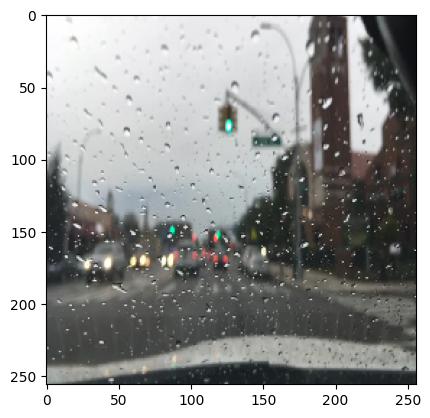

In [ ]:
sampel = 23
print(file_name[sampel])
plt.imshow(day_data[sampel].astype('uint8'))

0f9fbe4b-081bb395.jpg


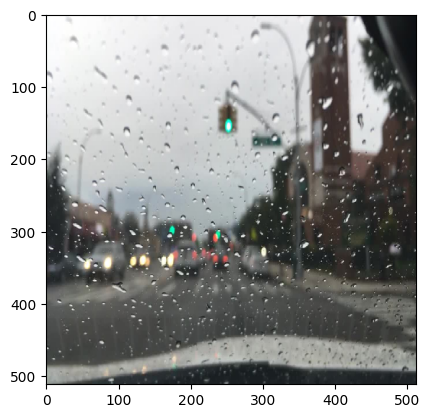

In [ ]:
print(file_name[sampel])
plt.imshow(day_data_512[sampel].astype('uint8'))

In [ ]:
def preprocess_day_data(data):
	# load compressed arrays
	# unpack arrays
	X1 = data
	# scale from [0,255] to [-1,1]
	X1 = (X1 - 127.5) / 127.5
	return X1

data_day_preprocessed = preprocess_day_data(day_data)
data_day_preprocessed_512 = preprocess_day_data(day_data_512)

In [ ]:
data_day_preprocessed.shape,  data_day_preprocessed_512.shape

((169, 256, 256, 3), (169, 512, 512, 3))

In [ ]:
night_data= g_model_AtoB.predict(data_day_preprocessed)

6/6 [==============================] - 39s 2s/step


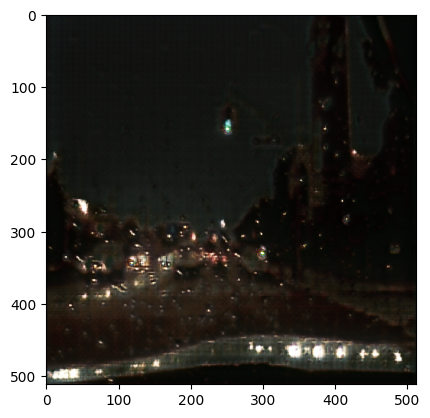

In [ ]:
plt.imshow((night_data[sampel]+1)/2)

In [ ]:
file_name_night = []
for filename in file_name:
  file_name_night.append(filename[:-4]+'_night512.jpg')

In [ ]:
day = (data_day_preprocessed+1)/2
day512 = (data_day_preprocessed_512+1)/2
night512 = (night_data+1)/2

In [ ]:
path_gen_image = '/content/gdrive/MyDrive/uvcgan512_yolo/images/'
path_gen_label = '/content/gdrive/MyDrive/uvcgan512_yolo/labels/'

def save_generated_images(day512,night512,filename_day,new_path):

  filename_night = []
  for filename in filename_day:
    filename_night.append(filename[:-4]+'_night512.jpg')

  path_gen = '/content/gdrive/MyDrive/' + new_path + '/'

  # Check if the directory exists
  if not os.path.exists(path_gen):
    os.mkdir(path_gen)
  else:
    print(f"Directory '{path_gen}' already exists.")

  path_gen_image = '/content/gdrive/MyDrive/' + new_path + '/images/'

  # Check if the directory exists
  if not os.path.exists(path_gen_image):
    os.mkdir(path_gen_image)
  else:
    print(f"Directory '{path_gen_image}' already exists.")

  path_gen_label = '/content/gdrive/MyDrive/' + new_path + '/labels/'

  # Check if the directory exists
  if not os.path.exists(path_gen_label):
    os.mkdir(path_gen_label)
  else:
    print(f"Directory '{path_gen_label}' already exists.")

  for d,fd,n,fn in zip(day512,filename_day,night512,filename_night):
    #day
    im_day = cv2.cvtColor(d*255,cv2.COLOR_BGR2RGB)
    cv2.imwrite(path_gen_image + fd, im_day)
    print(path_gen_image + fd)
    #night
    im_night = cv2.cvtColor(n*255,cv2.COLOR_BGR2RGB)
    cv2.imwrite(path_gen_image + fn, im_night)
    print(path_gen_image + fn)

In [ ]:
save_generated_images(day512,night512,file_name,'uvcgan_512_yolo')

Directory '/content/gdrive/MyDrive/uvcgan_512_yolo/' already exists.
Directory '/content/gdrive/MyDrive/uvcgan_512_yolo/images/' already exists.
Directory '/content/gdrive/MyDrive/uvcgan_512_yolo/labels/' already exists.
/content/gdrive/MyDrive/uvcgan_512_yolo/images/0bc0b27e-a94dd126.jpg
/content/gdrive/MyDrive/uvcgan_512_yolo/images/0bc0b27e-a94dd126_night512.jpg
/content/gdrive/MyDrive/uvcgan_512_yolo/images/Image_60.jpg
/content/gdrive/MyDrive/uvcgan_512_yolo/images/Image_60_night512.jpg
/content/gdrive/MyDrive/uvcgan_512_yolo/images/3faf005a-c222f370.jpg
/content/gdrive/MyDrive/uvcgan_512_yolo/images/3faf005a-c222f370_night512.jpg
/content/gdrive/MyDrive/uvcgan_512_yolo/images/Image_64.jpg
/content/gdrive/MyDrive/uvcgan_512_yolo/images/Image_64_night512.jpg
/content/gdrive/MyDrive/uvcgan_512_yolo/images/5af52d67-de2ce960.jpg
/content/gdrive/MyDrive/uvcgan_512_yolo/images/5af52d67-de2ce960_night512.jpg
/content/gdrive/MyDrive/uvcgan_512_yolo/images/0e9e8f3e-55cd30d7.jpg
/content/gd

In [ ]:
a = cv2.imread('/content/gdrive/MyDrive/uvcgan_512_yolo/images/0f9fbe4b-081bb395_night512.jpg')
a = cv2.cvtColor(a,cv2.COLOR_BGR2RGB)
print(a.shape)
plt.imshow(a)

# generate data for yolo (UNet-ViT + ESRGAN+)

In [ ]:
# load all images in a directory into memory
def load_images_nfilename(path, size=(256,256)):
	data_list = list()
	data_list512 = list()
	file_name = []
	# enumerate filenames in directory, assume all are images
	for filename in os.listdir(path):
		# load and resize the image
		pixels = load_img(path + filename, target_size=size)
		pixels512 = load_img(path + filename, target_size=(512,512))
		# convert to numpy array
		pixels = img_to_array(pixels)
		pixels512 = img_to_array(pixels512)
		# store
		data_list.append(pixels)
		data_list512.append(pixels512)
		file_name.append(filename)
	return asarray(data_list), asarray(data_list512), file_name

# dataset path
path = '/content/day2night/'

# load dataset A - day
day_data,day_data_512,file_name = load_images_nfilename(path + 'trainDay/')
print('Loaded data_day: ', day_data.shape)
print('Loeaded data_dat_512: ', day_data_512.shape)

Loaded data_day:  (169, 256, 256, 3)
Loeaded data_dat_512:  (169, 512, 512, 3)


1cbc711c-205586b2.jpg


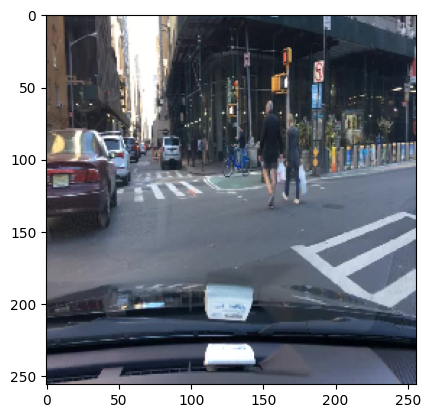

In [ ]:
sampel = 23
print(file_name[sampel])
plt.imshow(day_data[sampel].astype('uint8'))

1cbc711c-205586b2.jpg


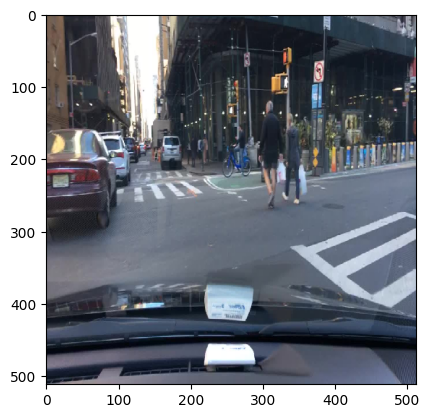

In [ ]:
print(file_name[sampel])
plt.imshow(day_data_512[sampel].astype('uint8'))

In [ ]:
def preprocess_day_data(data):
	# load compressed arrays
	# unpack arrays
	X1 = data
	# scale from [0,255] to [-1,1]
	X1 = (X1 - 127.5) / 127.5
	return X1

data_day_preprocessed = preprocess_day_data(day_data)
data_day_preprocessed_512 = preprocess_day_data(day_data_512)

In [ ]:
data_day_preprocessed.shape,  data_day_preprocessed_512.shape

((169, 256, 256, 3), (169, 512, 512, 3))

In [ ]:
_,night_data= g_model_AtoB.predict(data_day_preprocessed)

6/6 [==============================] - 10s 2s/step


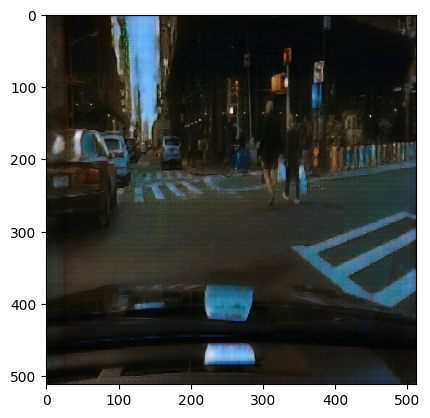

In [ ]:
plt.imshow((night_data[sampel]+1)/2)

In [ ]:
file_name_night = []
for filename in file_name:
  file_name_night.append(filename[:-4]+'_night512.jpg')

In [ ]:
day = (data_day_preprocessed+1)/2
day512 = (data_day_preprocessed_512+1)/2
night512 = (night_data+1)/2

In [ ]:
path_gen_image = '/content/gdrive/MyDrive/uvcgan512_enlighten_yolo/images/'
path_gen_label = '/content/gdrive/MyDrive/uvcgan512_enlighten_yolo/labels/'

def save_generated_images(day512,night512,filename_day,new_path):

  filename_night = []
  for filename in filename_day:
    filename_night.append(filename[:-4]+'_night512.jpg')

  path_gen = '/content/gdrive/MyDrive/' + new_path + '/'

  # Check if the directory exists
  if not os.path.exists(path_gen):
    os.mkdir(path_gen)
  else:
    print(f"Directory '{path_gen}' already exists.")

  path_gen_image = '/content/gdrive/MyDrive/' + new_path + '/images/'

  # Check if the directory exists
  if not os.path.exists(path_gen_image):
    os.mkdir(path_gen_image)
  else:
    print(f"Directory '{path_gen_image}' already exists.")

  path_gen_label = '/content/gdrive/MyDrive/' + new_path + '/labels/'

  # Check if the directory exists
  if not os.path.exists(path_gen_label):
    os.mkdir(path_gen_label)
  else:
    print(f"Directory '{path_gen_label}' already exists.")

  for d,fd,n,fn in zip(day512,filename_day,night512,filename_night):
    #day
    im_day = cv2.cvtColor(d*255,cv2.COLOR_BGR2RGB)
    cv2.imwrite(path_gen_image + fd, im_day)
    print(path_gen_image + fd)
    #night
    im_night = cv2.cvtColor(n*255,cv2.COLOR_BGR2RGB)
    cv2.imwrite(path_gen_image + fn, im_night)
    print(path_gen_image + fn)

In [ ]:
save_generated_images(day512,night512,file_name,'uvcgan512_enlighten_yolo')

/content/gdrive/MyDrive/uvcgan512_enlighten_yolo/images/1c1de1e7-346d6219.jpg
/content/gdrive/MyDrive/uvcgan512_enlighten_yolo/images/1c1de1e7-346d6219_night512.jpg
/content/gdrive/MyDrive/uvcgan512_enlighten_yolo/images/Image_56.jpg
/content/gdrive/MyDrive/uvcgan512_enlighten_yolo/images/Image_56_night512.jpg
/content/gdrive/MyDrive/uvcgan512_enlighten_yolo/images/Image_25.jpg
/content/gdrive/MyDrive/uvcgan512_enlighten_yolo/images/Image_25_night512.jpg
/content/gdrive/MyDrive/uvcgan512_enlighten_yolo/images/00f7eac8-5193d600.jpg
/content/gdrive/MyDrive/uvcgan512_enlighten_yolo/images/00f7eac8-5193d600_night512.jpg
/content/gdrive/MyDrive/uvcgan512_enlighten_yolo/images/0dc3d787-4982a6e6.jpg
/content/gdrive/MyDrive/uvcgan512_enlighten_yolo/images/0dc3d787-4982a6e6_night512.jpg
/content/gdrive/MyDrive/uvcgan512_enlighten_yolo/images/Image_57.jpg
/content/gdrive/MyDrive/uvcgan512_enlighten_yolo/images/Image_57_night512.jpg
/content/gdrive/MyDrive/uvcgan512_enlighten_yolo/images/4cd91231

(512, 512, 3)


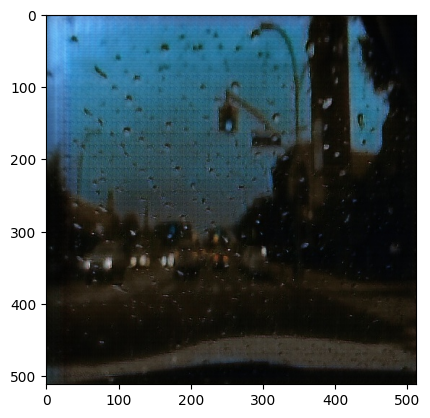

In [ ]:
a = cv2.imread('/content/gdrive/MyDrive/uvcgan512_enlighten_yolo/images/0f9fbe4b-081bb395_night512.jpg')
a = cv2.cvtColor(a,cv2.COLOR_BGR2RGB)
print(a.shape)
plt.imshow(a)

# Save image one by one

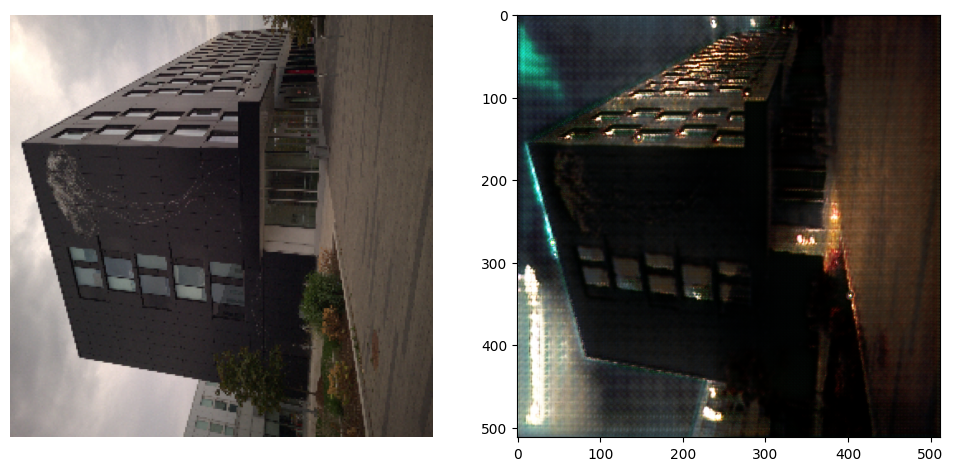

In [ ]:
sample = 156
plt.figure(figsize=(12, 6))

plt.subplot(1,2,1)
plt.imshow((day[sample] + 1)/2)
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow((night_generated_HRDisc[sample] + 1)/2)

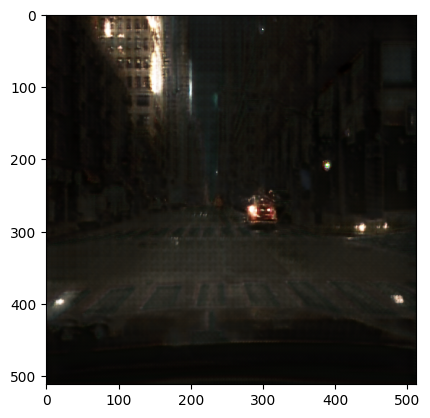

In [ ]:
sample_n = 0
plt.imshow((night_generated_HRDisc[sample_n] + 1)/2)
plt.savefig(f'night_{sample}.png')

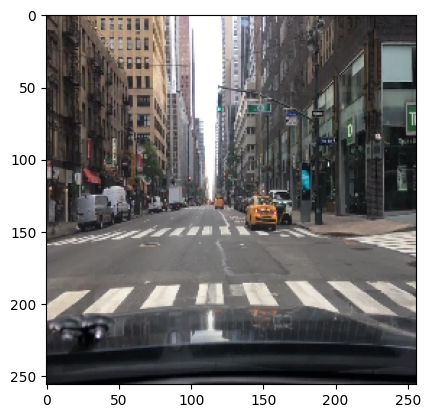

In [ ]:
plt.imshow((day[sample_n] + 1)/2)
# plt.savefig(f'day_{a}.png')